All the code is the same, but it is applied to different articles, I tried to go through the whole folder of articles, but it got an error, so I ran them one by one.

In [437]:
##10608912.txt

Brad: 3
Columbia: 258
Eddie: 34
Betty Munroe: 1
Everett Scott: 0
Frank N. Furter: 121
Janet Weiss: 6
Magenta: 323
Riff Raff: 84
Ralph Hapschatt: 1
Rocky: 9


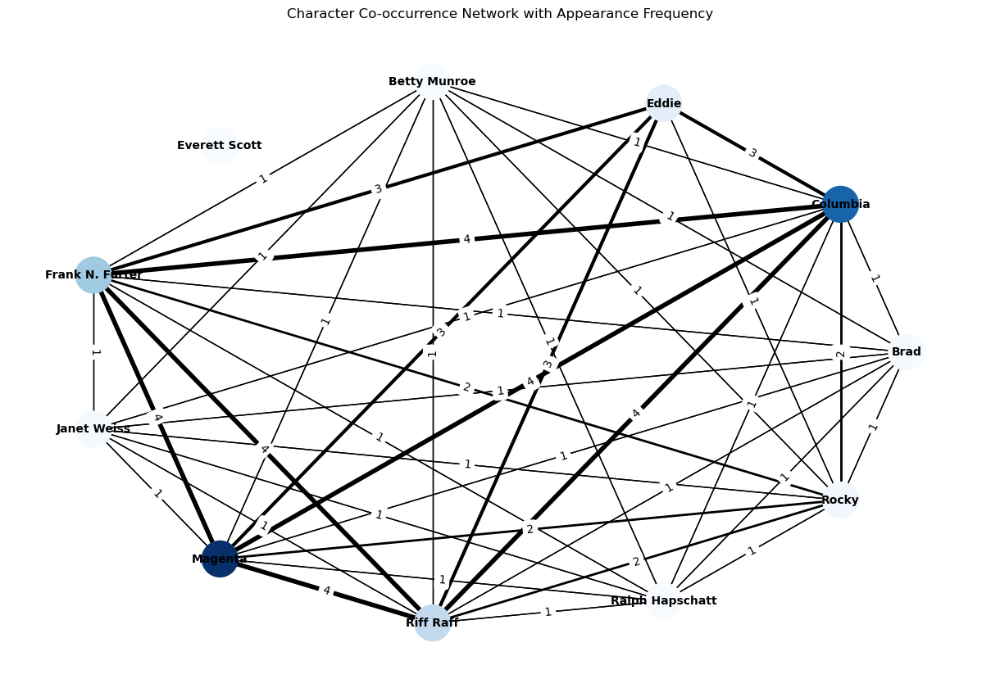


Degree Centrality:
Brad: 0.8000
Columbia: 0.9000
Eddie: 0.5000
Betty Munroe: 0.8000
Everett Scott: 0.0000
Frank N. Furter: 0.9000
Janet Weiss: 0.8000
Magenta: 0.9000
Riff Raff: 0.9000
Ralph Hapschatt: 0.8000
Rocky: 0.9000
Network density: 0.7454545454545455


In [12]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)

# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/10608912.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")

density = nx.density(G)
print("Network density:", density)



In [440]:

closeness_centrality = nx.closeness_centrality(G)
print("\nCloseness Centrality:")
for name, centrality in closeness_centrality.items():
    print(f"{name}: {centrality:.4f}")


betweenness_centrality = nx.betweenness_centrality(G)
print("\nBetweenness Centrality:")
for name, centrality in betweenness_centrality.items():
    print(f"{name}: {centrality:.4f}")


Closeness Centrality:
Brad: 0.8100
Columbia: 0.9000
Eddie: 0.6231
Betty Munroe: 0.8100
Everett Scott: 0.0000
Frank N. Furter: 0.9000
Janet Weiss: 0.8100
Magenta: 0.9000
Riff Raff: 0.9000
Ralph Hapschatt: 0.8100
Rocky: 0.9000

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0178
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0178
Janet Weiss: 0.0000
Magenta: 0.0178
Riff Raff: 0.0178
Ralph Hapschatt: 0.0000
Rocky: 0.0178


In [441]:
##1060979.txt

Brad: 0
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 4
Janet Weiss: 0
Magenta: 50
Riff Raff: 77
Ralph Hapschatt: 0
Rocky: 0


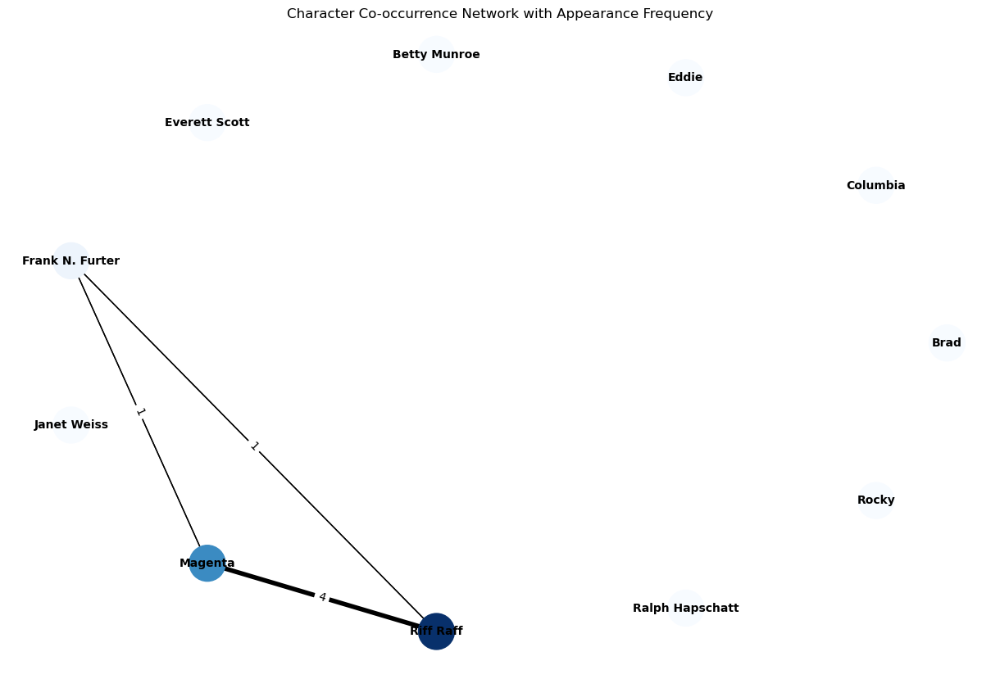


Degree Centrality:
Brad: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.2000
Janet Weiss: 0.0000
Magenta: 0.2000
Riff Raff: 0.2000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.05454545454545454


In [2]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/1060979.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [443]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")

# 计算紧密中心性
closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

# 计算中介中心性
betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 3
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000


这样的结果表示网络包含3个节点，并且是连通的，即所有节点都可以通过路径相互到达，因此连通组件数量为1。由于网络中的每对节点都有连接，因此网络密度为1，表示网络非常密集。

紧密中心性和中介中心性是节点在网络中的重要性指标。在这个例子中，所有节点的紧密中心性和中介中心性均为最大值（1.0000），这表示每个节点都是网络中最重要的节点之一。

对于紧密中心性来说，它衡量了节点到其他所有节点的平均距离的倒数。在这里，所有节点到其他节点的距离都是1，因此紧密中心性为1，表明每个节点都与网络中的其他节点紧密相连。

中介中心性衡量了节点在网络中的信息传播过程中的重要性，其值越高表示节点在网络中更为关键。在这个例子中，所有节点的中介中心性都为0，这可能是因为网络太小，所有节点都可以直接相互连接，不存在必须通过某个节点才能到达其他节点的情况。

In [444]:
##1061993.txt

Brad: 0
Columbia: 20
Eddie: 17
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 69
Janet Weiss: 0
Magenta: 23
Riff Raff: 5
Ralph Hapschatt: 0
Rocky: 0


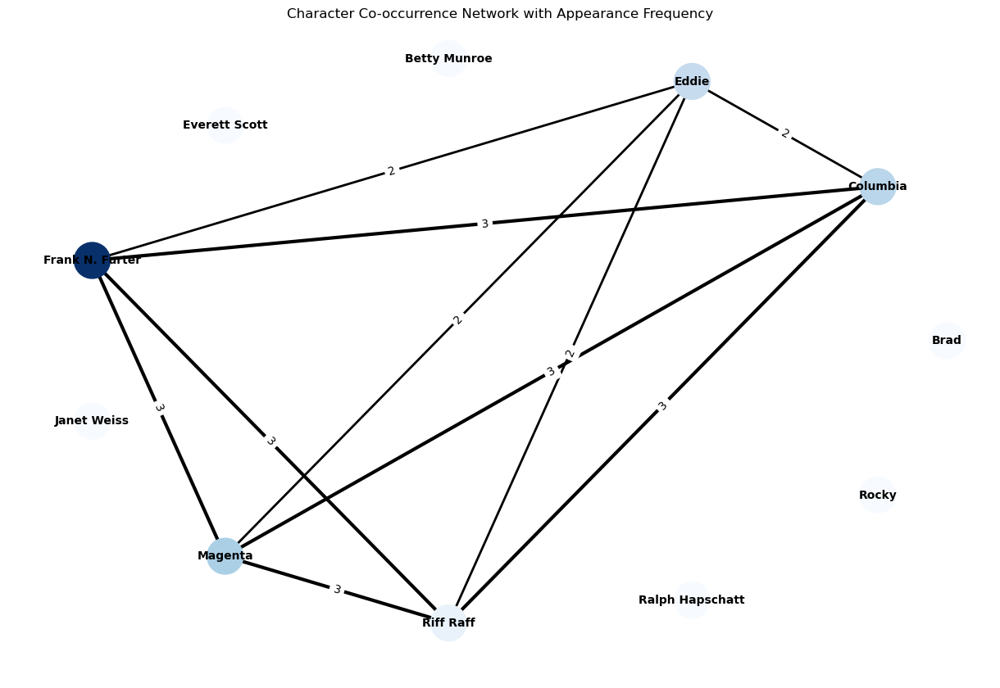


Degree Centrality:
Brad: 0.0000
Columbia: 0.4000
Eddie: 0.4000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.4000
Janet Weiss: 0.0000
Magenta: 0.4000
Riff Raff: 0.4000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.18181818181818182


In [3]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/1061993.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [446]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 5
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Magenta: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Riff Raff: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Magenta: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Riff Raff: 0.0000


In [447]:
##10748502.txt

Brad: 0
Columbia: 6
Eddie: 1
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 5
Janet Weiss: 0
Magenta: 4
Riff Raff: 3
Ralph Hapschatt: 0
Rocky: 4


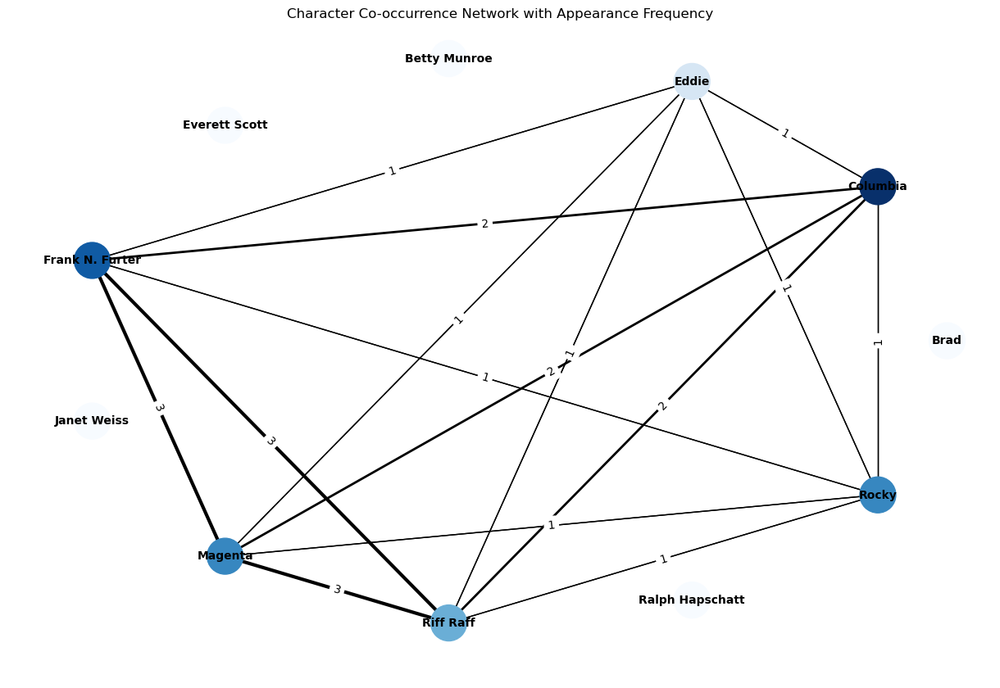


Degree Centrality:
Brad: 0.0000
Columbia: 0.5000
Eddie: 0.5000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.5000
Janet Weiss: 0.0000
Magenta: 0.5000
Riff Raff: 0.5000
Ralph Hapschatt: 0.0000
Rocky: 0.5000
Network density: 0.2727272727272727


In [4]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/10748502.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [449]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 6
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Columbia: 1.0000
Eddie: 1.0000
Frank N. Furter: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Columbia: 0.0000
Eddie: 0.0000
Frank N. Furter: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Rocky: 0.0000


In [450]:
##10777800.txt

Brad: 0
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 1
Janet Weiss: 0
Magenta: 2
Riff Raff: 3
Ralph Hapschatt: 0
Rocky: 0


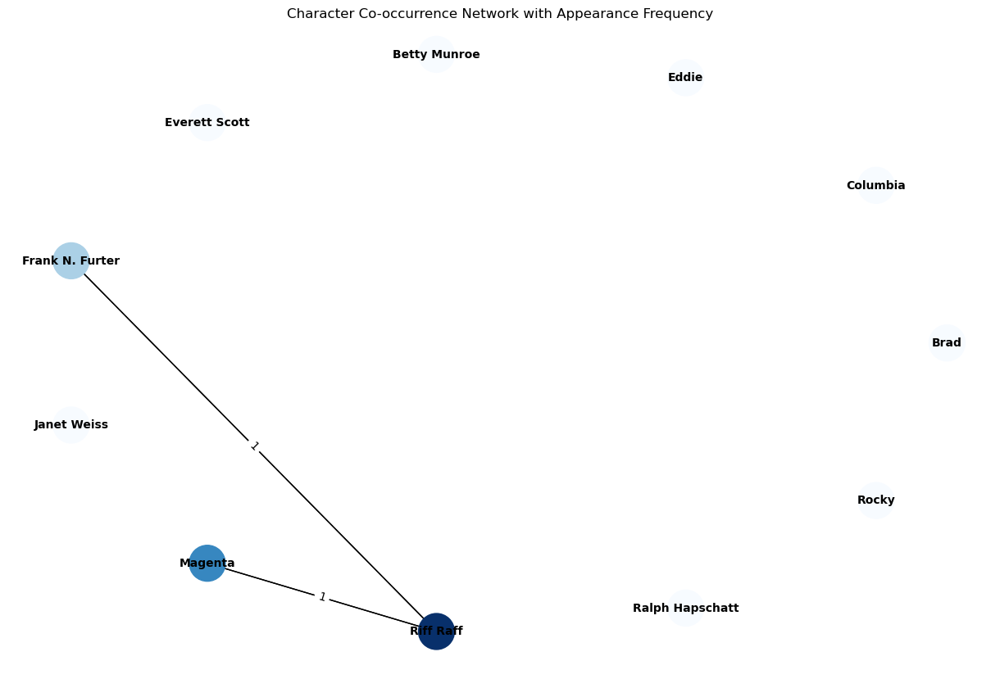


Degree Centrality:
Brad: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.1000
Janet Weiss: 0.0000
Magenta: 0.1000
Riff Raff: 0.2000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.03636363636363636


In [5]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/10777800.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")

density = nx.density(G)
print("Network density:", density)

In [452]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 3
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.6667

Closeness Centrality:
Frank N. Furter: 0.6667
Magenta: 0.6667
Riff Raff: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Magenta: 0.0000
Riff Raff: 1.0000


In [453]:
##11213277.txt

Brad: 122
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 83
Janet Weiss: 20
Magenta: 1
Riff Raff: 4
Ralph Hapschatt: 0
Rocky: 1


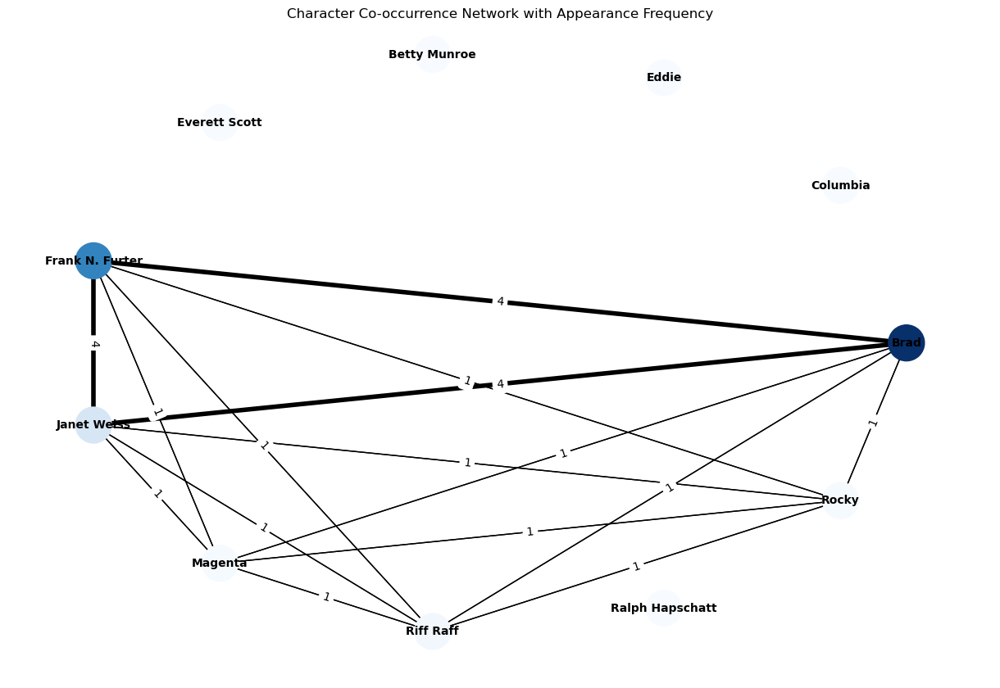


Degree Centrality:
Brad: 0.5000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.5000
Janet Weiss: 0.5000
Magenta: 0.5000
Riff Raff: 0.5000
Ralph Hapschatt: 0.0000
Rocky: 0.5000
Network density: 0.2727272727272727


In [3]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/11213277.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [455]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 6
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Brad: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Rocky: 0.0000


In [456]:
##12090570.txt

Brad: 35
Columbia: 38
Eddie: 201
Betty Munroe: 7
Everett Scott: 0
Frank N. Furter: 209
Janet Weiss: 41
Magenta: 161
Riff Raff: 58
Ralph Hapschatt: 5
Rocky: 89


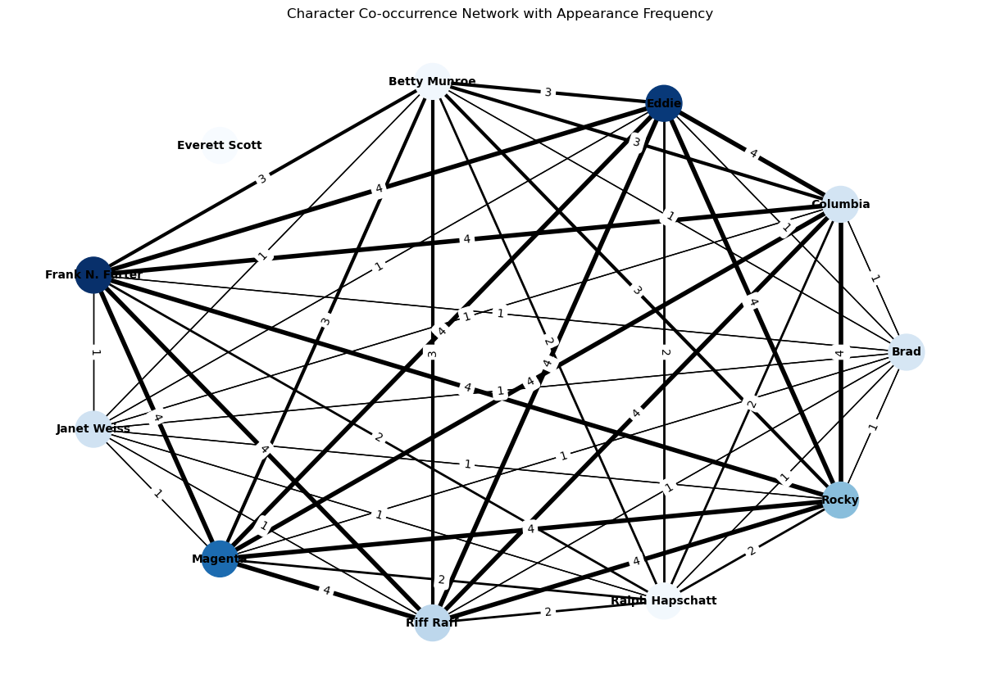


Degree Centrality:
Brad: 0.9000
Columbia: 0.9000
Eddie: 0.9000
Betty Munroe: 0.9000
Everett Scott: 0.0000
Frank N. Furter: 0.9000
Janet Weiss: 0.9000
Magenta: 0.9000
Riff Raff: 0.9000
Ralph Hapschatt: 0.9000
Rocky: 0.9000
Network density: 0.8181818181818182


In [4]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/12090570.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [458]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 10
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Betty Munroe: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Ralph Hapschatt: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.0000


In [459]:
##12787710.txt

Brad: 0
Columbia: 0
Eddie: 16
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 42
Janet Weiss: 0
Magenta: 14
Riff Raff: 19
Ralph Hapschatt: 0
Rocky: 16


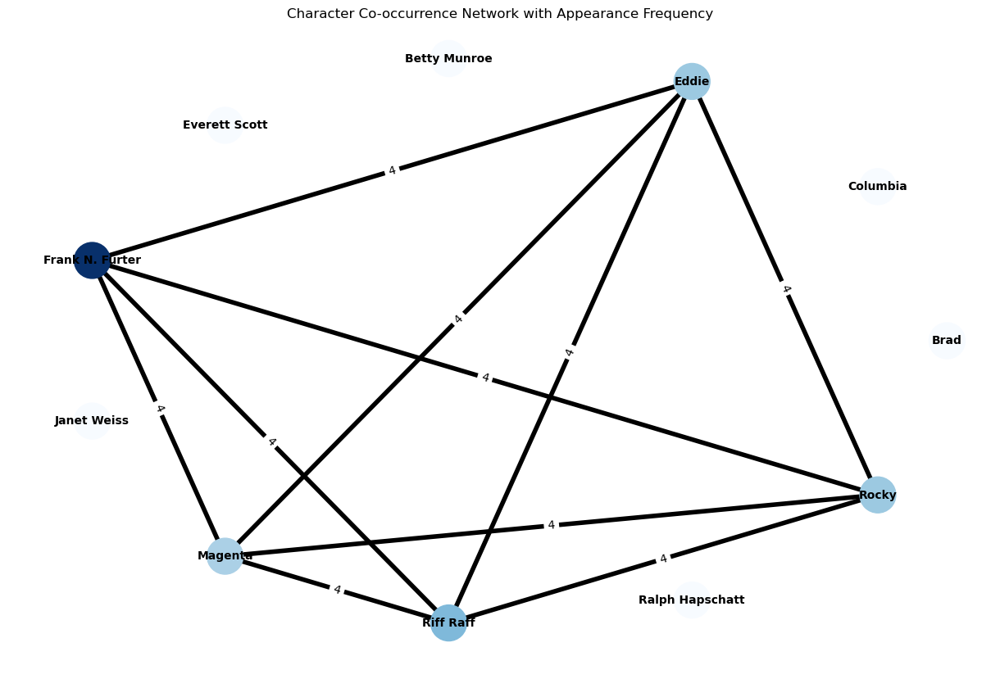


Degree Centrality:
Brad: 0.0000
Columbia: 0.0000
Eddie: 0.4000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.4000
Janet Weiss: 0.0000
Magenta: 0.4000
Riff Raff: 0.4000
Ralph Hapschatt: 0.0000
Rocky: 0.4000
Network density: 0.18181818181818182


In [6]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/12787710.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [461]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 5
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Magenta: 1.0000
Rocky: 1.0000
Eddie: 1.0000
Riff Raff: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Magenta: 0.0000
Rocky: 0.0000
Eddie: 0.0000
Riff Raff: 0.0000


In [462]:
##13917528.txt


Brad: 0
Columbia: 14
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 62
Janet Weiss: 1
Magenta: 14
Riff Raff: 15
Ralph Hapschatt: 0
Rocky: 19


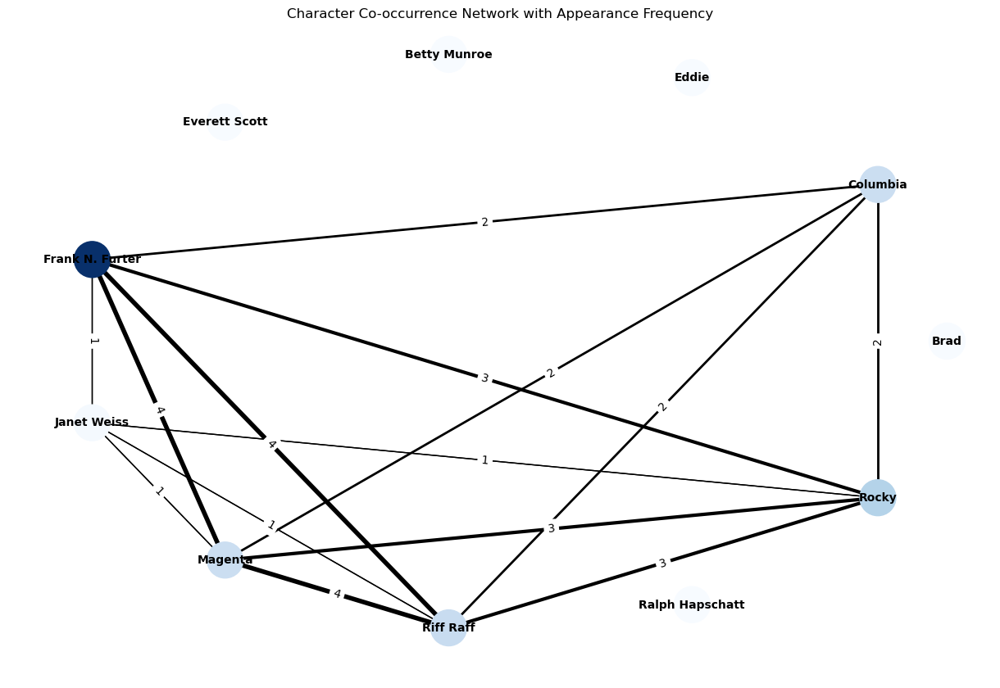


Degree Centrality:
Brad: 0.0000
Columbia: 0.4000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.5000
Janet Weiss: 0.4000
Magenta: 0.5000
Riff Raff: 0.5000
Ralph Hapschatt: 0.0000
Rocky: 0.5000
Network density: 0.2545454545454545


In [7]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/13917528.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [464]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 6
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.9333

Closeness Centrality:
Columbia: 0.8333
Frank N. Furter: 1.0000
Janet Weiss: 0.8333
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Columbia: 0.0000
Frank N. Furter: 0.0250
Janet Weiss: 0.0000
Magenta: 0.0250
Riff Raff: 0.0250
Rocky: 0.0250


In [465]:
## 13979313.txt

Brad: 0
Columbia: 14
Eddie: 40
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 53
Janet Weiss: 0
Magenta: 6
Riff Raff: 23
Ralph Hapschatt: 0
Rocky: 7


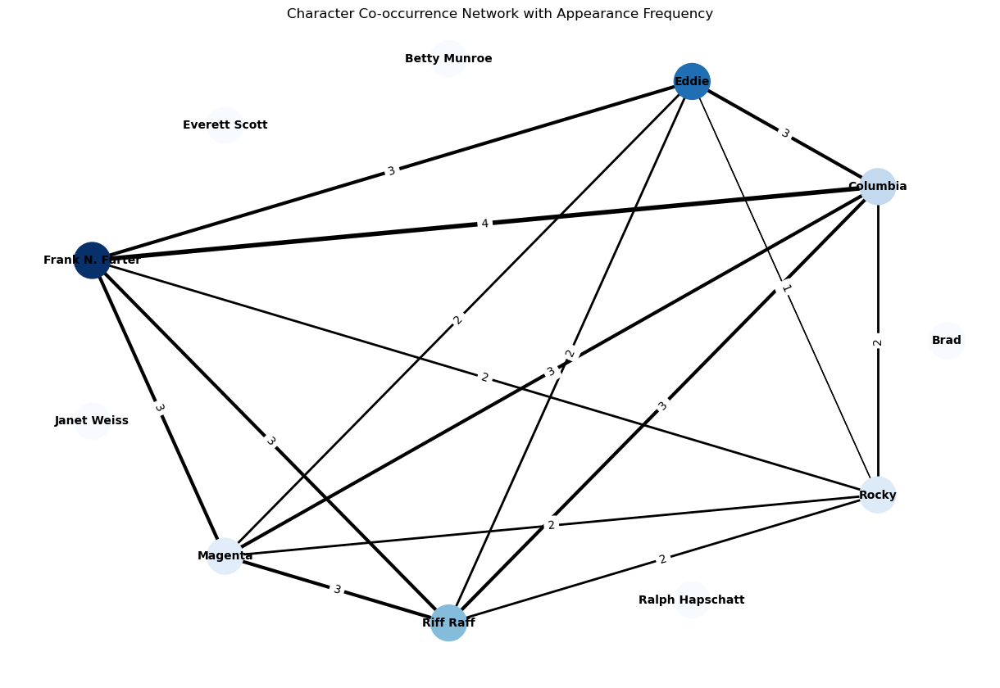


Degree Centrality:
Brad: 0.0000
Columbia: 0.5000
Eddie: 0.5000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.5000
Janet Weiss: 0.0000
Magenta: 0.5000
Riff Raff: 0.5000
Ralph Hapschatt: 0.0000
Rocky: 0.5000
Network density: 0.2727272727272727


In [8]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/13979313.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [467]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 6
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Columbia: 1.0000
Eddie: 1.0000
Frank N. Furter: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Columbia: 0.0000
Eddie: 0.0000
Frank N. Furter: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Rocky: 0.0000


In [468]:
##1409260.txt

Brad: 40
Columbia: 7
Eddie: 1
Betty Munroe: 2
Everett Scott: 1
Frank N. Furter: 60
Janet Weiss: 18
Magenta: 10
Riff Raff: 13
Ralph Hapschatt: 0
Rocky: 7


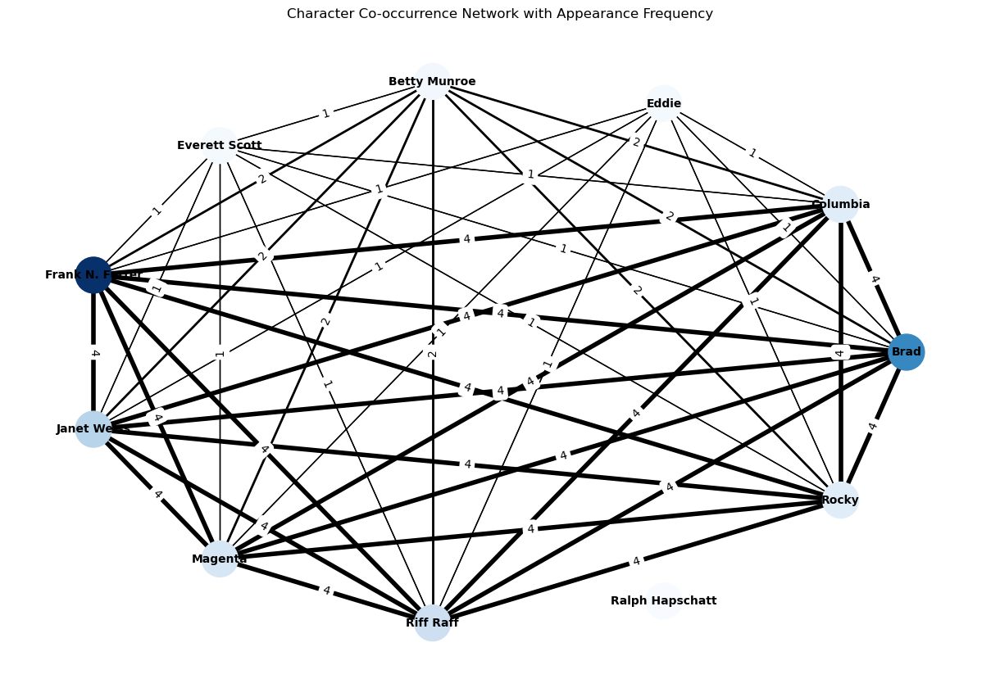


Degree Centrality:
Brad: 0.9000
Columbia: 0.9000
Eddie: 0.7000
Betty Munroe: 0.8000
Everett Scott: 0.8000
Frank N. Furter: 0.9000
Janet Weiss: 0.9000
Magenta: 0.9000
Riff Raff: 0.9000
Ralph Hapschatt: 0.0000
Rocky: 0.9000
Network density: 0.7818181818181819


In [9]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/1409260.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [470]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 10
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.9556

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 0.8182
Betty Munroe: 0.9000
Everett Scott: 0.9000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0079
Columbia: 0.0079
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0079
Janet Weiss: 0.0079
Magenta: 0.0079
Riff Raff: 0.0079
Rocky: 0.0079


In [471]:
##14427576.txt

Brad: 0
Columbia: 217
Eddie: 1
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 37
Janet Weiss: 0
Magenta: 196
Riff Raff: 40
Ralph Hapschatt: 0
Rocky: 0


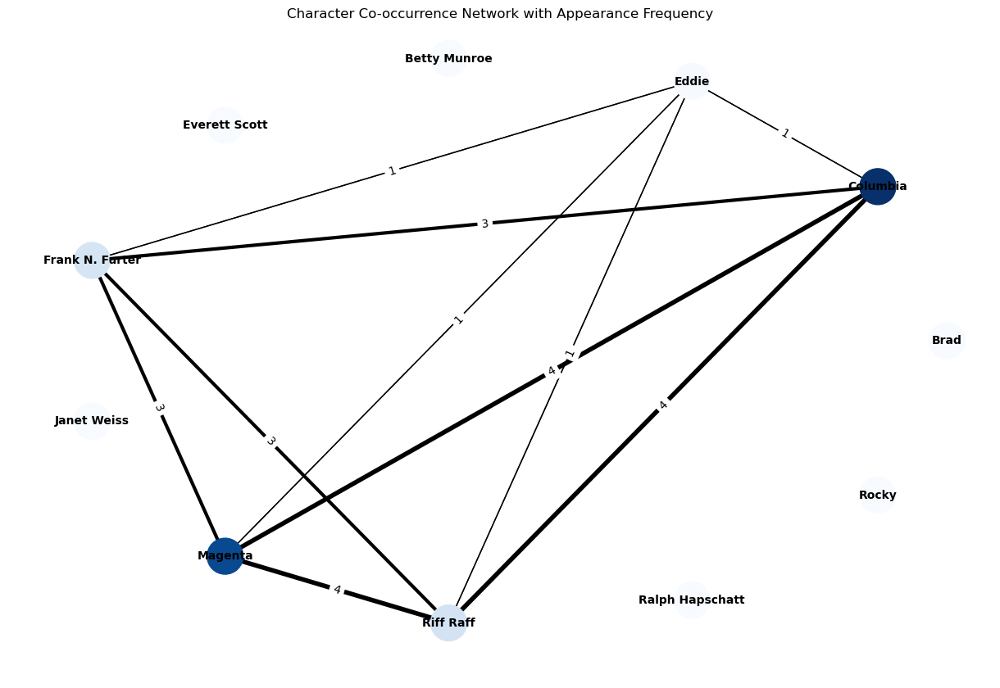


Degree Centrality:
Brad: 0.0000
Columbia: 0.4000
Eddie: 0.4000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.4000
Janet Weiss: 0.0000
Magenta: 0.4000
Riff Raff: 0.4000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.18181818181818182


In [10]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/14427576.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [473]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 5
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Magenta: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Riff Raff: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Magenta: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Riff Raff: 0.0000


In [474]:
## 14718293.txt

Brad: 6
Columbia: 13
Eddie: 7
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 47
Janet Weiss: 8
Magenta: 12
Riff Raff: 17
Ralph Hapschatt: 0
Rocky: 3


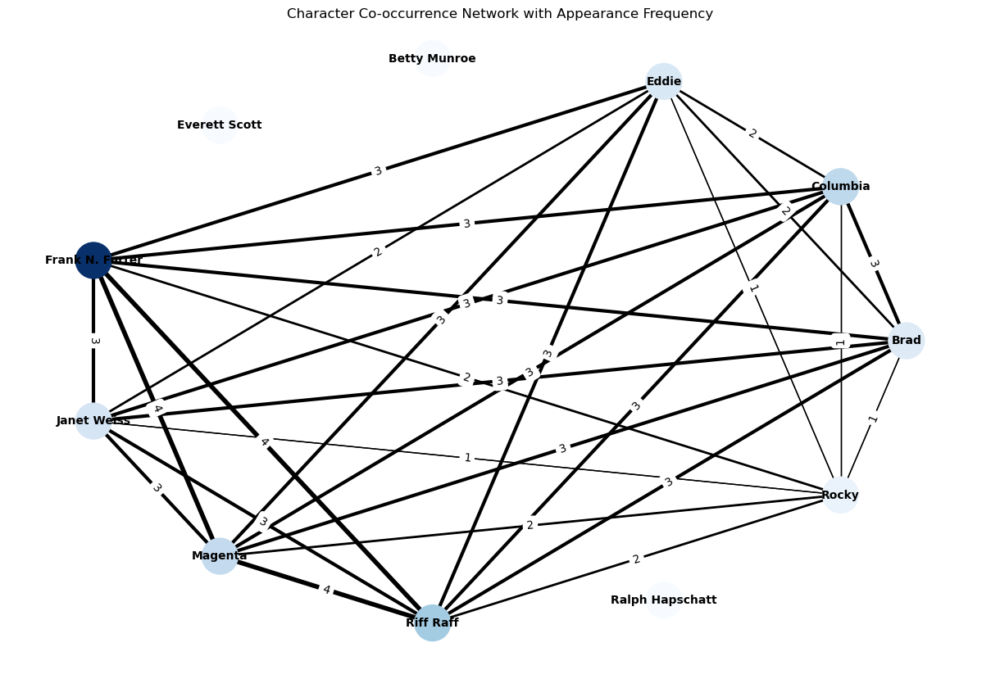


Degree Centrality:
Brad: 0.7000
Columbia: 0.7000
Eddie: 0.7000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.7000
Janet Weiss: 0.7000
Magenta: 0.7000
Riff Raff: 0.7000
Ralph Hapschatt: 0.0000
Rocky: 0.7000
Network density: 0.509090909090909


In [11]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/14718293.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [476]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 8
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Rocky: 0.0000


In [477]:
##1578.txt

Brad: 0
Columbia: 95
Eddie: 13
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 68
Janet Weiss: 1
Magenta: 53
Riff Raff: 22
Ralph Hapschatt: 0
Rocky: 4


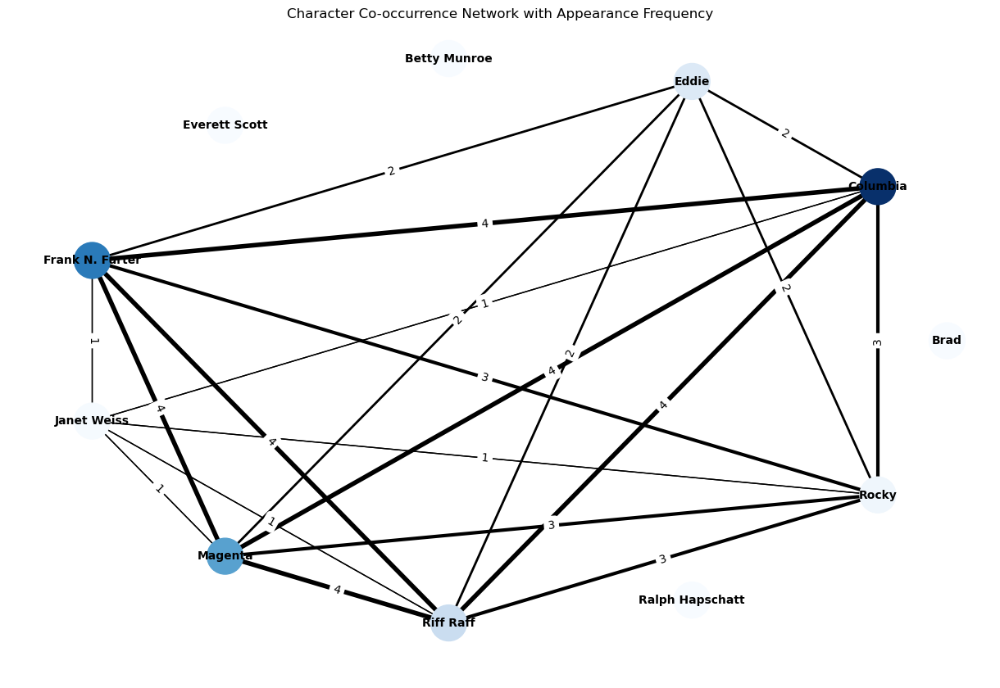


Degree Centrality:
Brad: 0.0000
Columbia: 0.6000
Eddie: 0.5000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.6000
Janet Weiss: 0.5000
Magenta: 0.6000
Riff Raff: 0.6000
Ralph Hapschatt: 0.0000
Rocky: 0.6000
Network density: 0.36363636363636365


In [12]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/1578.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [479]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 7
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.9524

Closeness Centrality:
Columbia: 1.0000
Eddie: 0.8571
Frank N. Furter: 1.0000
Janet Weiss: 0.8571
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Columbia: 0.0133
Eddie: 0.0000
Frank N. Furter: 0.0133
Janet Weiss: 0.0000
Magenta: 0.0133
Riff Raff: 0.0133
Rocky: 0.0133


In [480]:
##1579100.txt

Brad: 2
Columbia: 6
Eddie: 4
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 15
Janet Weiss: 7
Magenta: 4
Riff Raff: 5
Ralph Hapschatt: 0
Rocky: 7


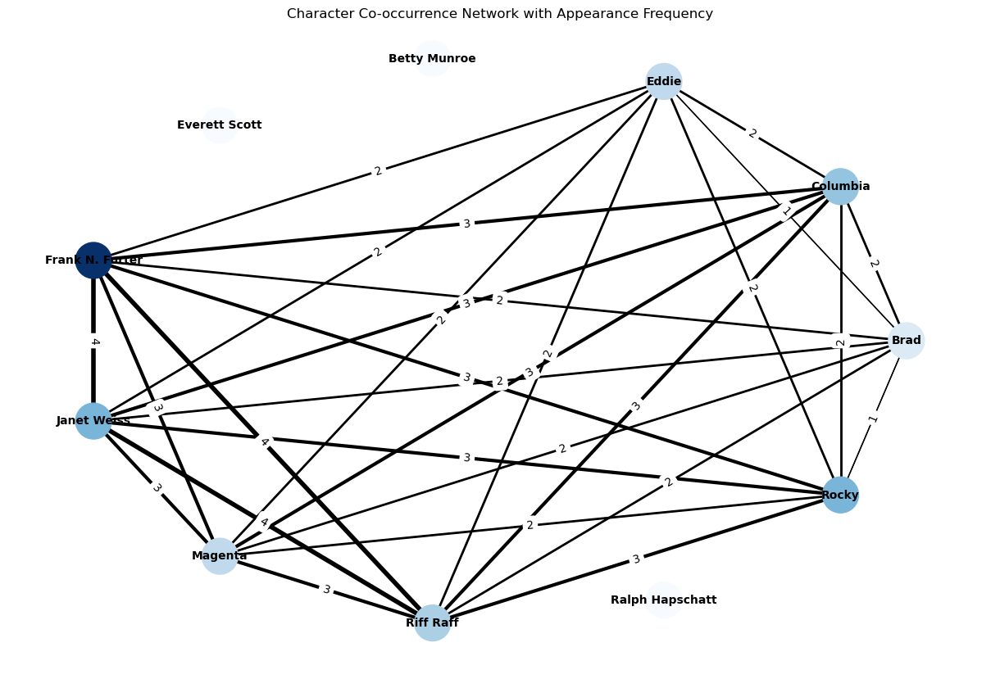


Degree Centrality:
Brad: 0.7000
Columbia: 0.7000
Eddie: 0.7000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.7000
Janet Weiss: 0.7000
Magenta: 0.7000
Riff Raff: 0.7000
Ralph Hapschatt: 0.0000
Rocky: 0.7000
Network density: 0.509090909090909


In [13]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/1579100.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [482]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 8
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Rocky: 0.0000


In [483]:
##15950534.txt

Brad: 20
Columbia: 93
Eddie: 12
Betty Munroe: 0
Everett Scott: 9
Frank N. Furter: 181
Janet Weiss: 34
Magenta: 295
Riff Raff: 242
Ralph Hapschatt: 0
Rocky: 29


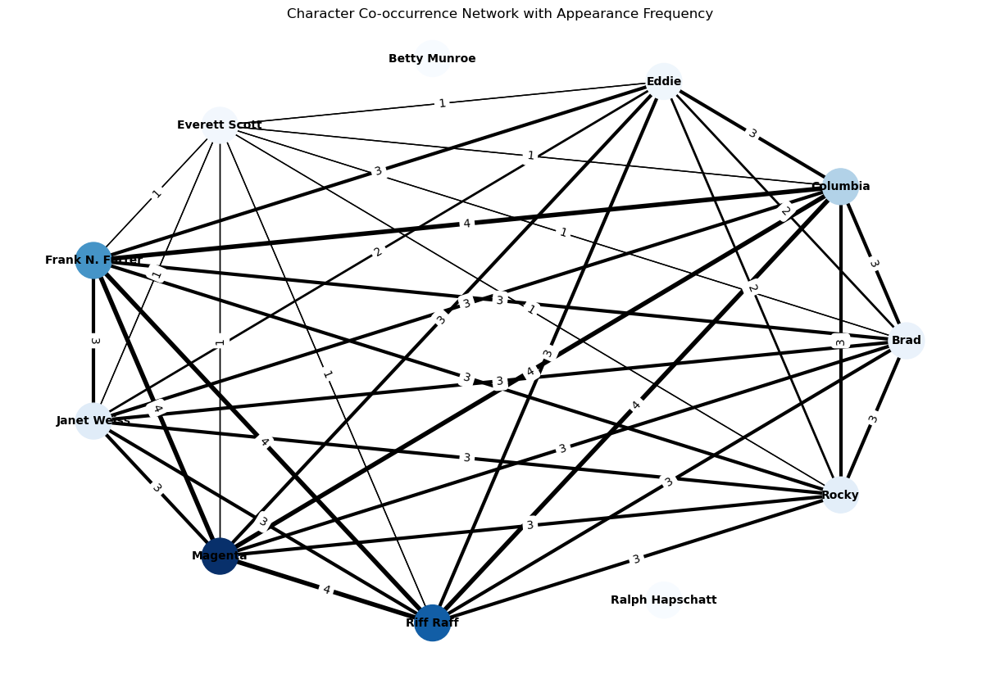


Degree Centrality:
Brad: 0.8000
Columbia: 0.8000
Eddie: 0.8000
Betty Munroe: 0.0000
Everett Scott: 0.8000
Frank N. Furter: 0.8000
Janet Weiss: 0.8000
Magenta: 0.8000
Riff Raff: 0.8000
Ralph Hapschatt: 0.0000
Rocky: 0.8000
Network density: 0.6545454545454545


In [14]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/15950534.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [485]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 9
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Everett Scott: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Rocky: 0.0000


In [486]:
##1749797.txt

Brad: 0
Columbia: 90
Eddie: 58
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 164
Janet Weiss: 0
Magenta: 96
Riff Raff: 154
Ralph Hapschatt: 0
Rocky: 1


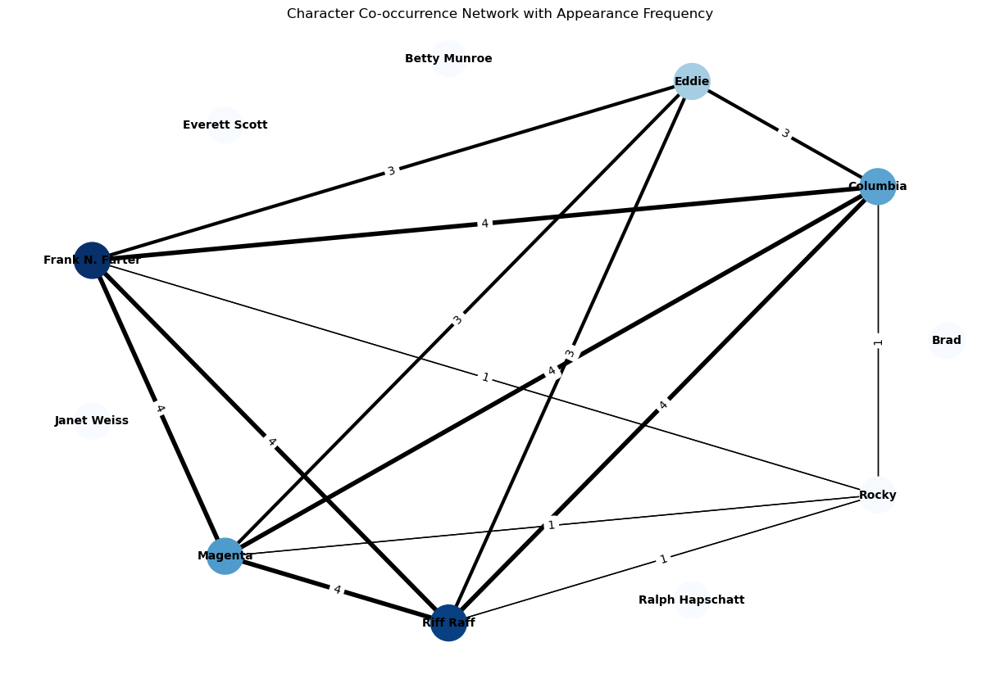


Degree Centrality:
Brad: 0.0000
Columbia: 0.5000
Eddie: 0.4000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.5000
Janet Weiss: 0.0000
Magenta: 0.5000
Riff Raff: 0.5000
Ralph Hapschatt: 0.0000
Rocky: 0.4000
Network density: 0.2545454545454545


In [15]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/1749797.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [488]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 6
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.9333

Closeness Centrality:
Columbia: 1.0000
Eddie: 0.8333
Frank N. Furter: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 0.8333

Betweenness Centrality:
Columbia: 0.0250
Eddie: 0.0000
Frank N. Furter: 0.0250
Magenta: 0.0250
Riff Raff: 0.0250
Rocky: 0.0000


In [489]:
##18528691.txt

Brad: 9
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 7
Janet Weiss: 12
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


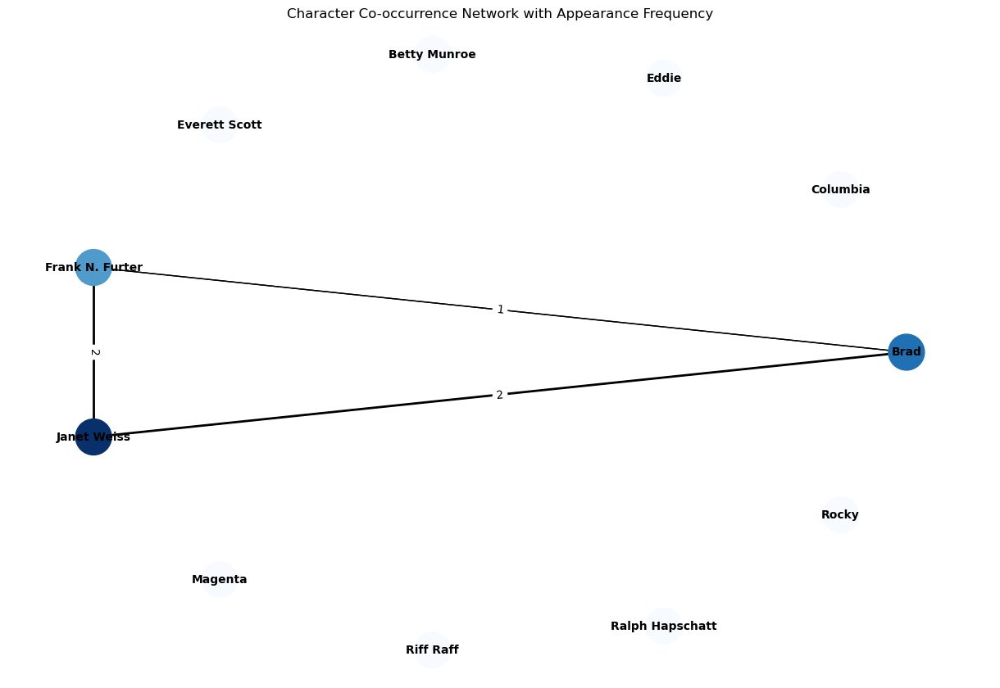


Degree Centrality:
Brad: 0.2000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.2000
Janet Weiss: 0.2000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.05454545454545454


In [16]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/18528691.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [491]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 3
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Brad: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Brad: 0.0000


In [492]:
##19183975.txt

Brad: 0
Columbia: 26
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 1
Janet Weiss: 0
Magenta: 20
Riff Raff: 11
Ralph Hapschatt: 0
Rocky: 0


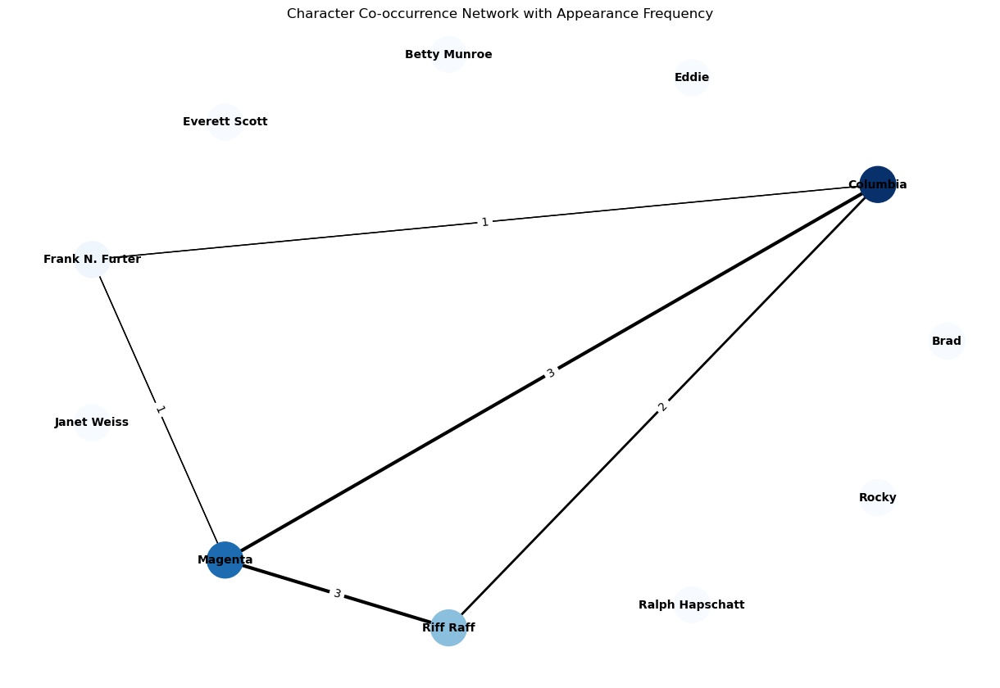


Degree Centrality:
Brad: 0.0000
Columbia: 0.3000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.2000
Janet Weiss: 0.0000
Magenta: 0.3000
Riff Raff: 0.2000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.09090909090909091


In [20]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/19183975.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [494]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 4
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.8333

Closeness Centrality:
Frank N. Furter: 0.7500
Magenta: 1.0000
Riff Raff: 0.7500
Columbia: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Magenta: 0.1667
Riff Raff: 0.0000
Columbia: 0.1667


In [495]:
##19480177.txt

Brad: 0
Columbia: 1
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 44
Janet Weiss: 0
Magenta: 23
Riff Raff: 53
Ralph Hapschatt: 0
Rocky: 0


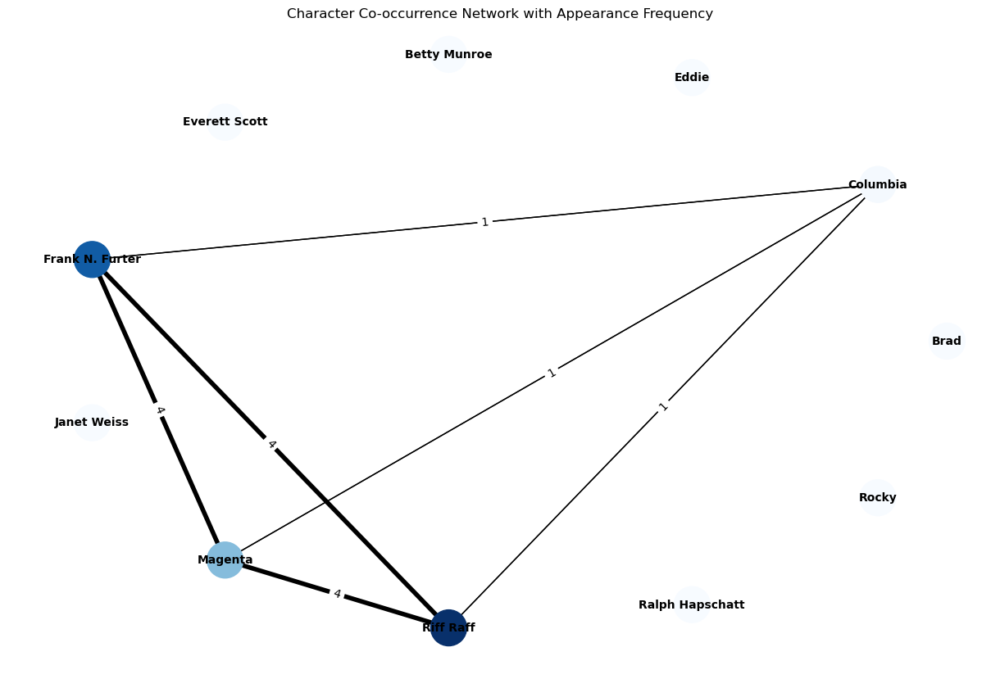


Degree Centrality:
Brad: 0.0000
Columbia: 0.3000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.3000
Janet Weiss: 0.0000
Magenta: 0.3000
Riff Raff: 0.3000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.10909090909090909


In [21]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/19480177.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [497]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 4
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Columbia: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Columbia: 0.0000


In [498]:
##20649923.txt

Brad: 129
Columbia: 10
Eddie: 31
Betty Munroe: 1
Everett Scott: 24
Frank N. Furter: 125
Janet Weiss: 50
Magenta: 5
Riff Raff: 11
Ralph Hapschatt: 2
Rocky: 39


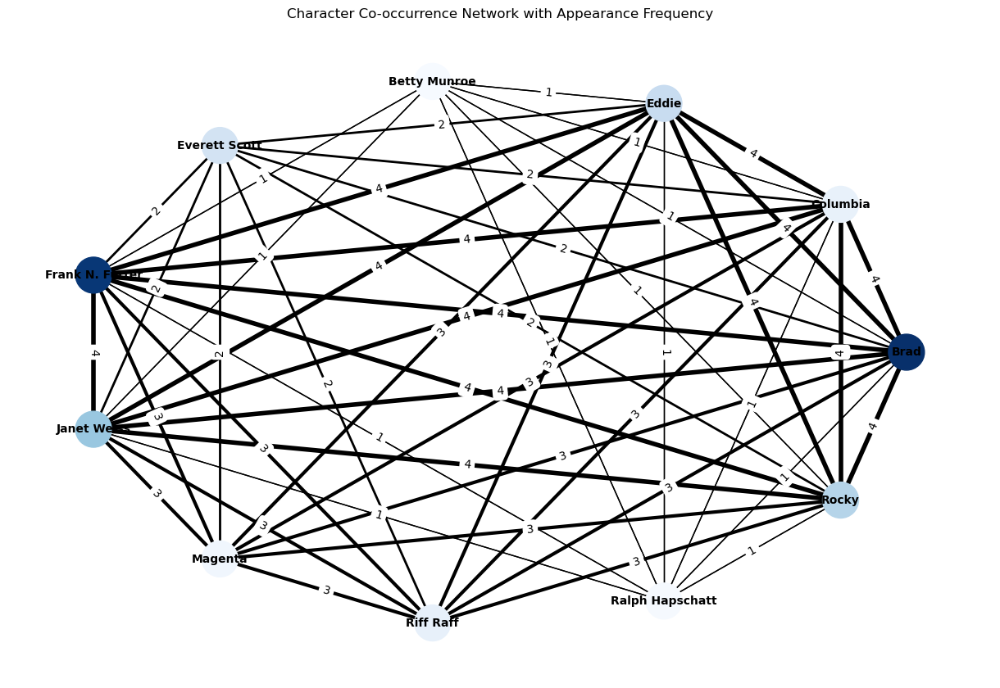


Degree Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Betty Munroe: 0.7000
Everett Scott: 0.8000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 0.8000
Riff Raff: 0.8000
Ralph Hapschatt: 0.7000
Rocky: 1.0000
Network density: 0.8909090909090909


In [22]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/20649923.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [500]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 11
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.8909

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Betty Munroe: 0.7692
Everett Scott: 0.8333
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 0.8333
Riff Raff: 0.8333
Ralph Hapschatt: 0.7692
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0222
Columbia: 0.0222
Eddie: 0.0222
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0222
Janet Weiss: 0.0222
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.0222


In [501]:
###20841947_txt.txt

Brad: 41
Columbia: 0
Eddie: 0
Betty Munroe: 1
Everett Scott: 0
Frank N. Furter: 33
Janet Weiss: 7
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 2
Rocky: 2


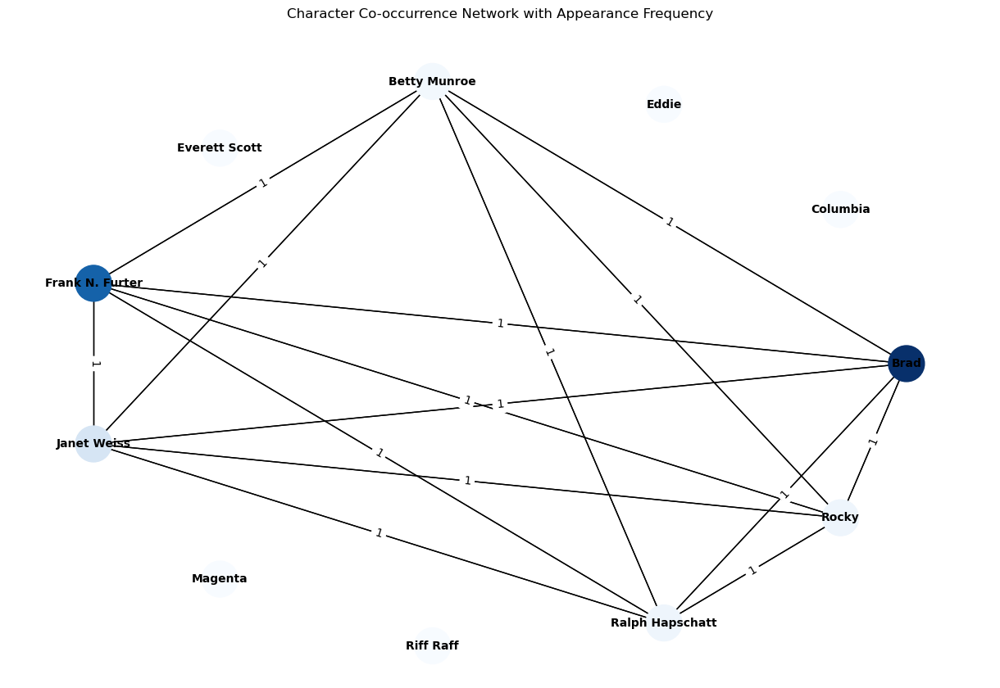


Degree Centrality:
Brad: 0.5000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.5000
Everett Scott: 0.0000
Frank N. Furter: 0.5000
Janet Weiss: 0.5000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.5000
Rocky: 0.5000
Network density: 0.2727272727272727


In [23]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/20841947_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [503]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 6
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Brad: 1.0000
Betty Munroe: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Ralph Hapschatt: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0000
Betty Munroe: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.0000


In [504]:
##21680740.txt

Brad: 0
Columbia: 2
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 21
Janet Weiss: 0
Magenta: 31
Riff Raff: 11
Ralph Hapschatt: 0
Rocky: 3


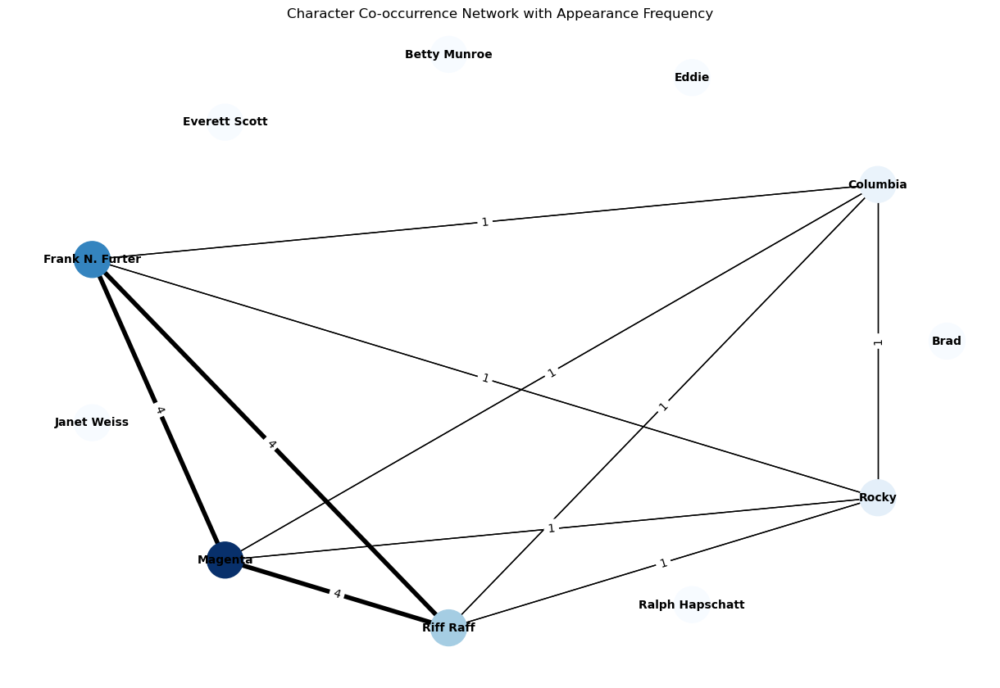


Degree Centrality:
Brad: 0.0000
Columbia: 0.4000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.4000
Janet Weiss: 0.0000
Magenta: 0.4000
Riff Raff: 0.4000
Ralph Hapschatt: 0.0000
Rocky: 0.4000
Network density: 0.18181818181818182


In [24]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/21680740.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [506]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 5
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Magenta: 1.0000
Columbia: 1.0000
Rocky: 1.0000
Riff Raff: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Magenta: 0.0000
Columbia: 0.0000
Rocky: 0.0000
Riff Raff: 0.0000


In [507]:
##22262287.txt

Brad: 1
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 5
Janet Weiss: 2
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 1


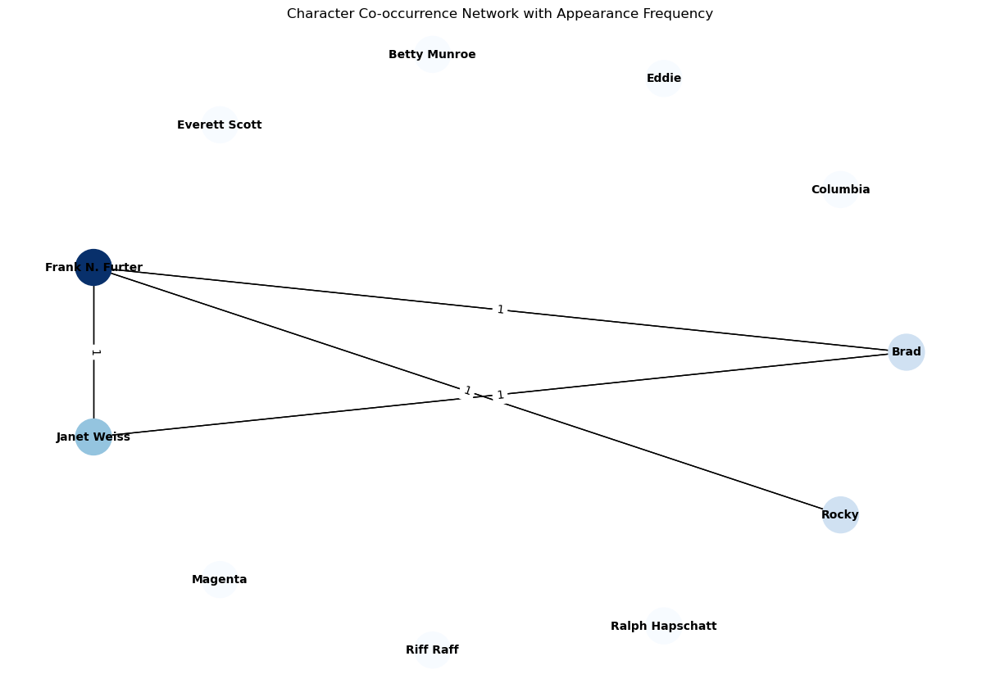


Degree Centrality:
Brad: 0.2000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.3000
Janet Weiss: 0.2000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.1000
Network density: 0.07272727272727272


In [25]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/22262287.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [509]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 4
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.6667

Closeness Centrality:
Frank N. Furter: 1.0000
Janet Weiss: 0.7500
Brad: 0.7500
Rocky: 0.6000

Betweenness Centrality:
Frank N. Furter: 0.6667
Janet Weiss: 0.0000
Brad: 0.0000
Rocky: 0.0000


In [510]:
##23080390.txt

Brad: 0
Columbia: 3
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 0
Janet Weiss: 0
Magenta: 4
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


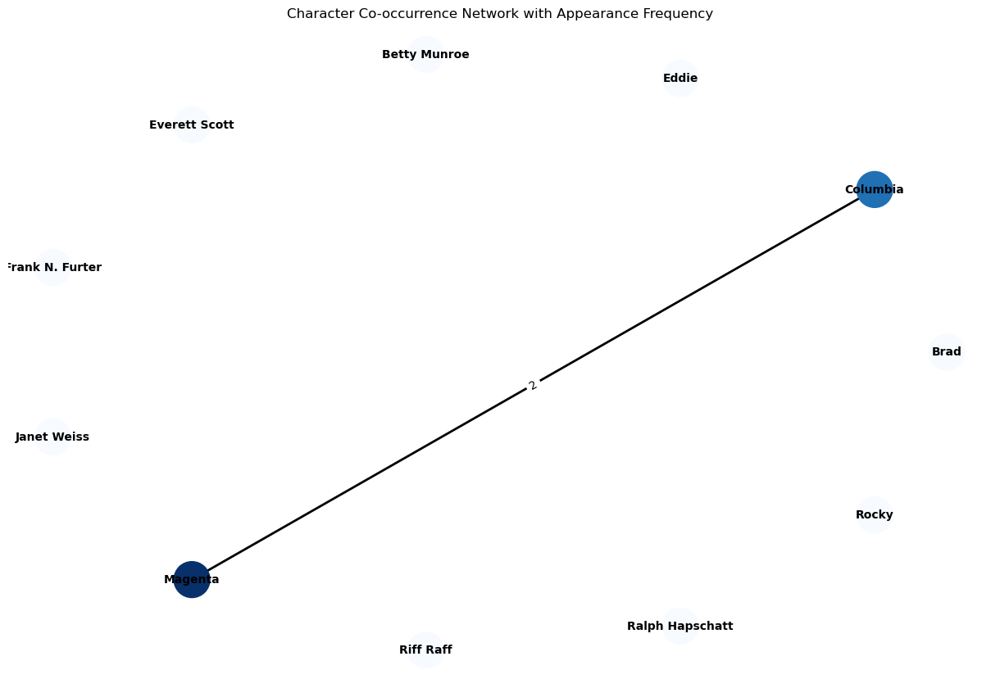


Degree Centrality:
Brad: 0.0000
Columbia: 0.1000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Magenta: 0.1000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.01818181818181818


In [26]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/23080390.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [512]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 2
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Magenta: 1.0000
Columbia: 1.0000

Betweenness Centrality:
Magenta: 0.0000
Columbia: 0.0000


In [513]:
##2484962.txt

Brad: 722
Columbia: 582
Eddie: 331
Betty Munroe: 45
Everett Scott: 56
Frank N. Furter: 3129
Janet Weiss: 984
Magenta: 1820
Riff Raff: 1564
Ralph Hapschatt: 26
Rocky: 155


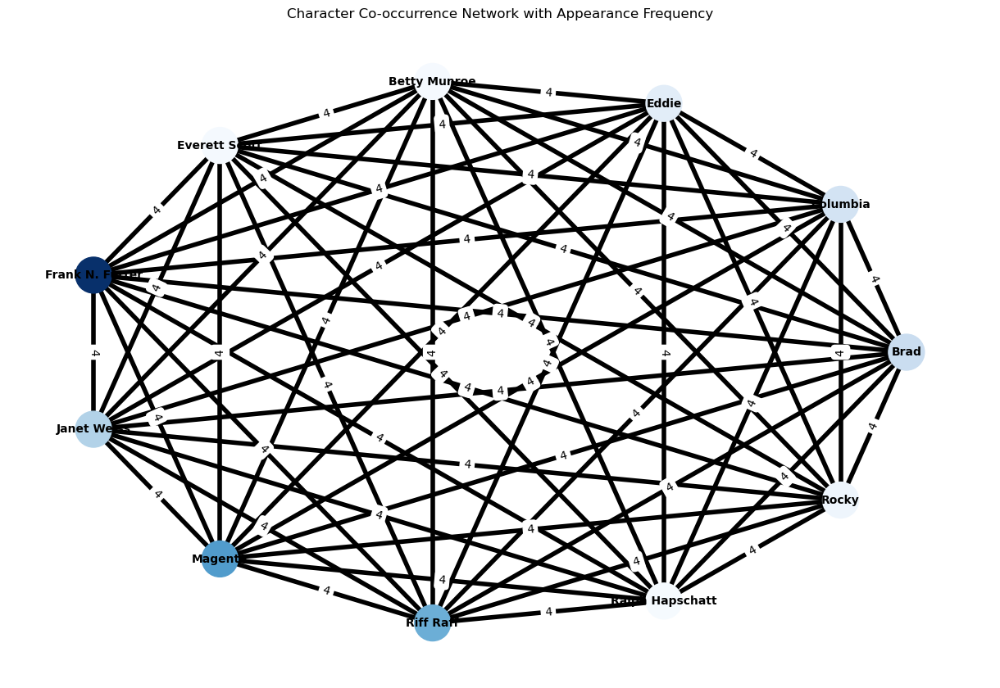


Degree Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Betty Munroe: 1.0000
Everett Scott: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Ralph Hapschatt: 1.0000
Rocky: 1.0000
Network density: 1.0


In [27]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/2484962.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [515]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 11
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Betty Munroe: 1.0000
Everett Scott: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Ralph Hapschatt: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.0000


In [516]:
##2662625.txt

Brad: 0
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 74
Janet Weiss: 0
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 4


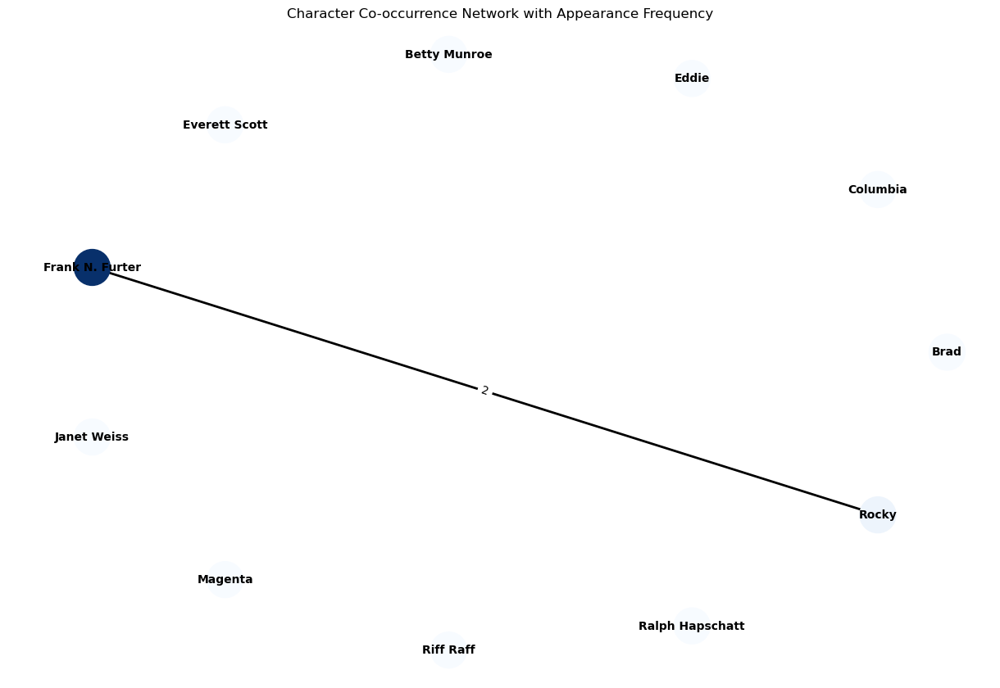


Degree Centrality:
Brad: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.1000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.1000
Network density: 0.01818181818181818


In [28]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/2662625.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [518]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 2
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Rocky: 0.0000


In [519]:
##27580583.txt

Brad: 21
Columbia: 0
Eddie: 0
Betty Munroe: 19
Everett Scott: 2
Frank N. Furter: 0
Janet Weiss: 22
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 9
Rocky: 0


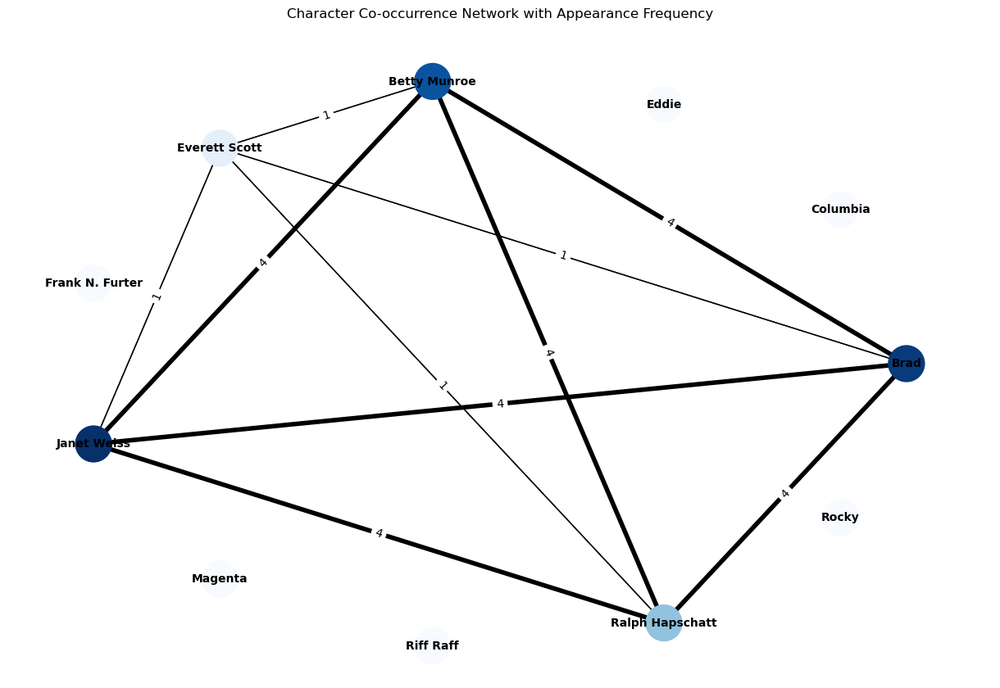


Degree Centrality:
Brad: 0.4000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.4000
Everett Scott: 0.4000
Frank N. Furter: 0.0000
Janet Weiss: 0.4000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.4000
Rocky: 0.0000
Network density: 0.18181818181818182


In [29]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/27580583.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [521]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 5
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Ralph Hapschatt: 1.0000
Janet Weiss: 1.0000
Betty Munroe: 1.0000
Brad: 1.0000
Everett Scott: 1.0000

Betweenness Centrality:
Ralph Hapschatt: 0.0000
Janet Weiss: 0.0000
Betty Munroe: 0.0000
Brad: 0.0000
Everett Scott: 0.0000


In [522]:
重新打印，把姓修改，增加新的名称 betty

SyntaxError: invalid character '，' (U+FF0C) (1812562679.py, line 1)

In [523]:
##27626326.txt


Brad: 1
Columbia: 14
Eddie: 2
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 12
Janet Weiss: 1
Magenta: 8
Riff Raff: 6
Ralph Hapschatt: 0
Rocky: 0


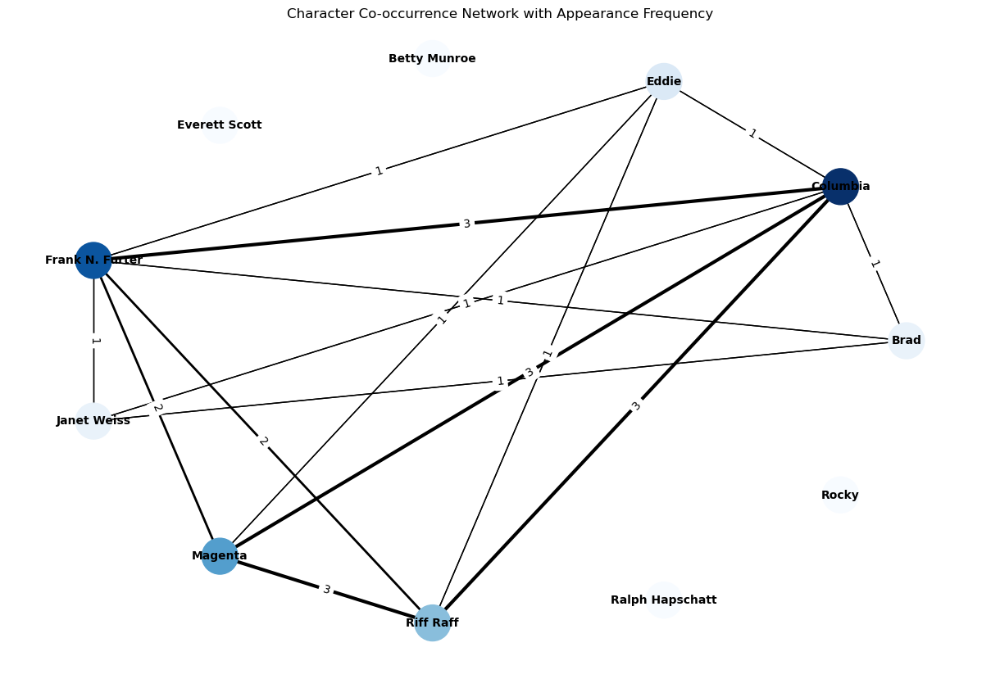


Degree Centrality:
Brad: 0.3000
Columbia: 0.6000
Eddie: 0.4000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.6000
Janet Weiss: 0.3000
Magenta: 0.4000
Riff Raff: 0.4000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.2727272727272727


In [30]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/27626326.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [525]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 7
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.7143

Closeness Centrality:
Brad: 0.6667
Columbia: 1.0000
Eddie: 0.7500
Frank N. Furter: 1.0000
Janet Weiss: 0.6667
Magenta: 0.7500
Riff Raff: 0.7500

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.2000
Eddie: 0.0000
Frank N. Furter: 0.2000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000


In [526]:
##27658573.txt

Brad: 95
Columbia: 1
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 69
Janet Weiss: 77
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 1


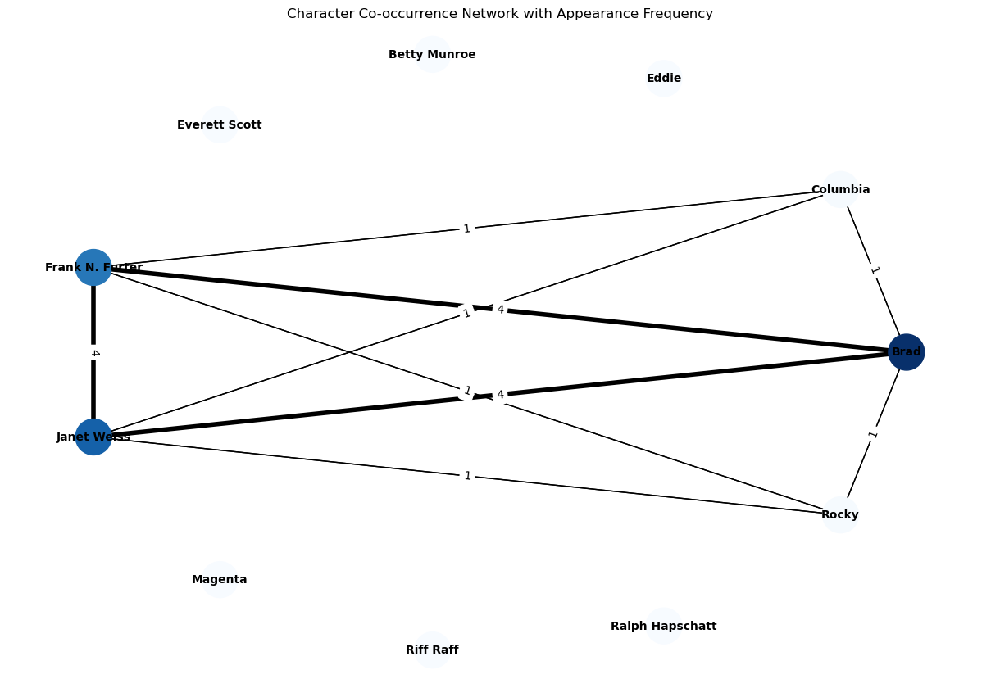


Degree Centrality:
Brad: 0.4000
Columbia: 0.3000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.4000
Janet Weiss: 0.4000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.3000
Network density: 0.16363636363636364


In [31]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/27658573.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [528]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 5
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.9000

Closeness Centrality:
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Columbia: 0.8000
Brad: 1.0000
Rocky: 0.8000

Betweenness Centrality:
Frank N. Furter: 0.0556
Janet Weiss: 0.0556
Columbia: 0.0000
Brad: 0.0556
Rocky: 0.0000


In [529]:
##28063239.txt

Brad: 16
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 1
Janet Weiss: 24
Magenta: 0
Riff Raff: 1
Ralph Hapschatt: 0
Rocky: 0


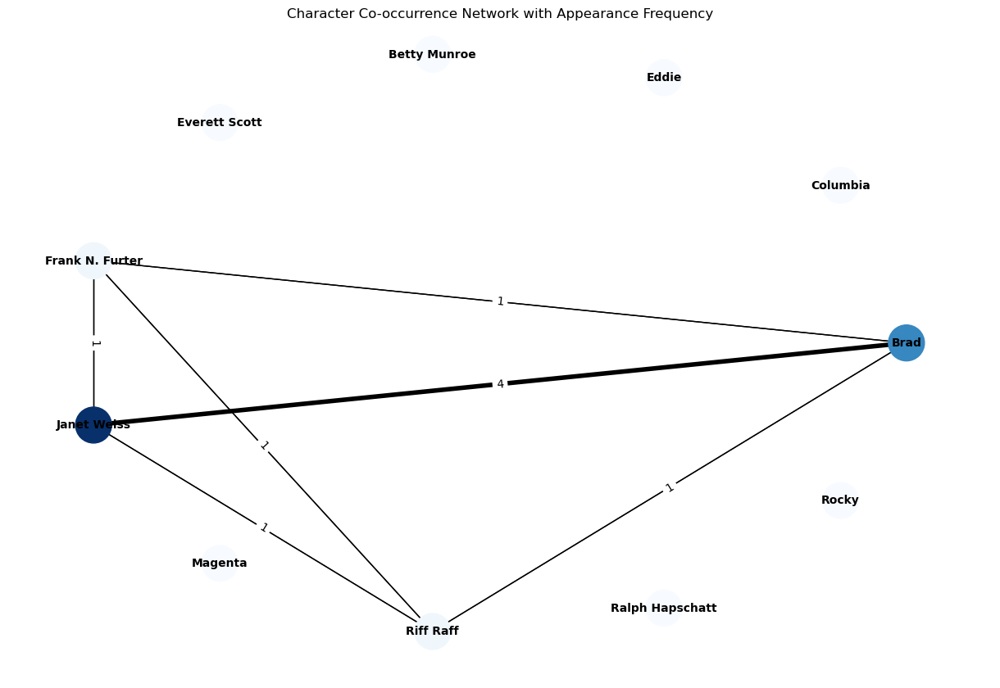


Degree Centrality:
Brad: 0.3000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.3000
Janet Weiss: 0.3000
Magenta: 0.0000
Riff Raff: 0.3000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.10909090909090909


In [32]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/28063239.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [531]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 4
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Riff Raff: 1.0000
Janet Weiss: 1.0000
Brad: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Riff Raff: 0.0000
Janet Weiss: 0.0000
Brad: 0.0000


In [532]:
##2808269.txt

Brad: 10
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 3
Janet Weiss: 2
Magenta: 0
Riff Raff: 1
Ralph Hapschatt: 0
Rocky: 1


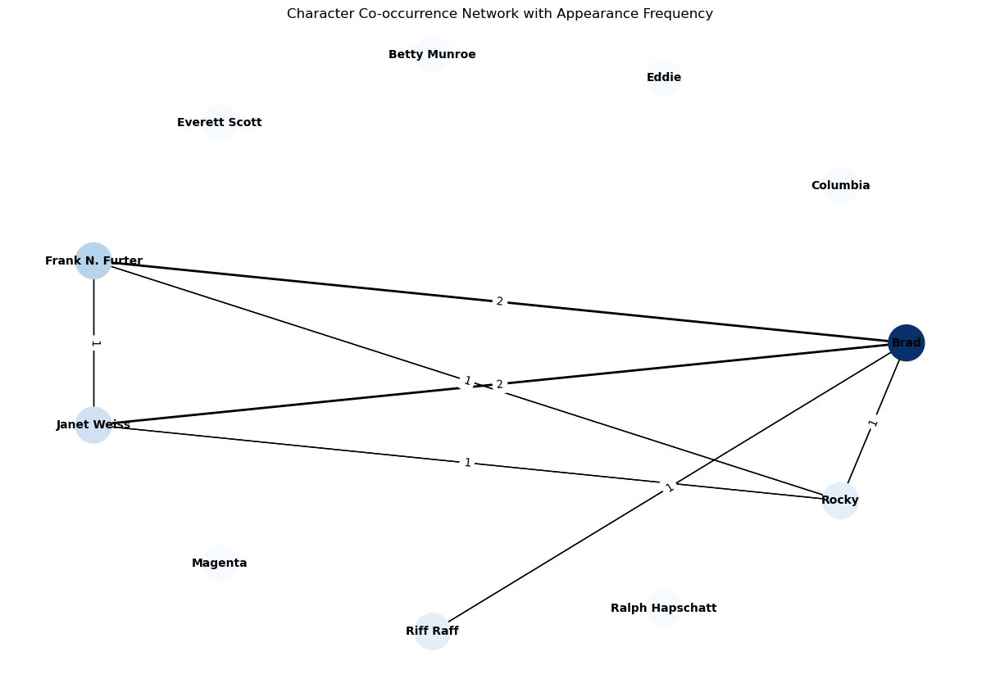


Degree Centrality:
Brad: 0.4000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.3000
Janet Weiss: 0.3000
Magenta: 0.0000
Riff Raff: 0.1000
Ralph Hapschatt: 0.0000
Rocky: 0.3000
Network density: 0.12727272727272726


In [33]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/2808269.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [534]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 5
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.7000

Closeness Centrality:
Frank N. Furter: 0.8000
Janet Weiss: 0.8000
Brad: 1.0000
Rocky: 0.8000
Riff Raff: 0.5714

Betweenness Centrality:
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Brad: 0.5000
Rocky: 0.0000
Riff Raff: 0.0000


In [535]:
##28809600.txt


Brad: 0
Columbia: 12
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 387
Janet Weiss: 0
Magenta: 64
Riff Raff: 43
Ralph Hapschatt: 0
Rocky: 0


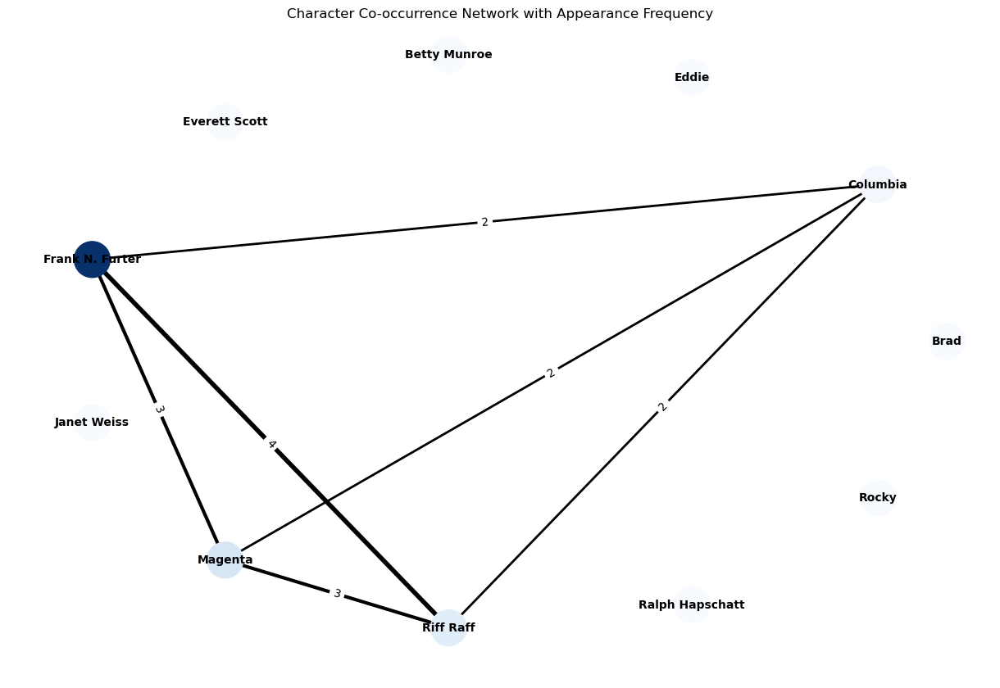


Degree Centrality:
Brad: 0.0000
Columbia: 0.3000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.3000
Janet Weiss: 0.0000
Magenta: 0.3000
Riff Raff: 0.3000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.10909090909090909


In [34]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/28809600.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [537]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 4
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Columbia: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Columbia: 0.0000


In [538]:
##28950279_txt.txt

Brad: 4
Columbia: 0
Eddie: 0
Betty Munroe: 3
Everett Scott: 0
Frank N. Furter: 2
Janet Weiss: 2
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


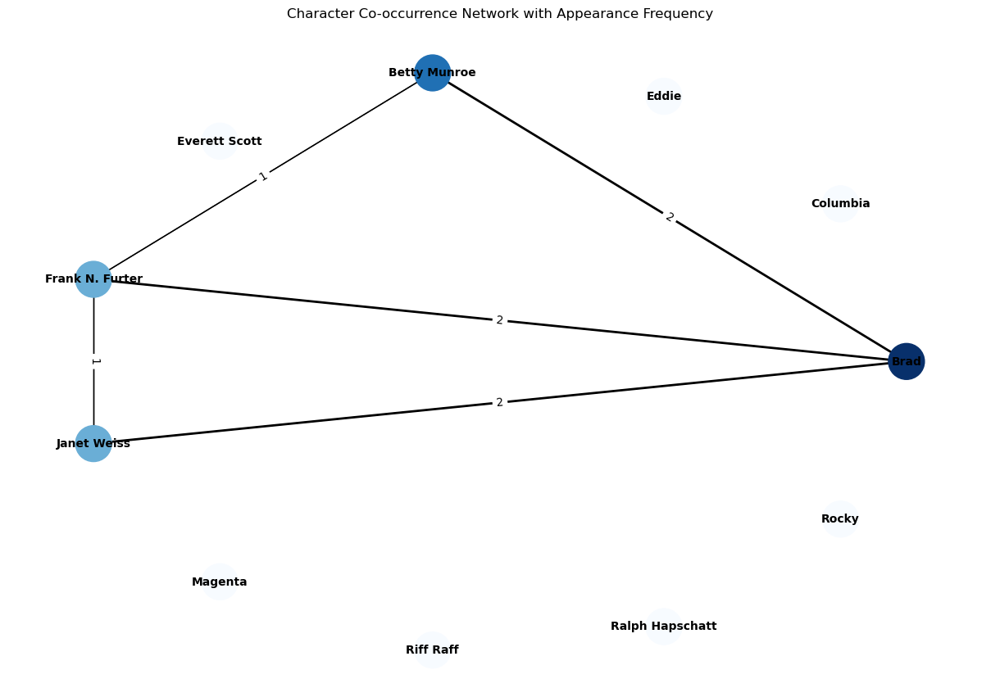


Degree Centrality:
Brad: 0.3000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.2000
Everett Scott: 0.0000
Frank N. Furter: 0.3000
Janet Weiss: 0.2000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.09090909090909091


In [35]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/28950279_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [540]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 4
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.8333

Closeness Centrality:
Frank N. Furter: 1.0000
Janet Weiss: 0.7500
Betty Munroe: 0.7500
Brad: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.1667
Janet Weiss: 0.0000
Betty Munroe: 0.0000
Brad: 0.1667


In [541]:
##29058837.txt

Brad: 5
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 5
Janet Weiss: 3
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


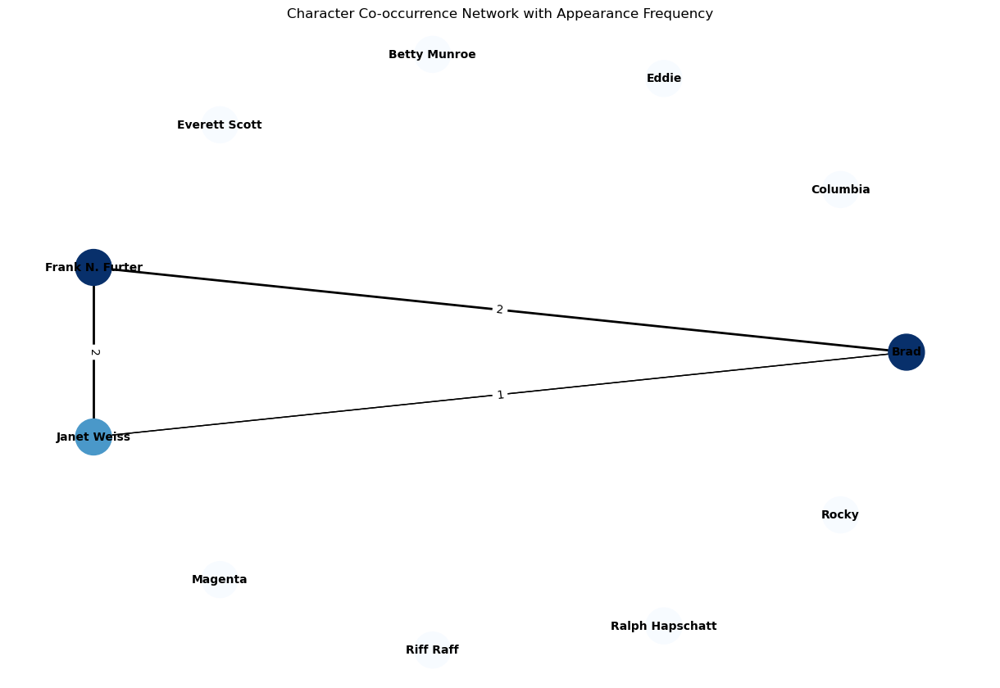


Degree Centrality:
Brad: 0.2000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.2000
Janet Weiss: 0.2000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.05454545454545454


In [36]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/29058837.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [543]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 3
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Brad: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Brad: 0.0000


In [544]:
##29608974.txt

Brad: 86
Columbia: 0
Eddie: 0
Betty Munroe: 13
Everett Scott: 0
Frank N. Furter: 2
Janet Weiss: 86
Magenta: 0
Riff Raff: 1
Ralph Hapschatt: 14
Rocky: 0


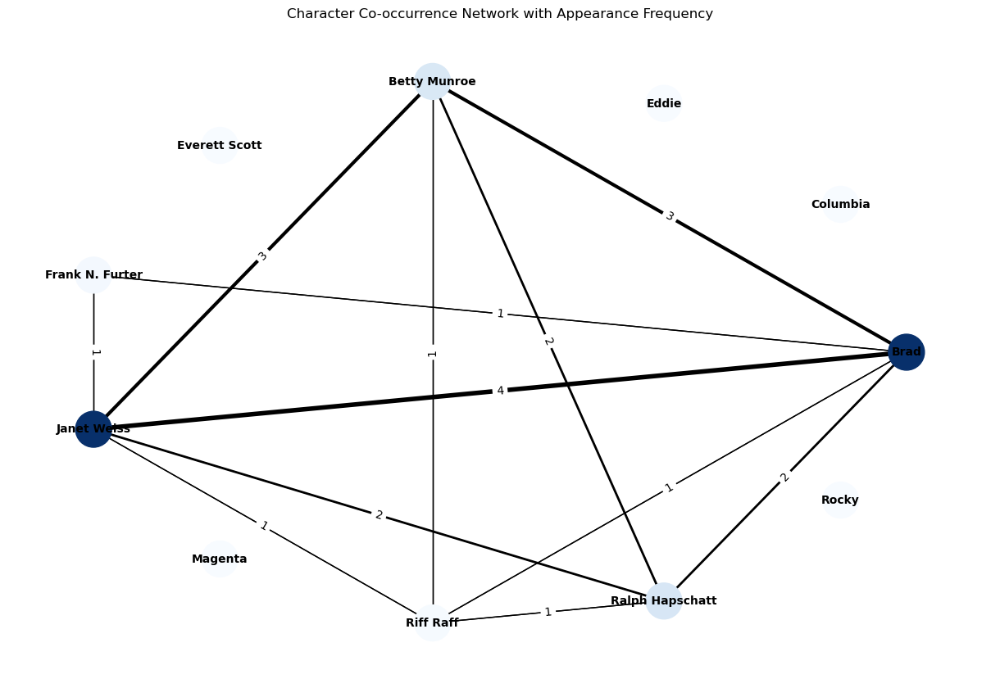


Degree Centrality:
Brad: 0.5000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.4000
Everett Scott: 0.0000
Frank N. Furter: 0.2000
Janet Weiss: 0.5000
Magenta: 0.0000
Riff Raff: 0.4000
Ralph Hapschatt: 0.4000
Rocky: 0.0000
Network density: 0.21818181818181817


In [37]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/29608974.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [546]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 6
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.8000

Closeness Centrality:
Brad: 1.0000
Betty Munroe: 0.8333
Frank N. Furter: 0.6250
Janet Weiss: 1.0000
Riff Raff: 0.8333
Ralph Hapschatt: 0.8333

Betweenness Centrality:
Brad: 0.1500
Betty Munroe: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.1500
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000


In [547]:
##32097430.txt

Brad: 5
Columbia: 0
Eddie: 1
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 1
Janet Weiss: 4
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 1


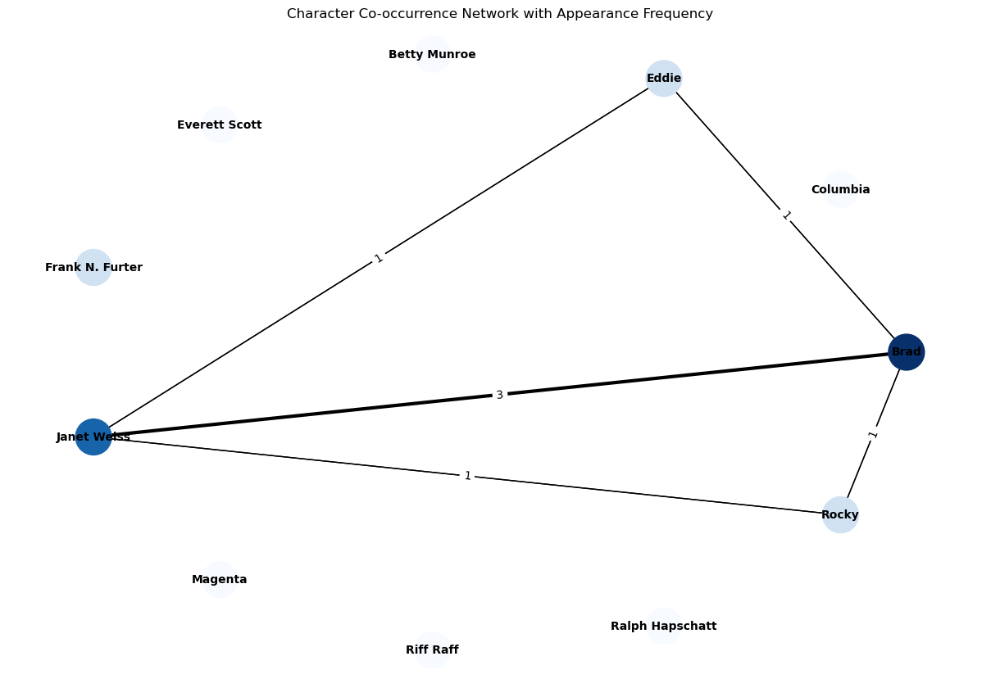


Degree Centrality:
Brad: 0.3000
Columbia: 0.0000
Eddie: 0.2000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.3000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.2000
Network density: 0.09090909090909091


In [38]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/32097430.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [549]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 4
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.8333

Closeness Centrality:
Eddie: 0.7500
Janet Weiss: 1.0000
Brad: 1.0000
Rocky: 0.7500

Betweenness Centrality:
Eddie: 0.0000
Janet Weiss: 0.1667
Brad: 0.1667
Rocky: 0.0000


In [ ]:
## 32886031.txt 网络异常，检查原文

Brad: 0
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 2
Janet Weiss: 0
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


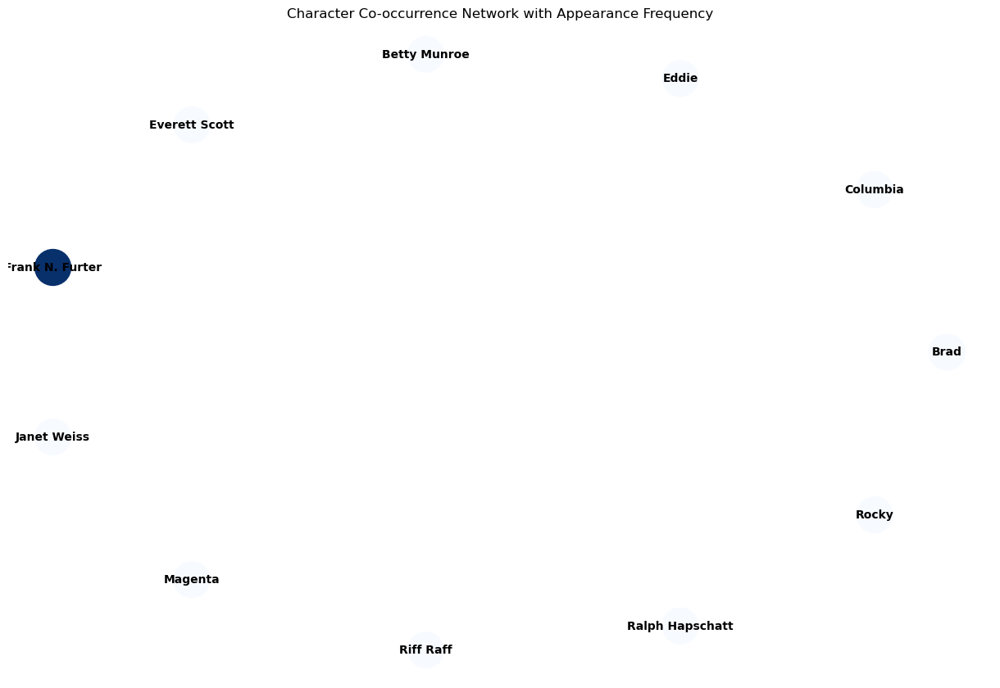

In [550]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/32886031.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


In [551]:
##根据上述结果，重新阅读文章，发现文章内有新人物。

Brad: 0
Columbia: 0
Eddie: 0
Everett: 0
Frank: 2
Janet: 0
Magenta: 0
Riff: 0
Rocky: 0
Ferron: 20
Erin: 29


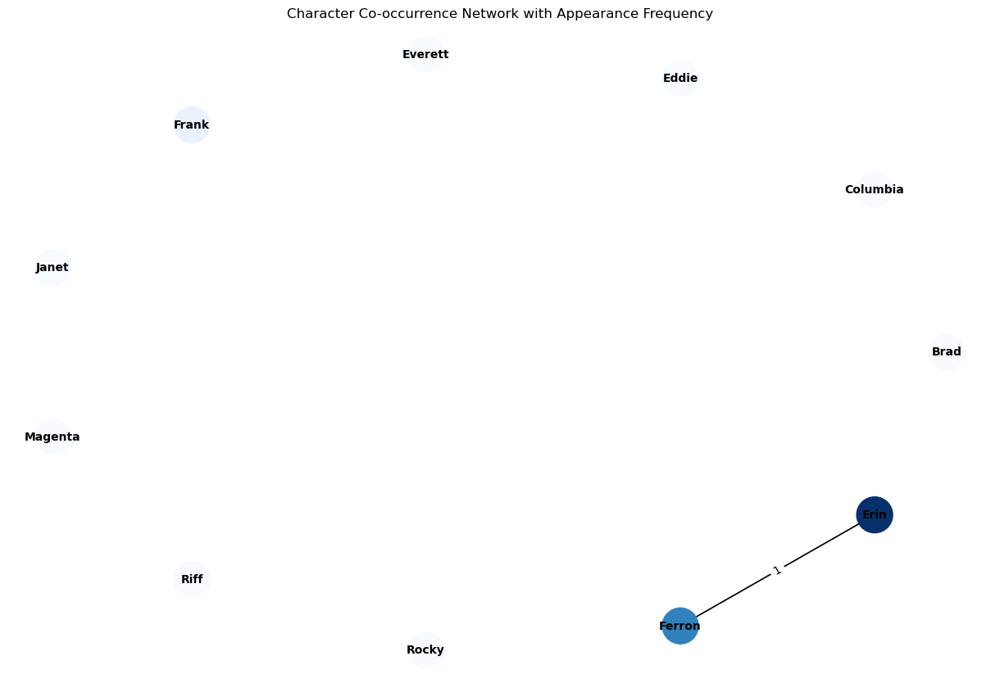

Network density: 0.01818181818181818


In [41]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re

#Read the contents of a text file
def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

# Count the number of times a character appears in a text
def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

# Counting role co-occurrences
def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    # Split text into multiple windows
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# Define role name and window size
names = ["Brad", "Columbia", "Eddie", "Everett", "Frank", 
         "Janet", "Magenta", "Riff", "Rocky","Ferron","Erin"]
filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/32886031.txt"
text = read_text(filename)

# Count the number of occurrences of each character in the text
character_occurrences = count_character_occurrences(text, names)

# Print character occurrence count
for name, count in character_occurrences.items():
    print(f"{name}: {count}")

# Counting co-occurrences
window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

# Create a network diagram
G = nx.Graph()

# Add nodes and set node colors based on the number of occurrences
max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  # using blue to represnt the dot

# add egde，set weight
for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

# Draw a network diagram using circular layout
pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

# Get node color and draw
node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

# Draw the edge and set the width of the edge as the weight of the edge
for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

# Get the edge weight and draw it
labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()

density = nx.density(G)
print("Network density:", density)

In [553]:
##34268329.txt

Brad: 0
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 13
Janet Weiss: 0
Magenta: 4
Riff Raff: 18
Ralph Hapschatt: 0
Rocky: 0


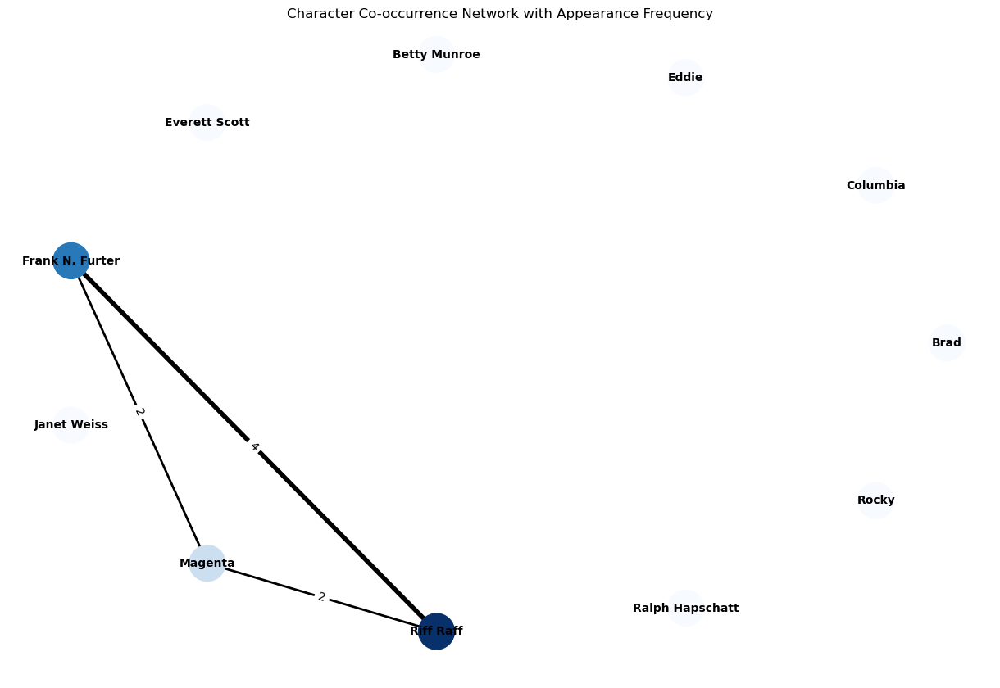


Degree Centrality:
Brad: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.2000
Janet Weiss: 0.0000
Magenta: 0.2000
Riff Raff: 0.2000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.05454545454545454


In [39]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/34268329.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [555]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 3
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000


In [556]:
##34411.txt

Brad: 2
Columbia: 6
Eddie: 1
Betty Munroe: 0
Everett Scott: 3
Frank N. Furter: 3
Janet Weiss: 2
Magenta: 16
Riff Raff: 21
Ralph Hapschatt: 0
Rocky: 1


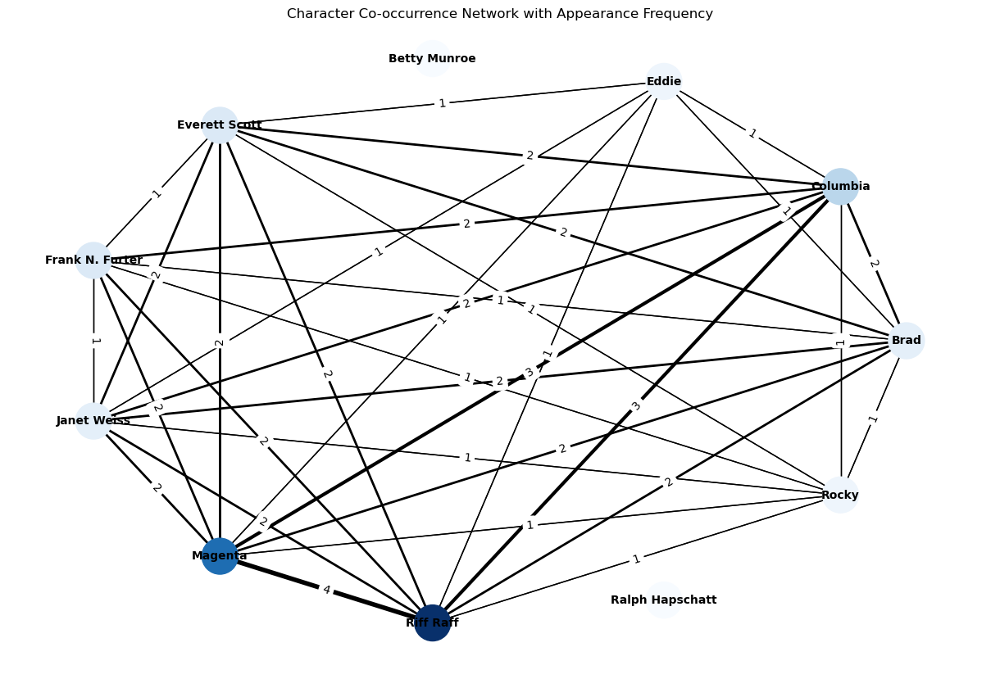


Degree Centrality:
Brad: 0.8000
Columbia: 0.8000
Eddie: 0.6000
Betty Munroe: 0.0000
Everett Scott: 0.8000
Frank N. Furter: 0.7000
Janet Weiss: 0.8000
Magenta: 0.8000
Riff Raff: 0.8000
Ralph Hapschatt: 0.0000
Rocky: 0.7000
Network density: 0.6181818181818182


In [40]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/34411.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [558]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 9
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.9444

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 0.8000
Everett Scott: 1.0000
Frank N. Furter: 0.8889
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 0.8889

Betweenness Centrality:
Brad: 0.0119
Columbia: 0.0119
Eddie: 0.0000
Everett Scott: 0.0119
Frank N. Furter: 0.0000
Janet Weiss: 0.0119
Magenta: 0.0119
Riff Raff: 0.0119
Rocky: 0.0000


In [559]:
##34495012_txt.txt

Brad: 78
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 3
Frank N. Furter: 66
Janet Weiss: 82
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 5


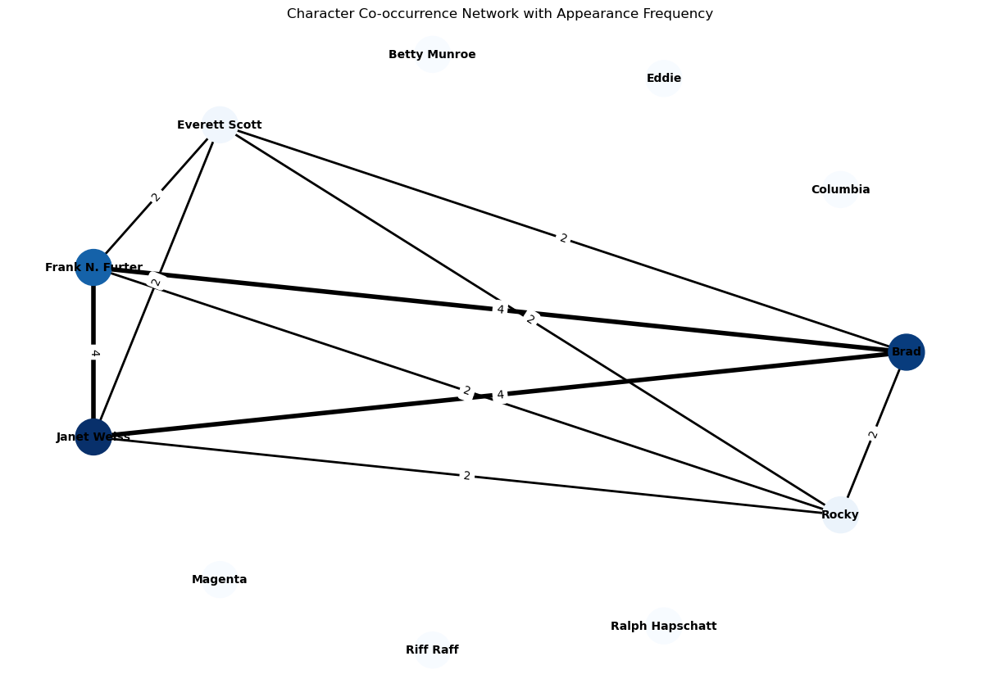


Degree Centrality:
Brad: 0.4000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.4000
Frank N. Furter: 0.4000
Janet Weiss: 0.4000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.4000
Network density: 0.18181818181818182


In [41]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/34495012_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [561]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 5
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Brad: 1.0000
Rocky: 1.0000
Everett Scott: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Brad: 0.0000
Rocky: 0.0000
Everett Scott: 0.0000


In [562]:
##34583485.txt


Brad: 0
Columbia: 9
Eddie: 10
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 6
Janet Weiss: 0
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


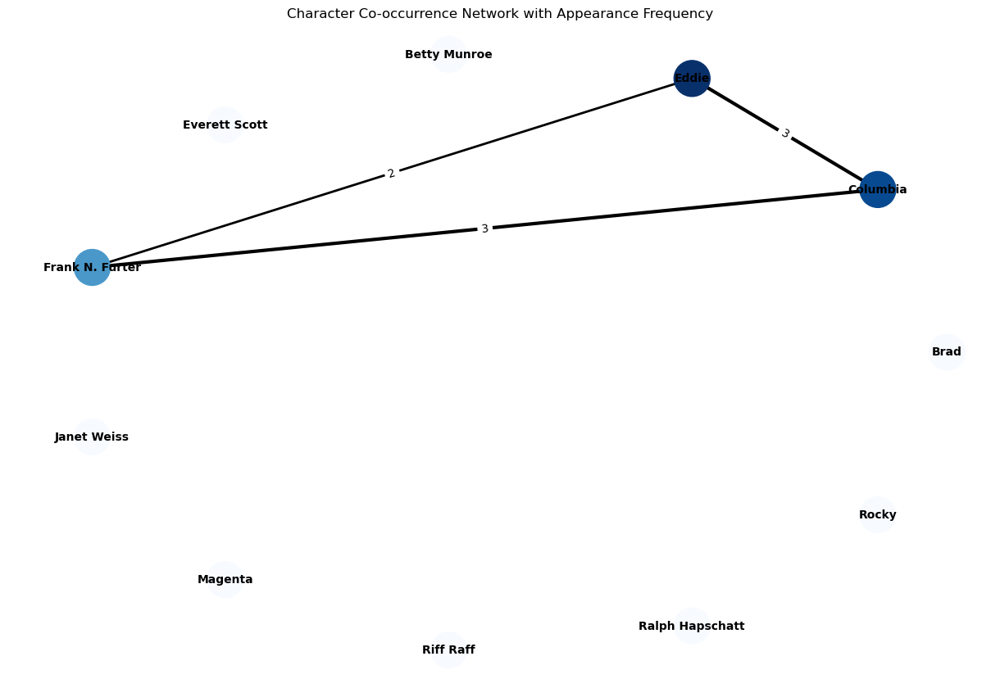


Degree Centrality:
Brad: 0.0000
Columbia: 0.2000
Eddie: 0.2000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.2000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.05454545454545454


In [42]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/34583485.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [564]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 3
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Eddie: 1.0000
Columbia: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Eddie: 0.0000
Columbia: 0.0000


In [565]:
##35073142.txt

Brad: 451
Columbia: 234
Eddie: 43
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 708
Janet Weiss: 263
Magenta: 206
Riff Raff: 265
Ralph Hapschatt: 0
Rocky: 134


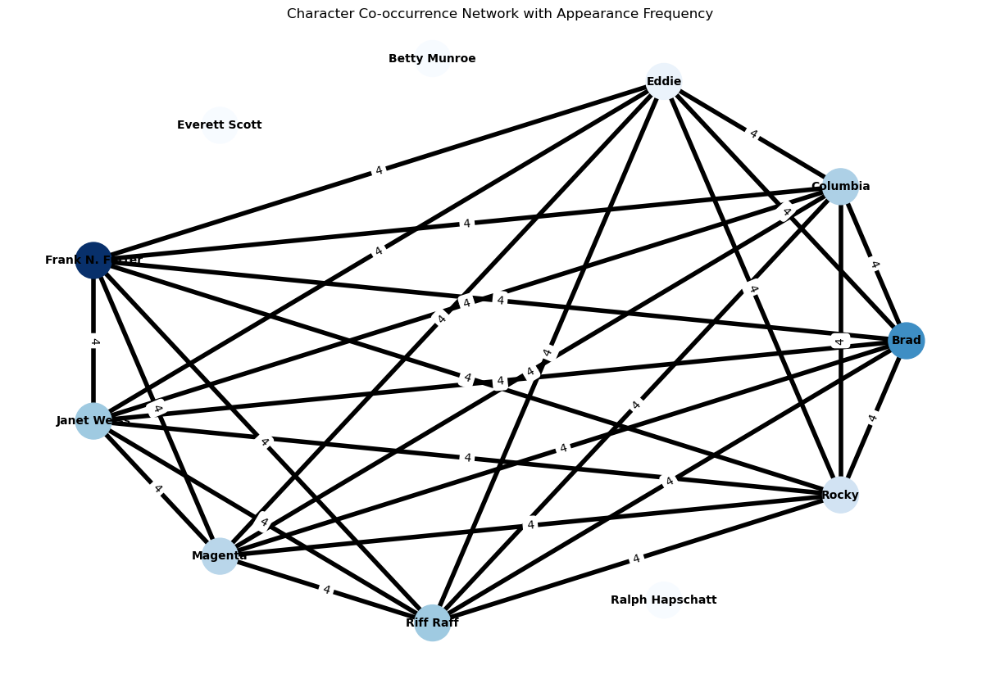


Degree Centrality:
Brad: 0.7000
Columbia: 0.7000
Eddie: 0.7000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.7000
Janet Weiss: 0.7000
Magenta: 0.7000
Riff Raff: 0.7000
Ralph Hapschatt: 0.0000
Rocky: 0.7000
Network density: 0.509090909090909


In [43]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/35073142.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [567]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 8
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Rocky: 0.0000


In [568]:
##35224531.txt

Brad: 56
Columbia: 4
Eddie: 1
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 34
Janet Weiss: 10
Magenta: 4
Riff Raff: 1
Ralph Hapschatt: 0
Rocky: 1


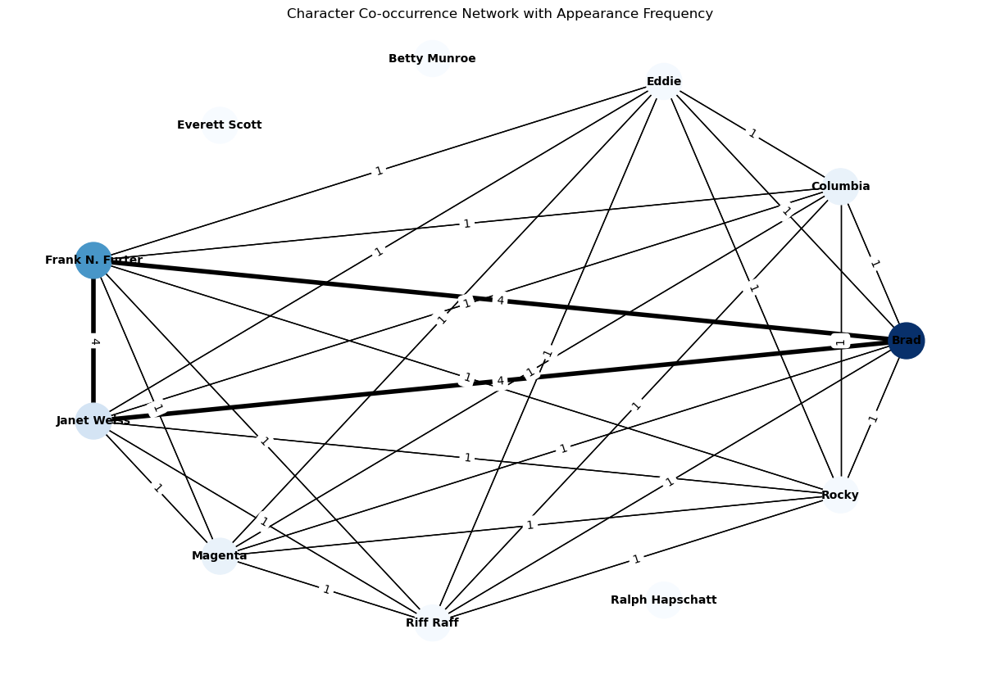


Degree Centrality:
Brad: 0.7000
Columbia: 0.7000
Eddie: 0.7000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.7000
Janet Weiss: 0.7000
Magenta: 0.7000
Riff Raff: 0.7000
Ralph Hapschatt: 0.0000
Rocky: 0.7000
Network density: 0.509090909090909


In [44]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/35224531.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [570]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 8
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Rocky: 0.0000


In [ ]:
## 35286316.txt 网络异常，回去检查原文

Brad: 0
Columbia: 0
Eddie: 0
Everett: 0
Frank: 0
Janet: 0
Magenta: 0
Riff: 0
Rocky: 0
Henry: 16
Edward: 11
Frank N. Furter: 0


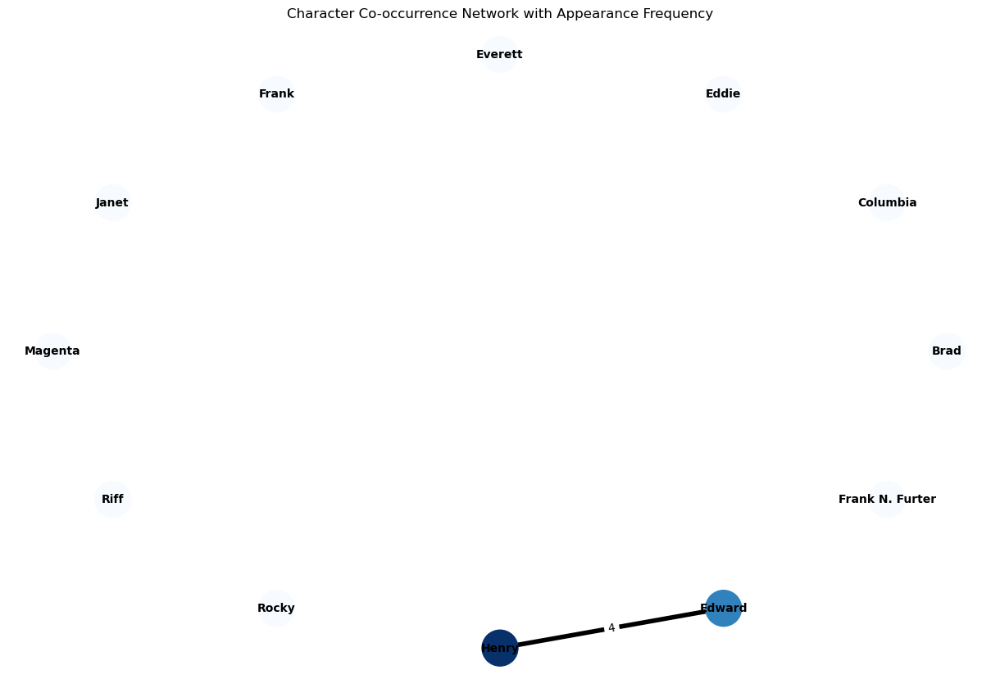

Network density: 0.015151515151515152


In [48]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re

#Read the contents of a text file
def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

# Count the number of times a character appears in a text
def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

# Counting role co-occurrences
def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    # Split text into multiple windows
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# Define role name and window size
names = ["Brad", "Columbia", "Eddie", "Everett", "Frank", 
         "Janet", "Magenta", "Riff", "Rocky","Henry",
            "Edward",
            "Frank N. Furter"]
filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/35286316.txt"
text = read_text(filename)

# Count the number of occurrences of each character in the text
character_occurrences = count_character_occurrences(text, names)

# Print character occurrence count
for name, count in character_occurrences.items():
    print(f"{name}: {count}")

# Counting co-occurrences
window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

# Create a network diagram
G = nx.Graph()

# Add nodes and set node colors based on the number of occurrences
max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  # using blue to represnt the dot

# add egde，set weight
for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

# Draw a network diagram using circular layout
pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

# Get node color and draw
node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

# Draw the edge and set the width of the edge as the weight of the edge
for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

# Get the edge weight and draw it
labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()

density = nx.density(G)
print("Network density:", density)


## 36512008.txt 该文章只有五句话

In [573]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/36512008.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


Brad: 0
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 0
Janet Weiss: 0
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


ZeroDivisionError: division by zero

In [574]:
##36673720.txt

Brad: 24
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 2
Frank N. Furter: 72
Janet Weiss: 74
Magenta: 1
Riff Raff: 4
Ralph Hapschatt: 0
Rocky: 2


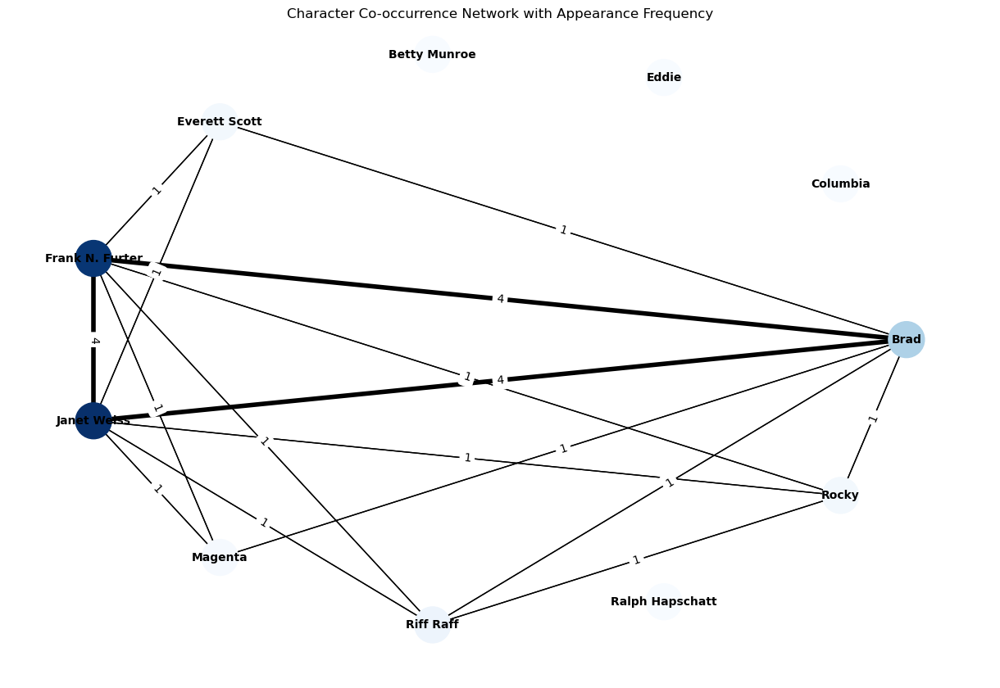


Degree Centrality:
Brad: 0.6000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.3000
Frank N. Furter: 0.6000
Janet Weiss: 0.6000
Magenta: 0.3000
Riff Raff: 0.4000
Ralph Hapschatt: 0.0000
Rocky: 0.4000
Network density: 0.2909090909090909


In [45]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/36673720.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [576]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 7
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.7619

Closeness Centrality:
Brad: 1.0000
Everett Scott: 0.6667
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 0.6667
Riff Raff: 0.7500
Rocky: 0.7500

Betweenness Centrality:
Brad: 0.1111
Everett Scott: 0.0000
Frank N. Furter: 0.1111
Janet Weiss: 0.1111
Magenta: 0.0000
Riff Raff: 0.0000
Rocky: 0.0000


In [577]:
##37093471.txt

Brad: 33
Columbia: 21
Eddie: 1
Betty Munroe: 0
Everett Scott: 11
Frank N. Furter: 137
Janet Weiss: 12
Magenta: 59
Riff Raff: 111
Ralph Hapschatt: 0
Rocky: 23


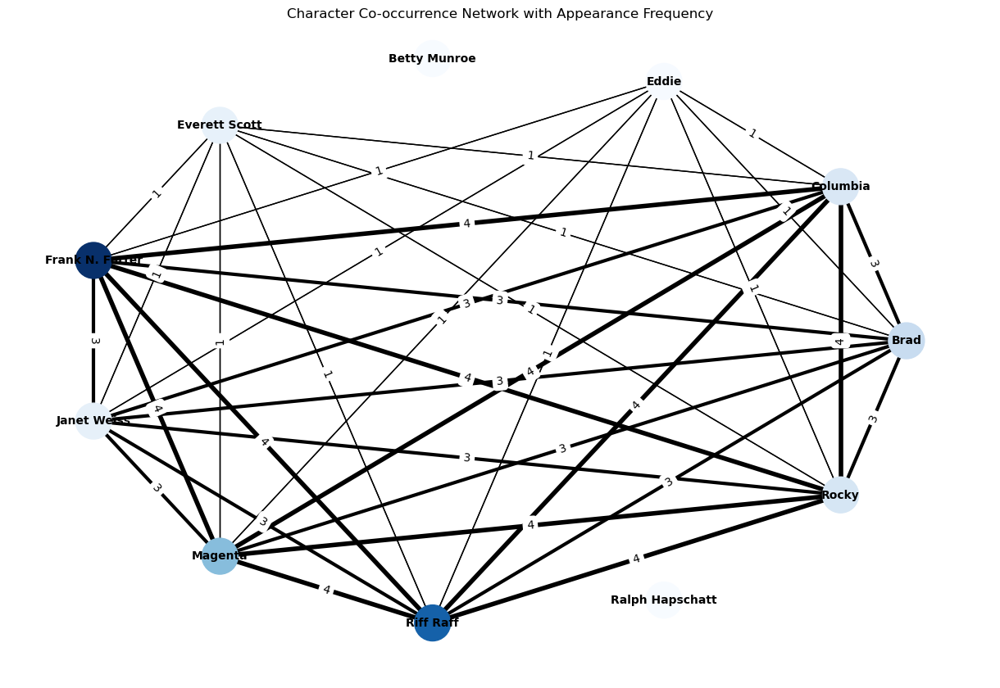


Degree Centrality:
Brad: 0.8000
Columbia: 0.8000
Eddie: 0.7000
Betty Munroe: 0.0000
Everett Scott: 0.7000
Frank N. Furter: 0.8000
Janet Weiss: 0.8000
Magenta: 0.8000
Riff Raff: 0.8000
Ralph Hapschatt: 0.0000
Rocky: 0.8000
Network density: 0.6363636363636364


In [46]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/37093471.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [579]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 9
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.9722

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 0.8889
Everett Scott: 0.8889
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0051
Columbia: 0.0051
Eddie: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0051
Janet Weiss: 0.0051
Magenta: 0.0051
Riff Raff: 0.0051
Rocky: 0.0051


In [580]:
##37372630.txt

Brad: 144
Columbia: 3
Eddie: 5
Betty Munroe: 0
Everett Scott: 3
Frank N. Furter: 126
Janet Weiss: 64
Magenta: 12
Riff Raff: 21
Ralph Hapschatt: 0
Rocky: 12


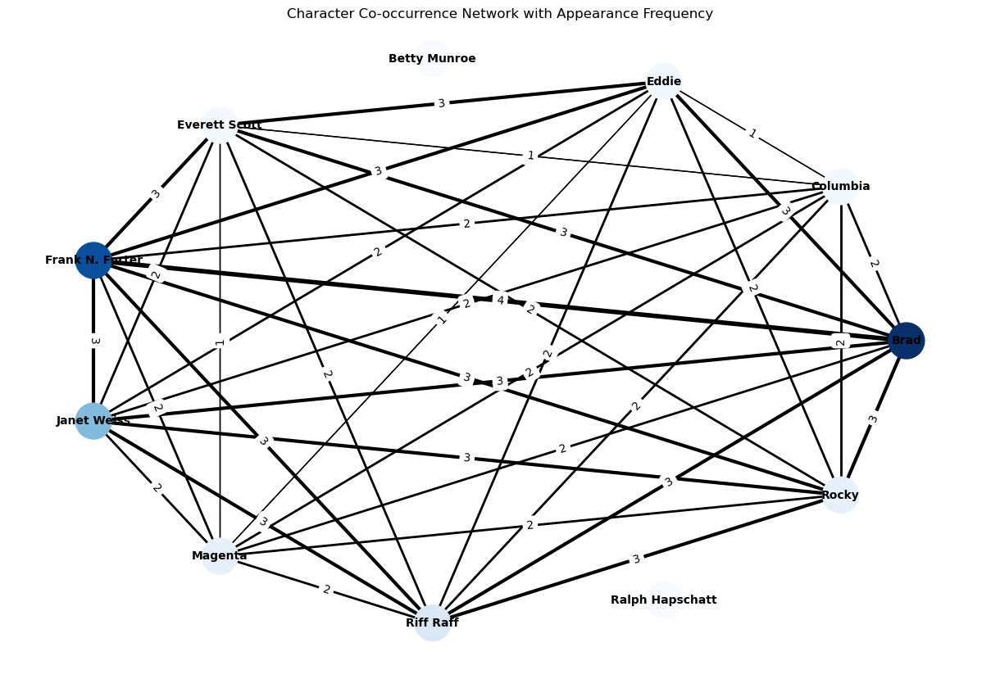


Degree Centrality:
Brad: 0.8000
Columbia: 0.8000
Eddie: 0.8000
Betty Munroe: 0.0000
Everett Scott: 0.8000
Frank N. Furter: 0.8000
Janet Weiss: 0.8000
Magenta: 0.8000
Riff Raff: 0.8000
Ralph Hapschatt: 0.0000
Rocky: 0.8000
Network density: 0.6545454545454545


In [47]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/37372630.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [582]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 9
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Everett Scott: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Rocky: 0.0000


In [583]:
##37613392.txt

Brad: 4
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 4
Janet Weiss: 3
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 2


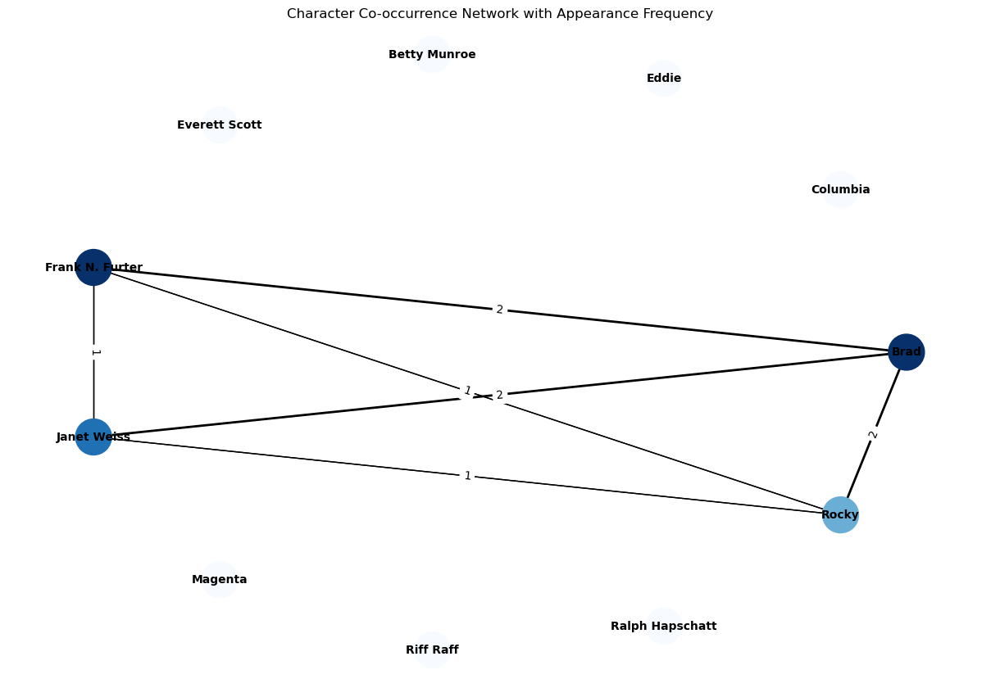


Degree Centrality:
Brad: 0.3000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.3000
Janet Weiss: 0.3000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.3000
Network density: 0.10909090909090909


In [48]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/37613392.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [585]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 4
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Brad: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Brad: 0.0000
Rocky: 0.0000


In [586]:
##37645705_txt.txt

Brad: 0
Columbia: 12
Eddie: 3
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 3
Janet Weiss: 0
Magenta: 9
Riff Raff: 18
Ralph Hapschatt: 0
Rocky: 0


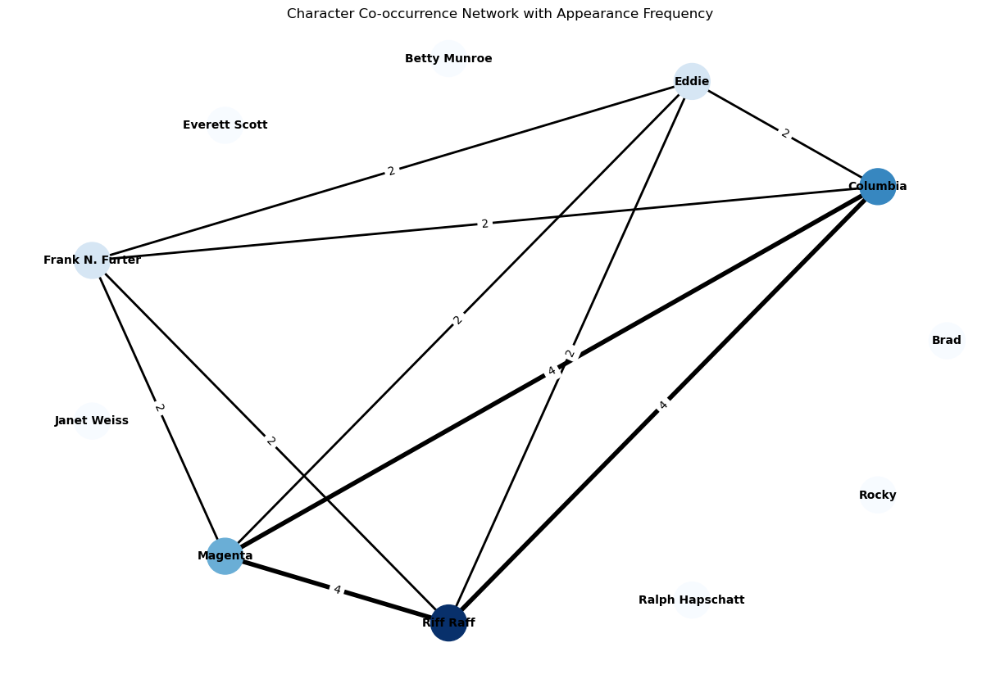


Degree Centrality:
Brad: 0.0000
Columbia: 0.4000
Eddie: 0.4000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.4000
Janet Weiss: 0.0000
Magenta: 0.4000
Riff Raff: 0.4000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.18181818181818182


In [49]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/37645705_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [588]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 5
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Magenta: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Riff Raff: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Magenta: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Riff Raff: 0.0000


In [589]:
##37650010.txt

Brad: 43
Columbia: 80
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 49
Janet Weiss: 15
Magenta: 45
Riff Raff: 2
Ralph Hapschatt: 0
Rocky: 13


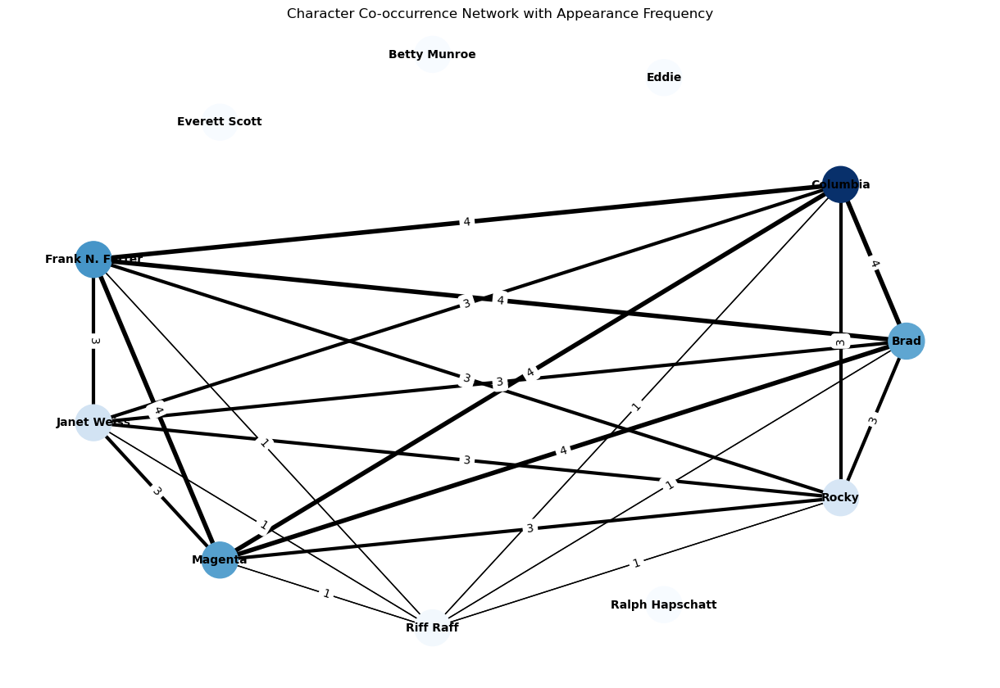


Degree Centrality:
Brad: 0.6000
Columbia: 0.6000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.6000
Janet Weiss: 0.6000
Magenta: 0.6000
Riff Raff: 0.6000
Ralph Hapschatt: 0.0000
Rocky: 0.6000
Network density: 0.38181818181818183


In [50]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/37650010.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [591]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 7
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Rocky: 0.0000


In [592]:
##38107357.txt

Brad: 5
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 50
Janet Weiss: 45
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


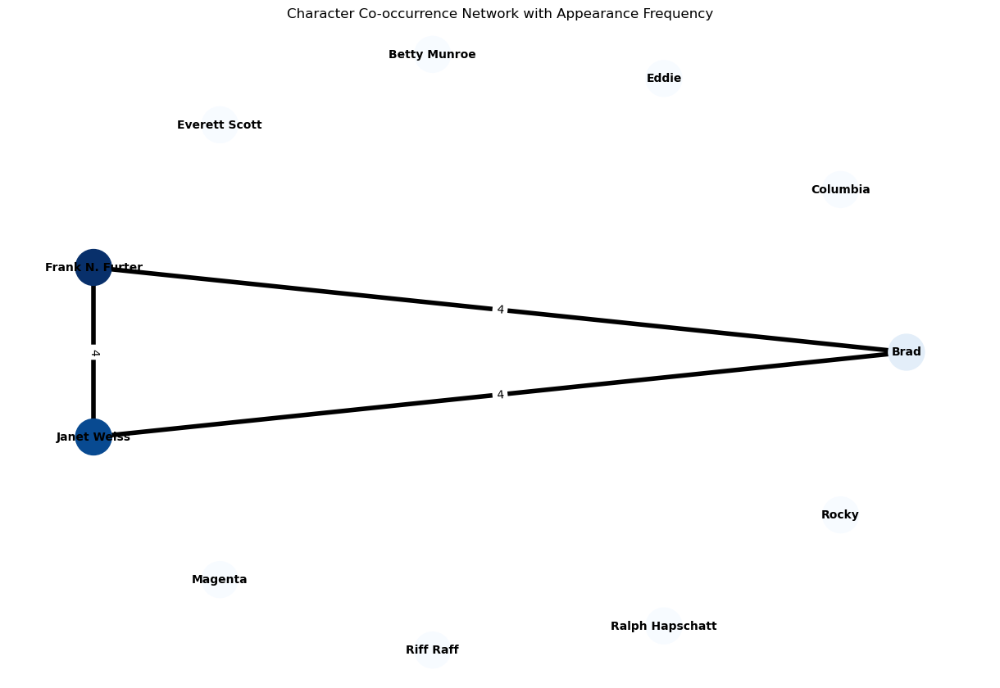


Degree Centrality:
Brad: 0.2000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.2000
Janet Weiss: 0.2000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.05454545454545454


In [51]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/38107357.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [594]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 3
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Brad: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Brad: 0.0000


In [595]:
##38280799.txt

Brad: 3
Columbia: 1
Eddie: 0
Betty Munroe: 0
Everett Scott: 2
Frank N. Furter: 29
Janet Weiss: 30
Magenta: 1
Riff Raff: 1
Ralph Hapschatt: 0
Rocky: 2


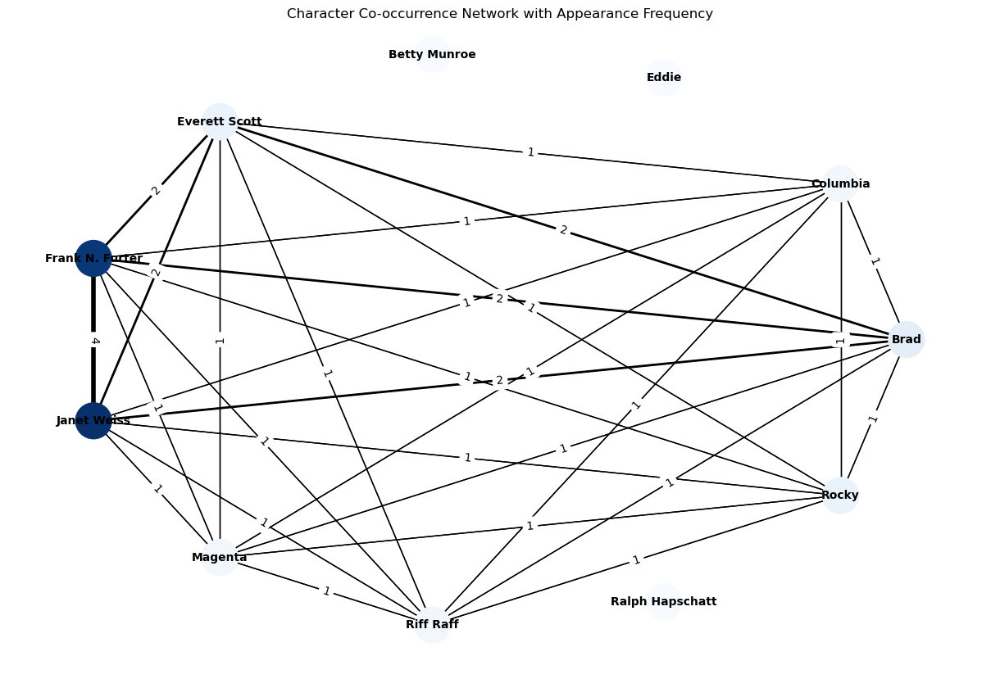


Degree Centrality:
Brad: 0.7000
Columbia: 0.7000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.7000
Frank N. Furter: 0.7000
Janet Weiss: 0.7000
Magenta: 0.7000
Riff Raff: 0.7000
Ralph Hapschatt: 0.0000
Rocky: 0.7000
Network density: 0.509090909090909


In [52]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/38280799.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [597]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 8
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Everett Scott: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Rocky: 0.0000


In [598]:
##38978856.txt

Brad: 151
Columbia: 107
Eddie: 17
Betty Munroe: 1
Everett Scott: 23
Frank N. Furter: 159
Janet Weiss: 141
Magenta: 87
Riff Raff: 26
Ralph Hapschatt: 0
Rocky: 21


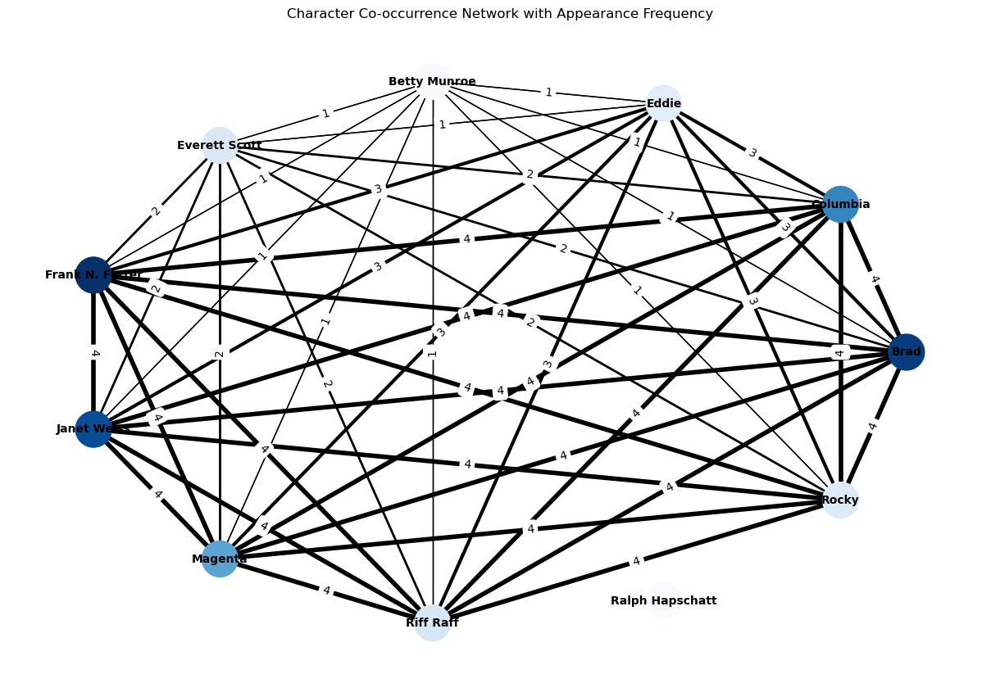


Degree Centrality:
Brad: 0.9000
Columbia: 0.9000
Eddie: 0.9000
Betty Munroe: 0.9000
Everett Scott: 0.9000
Frank N. Furter: 0.9000
Janet Weiss: 0.9000
Magenta: 0.9000
Riff Raff: 0.9000
Ralph Hapschatt: 0.0000
Rocky: 0.9000
Network density: 0.8181818181818182


In [53]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/38978856.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [600]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 10
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Betty Munroe: 1.0000
Everett Scott: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Rocky: 0.0000


In [601]:
##39126051.txt

Brad: 0
Columbia: 6
Eddie: 2
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 3
Janet Weiss: 0
Magenta: 6
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


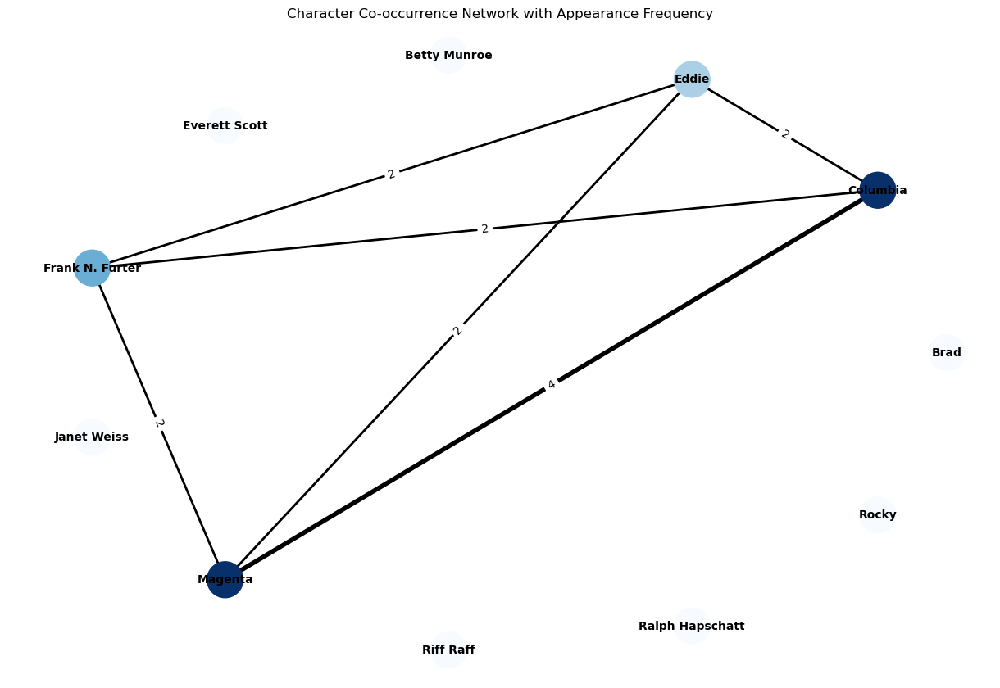


Degree Centrality:
Brad: 0.0000
Columbia: 0.3000
Eddie: 0.3000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.3000
Janet Weiss: 0.0000
Magenta: 0.3000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.10909090909090909


In [54]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/39126051.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [603]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 4
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Eddie: 1.0000
Magenta: 1.0000
Columbia: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Eddie: 0.0000
Magenta: 0.0000
Columbia: 0.0000


In [604]:
##39273348.txt

Brad: 16
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 67
Janet Weiss: 75
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 2


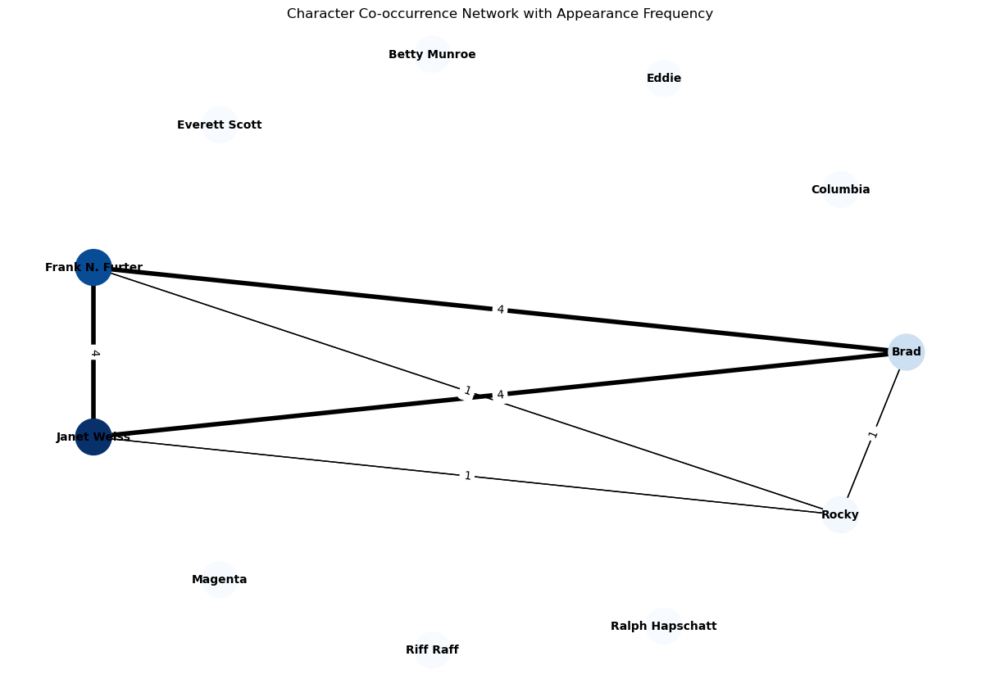


Degree Centrality:
Brad: 0.3000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.3000
Janet Weiss: 0.3000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.3000
Network density: 0.10909090909090909


In [55]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/39273348.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [606]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 4
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Brad: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Brad: 0.0000
Rocky: 0.0000


In [607]:
##39702837.txt

Brad: 0
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 23
Janet Weiss: 35
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


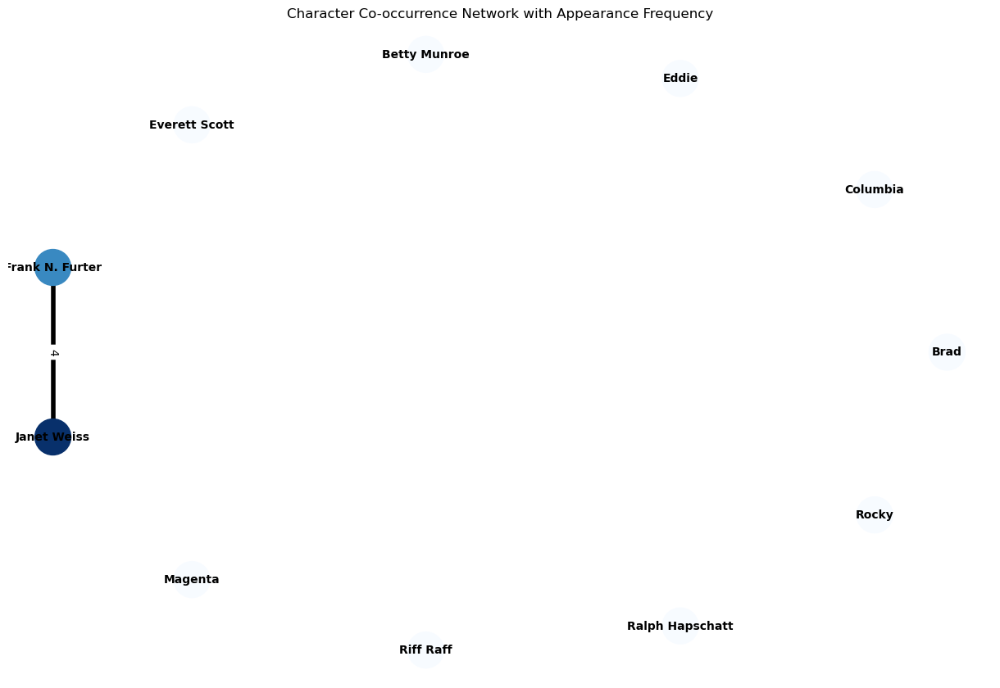


Degree Centrality:
Brad: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.1000
Janet Weiss: 0.1000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.01818181818181818


In [56]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/39702837.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [609]:
##39811401.txt

Brad: 6
Columbia: 9
Eddie: 2
Betty Munroe: 0
Everett Scott: 1
Frank N. Furter: 16
Janet Weiss: 7
Magenta: 9
Riff Raff: 4
Ralph Hapschatt: 0
Rocky: 8


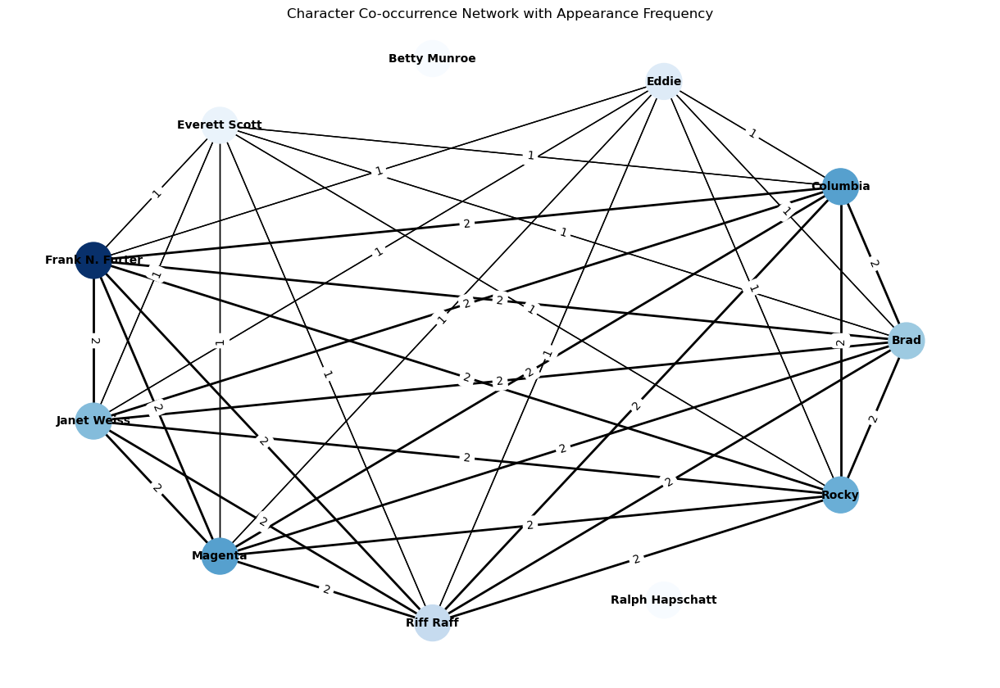


Degree Centrality:
Brad: 0.8000
Columbia: 0.8000
Eddie: 0.7000
Betty Munroe: 0.0000
Everett Scott: 0.7000
Frank N. Furter: 0.8000
Janet Weiss: 0.8000
Magenta: 0.8000
Riff Raff: 0.8000
Ralph Hapschatt: 0.0000
Rocky: 0.8000
Network density: 0.6363636363636364


In [57]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/39811401.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [611]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 9
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.9722

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 0.8889
Everett Scott: 0.8889
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0051
Columbia: 0.0051
Eddie: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0051
Janet Weiss: 0.0051
Magenta: 0.0051
Riff Raff: 0.0051
Rocky: 0.0051


In [612]:
##40258689.txt

Brad: 0
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 14
Janet Weiss: 22
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


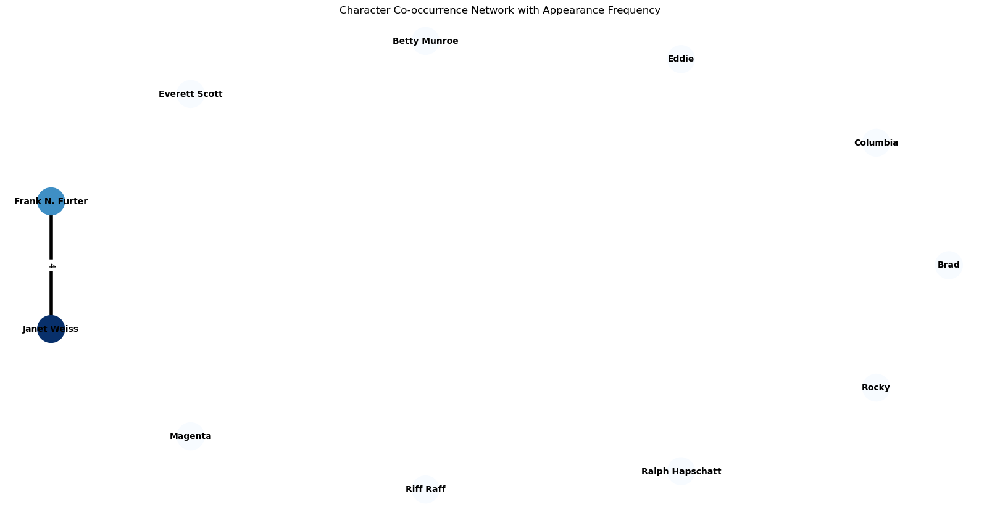

Network density: 0.01818181818181818


In [62]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/40258689.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(16, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()

density = nx.density(G)
print("Network density:", density)

In [614]:
##40481862.txt

Brad: 0
Columbia: 22
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 0
Janet Weiss: 0
Magenta: 18
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


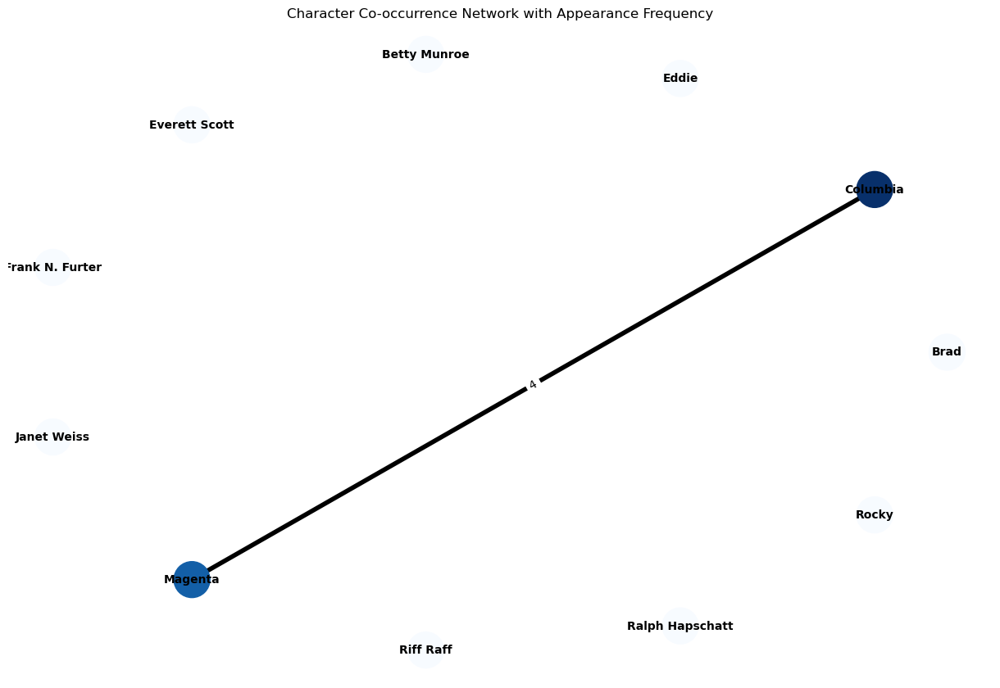

Network density: 0.01818181818181818


In [63]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/40481862.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()

density = nx.density(G)
print("Network density:", density)

In [616]:
##4092298.txt

Brad: 287
Columbia: 55
Eddie: 9
Betty Munroe: 0
Everett Scott: 48
Frank N. Furter: 554
Janet Weiss: 233
Magenta: 107
Riff Raff: 262
Ralph Hapschatt: 1
Rocky: 18


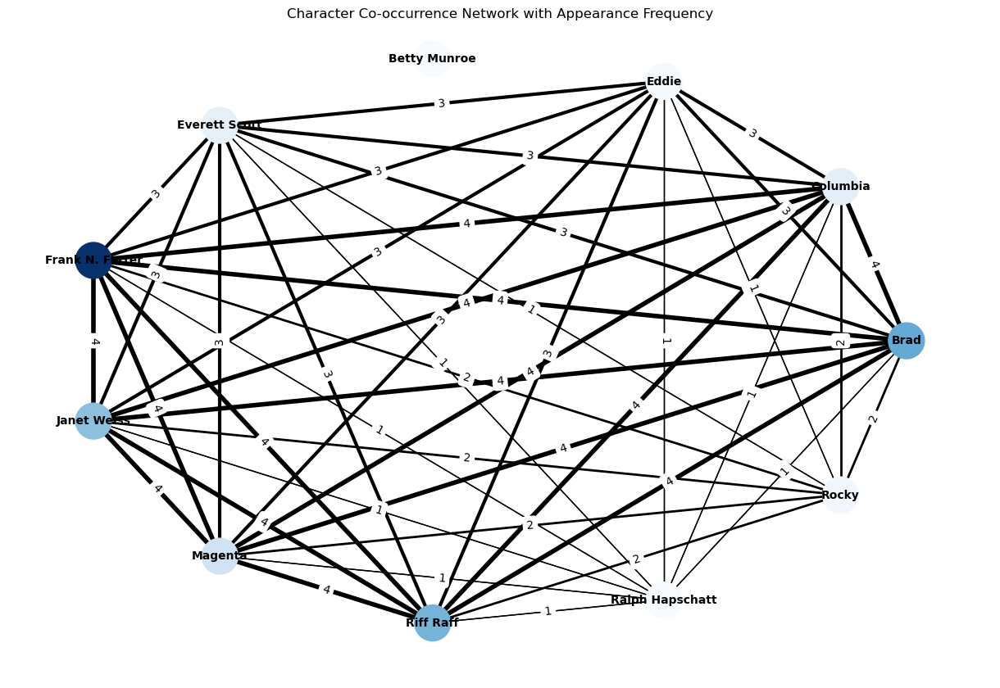


Degree Centrality:
Brad: 0.9000
Columbia: 0.9000
Eddie: 0.9000
Betty Munroe: 0.0000
Everett Scott: 0.9000
Frank N. Furter: 0.9000
Janet Weiss: 0.9000
Magenta: 0.9000
Riff Raff: 0.9000
Ralph Hapschatt: 0.8000
Rocky: 0.8000
Network density: 0.8


In [58]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/4092298.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [618]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 10
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.9778

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Everett Scott: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Ralph Hapschatt: 0.9000
Rocky: 0.9000

Betweenness Centrality:
Brad: 0.0035
Columbia: 0.0035
Eddie: 0.0035
Everett Scott: 0.0035
Frank N. Furter: 0.0035
Janet Weiss: 0.0035
Magenta: 0.0035
Riff Raff: 0.0035
Ralph Hapschatt: 0.0000
Rocky: 0.0000


In [619]:
##41571429.txt

Brad: 29
Columbia: 1
Eddie: 0
Betty Munroe: 0
Everett Scott: 11
Frank N. Furter: 8
Janet Weiss: 25
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 3


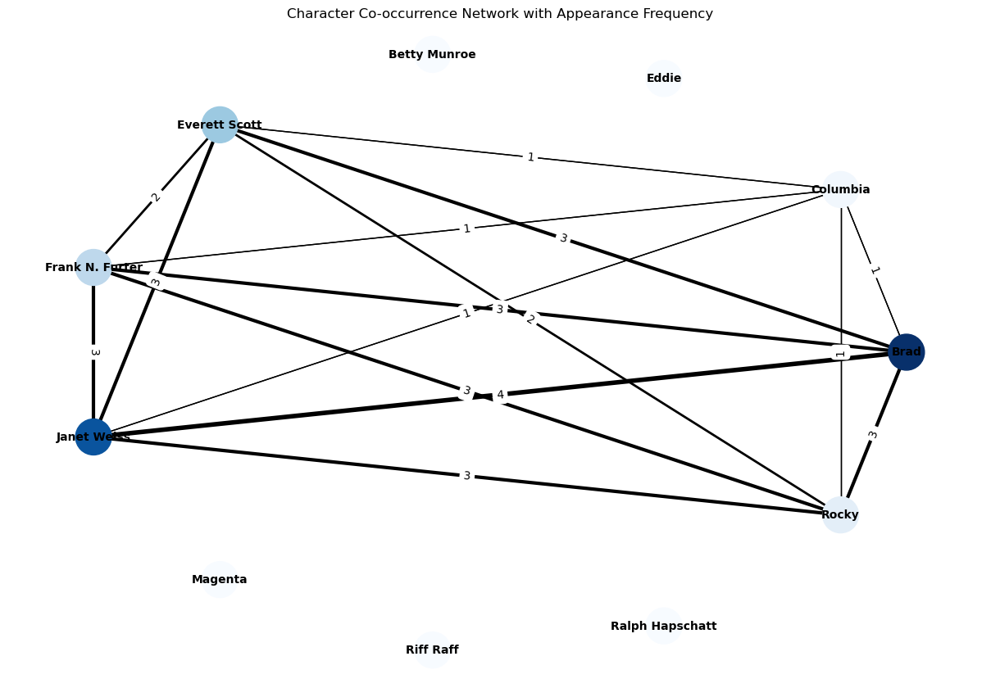


Degree Centrality:
Brad: 0.5000
Columbia: 0.5000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.5000
Frank N. Furter: 0.5000
Janet Weiss: 0.5000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.5000
Network density: 0.2727272727272727


In [59]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/41571429.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [621]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 6
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Everett Scott: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Rocky: 0.0000


In [622]:
##41587494.txt

Brad: 8
Columbia: 1
Eddie: 0
Betty Munroe: 0
Everett Scott: 9
Frank N. Furter: 75
Janet Weiss: 85
Magenta: 4
Riff Raff: 3
Ralph Hapschatt: 0
Rocky: 4


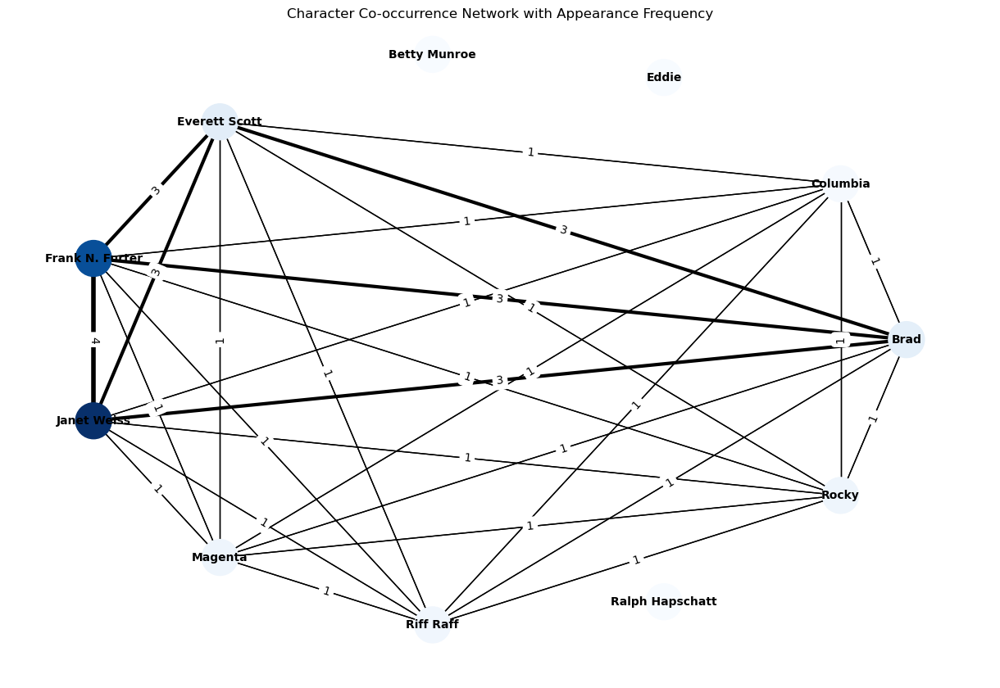


Degree Centrality:
Brad: 0.7000
Columbia: 0.7000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.7000
Frank N. Furter: 0.7000
Janet Weiss: 0.7000
Magenta: 0.7000
Riff Raff: 0.7000
Ralph Hapschatt: 0.0000
Rocky: 0.7000
Network density: 0.509090909090909


In [60]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/41587494.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [624]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 8
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Everett Scott: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Rocky: 0.0000


In [625]:
##42486444_txt.txt

Brad: 0
Columbia: 9
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 2
Janet Weiss: 0
Magenta: 20
Riff Raff: 18
Ralph Hapschatt: 0
Rocky: 0


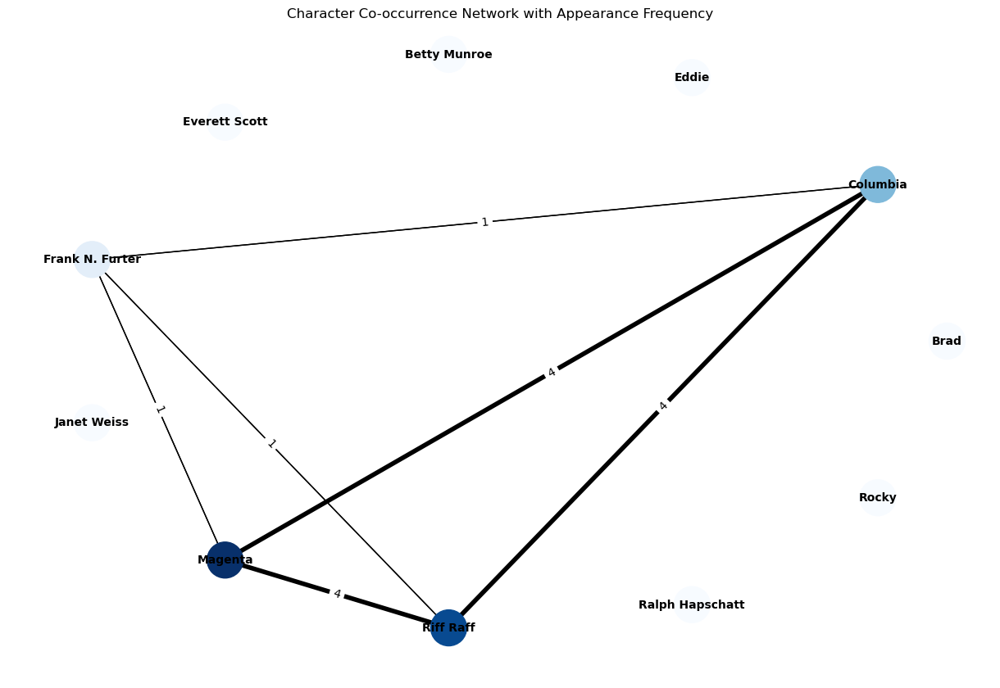


Degree Centrality:
Brad: 0.0000
Columbia: 0.3000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.3000
Janet Weiss: 0.0000
Magenta: 0.3000
Riff Raff: 0.3000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.10909090909090909


In [61]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/42486444_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [627]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 4
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Columbia: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Columbia: 0.0000


In [628]:
##42717156_txt.txt

Brad: 1
Columbia: 3
Eddie: 6
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 0
Janet Weiss: 1
Magenta: 2
Riff Raff: 2
Ralph Hapschatt: 0
Rocky: 2


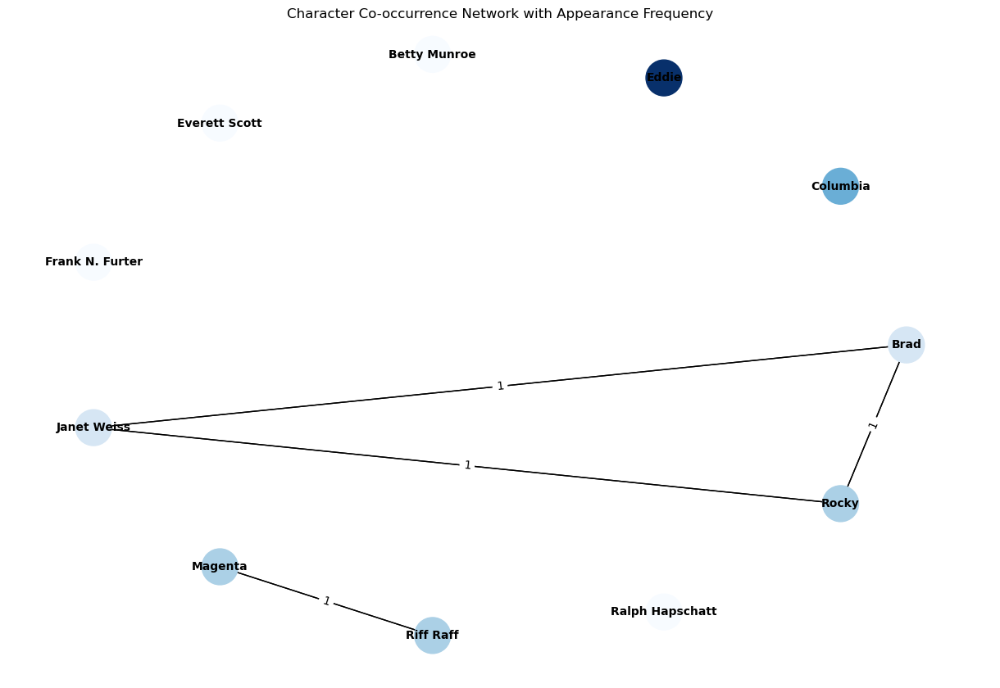


Degree Centrality:
Brad: 0.2000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.2000
Magenta: 0.1000
Riff Raff: 0.1000
Ralph Hapschatt: 0.0000
Rocky: 0.2000
Network density: 0.07272727272727272


In [62]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/42717156_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [630]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 5
Is the network connected? No
Number of connected components: 2
Network Density: 0.4000

Closeness Centrality:
Janet Weiss: 0.5000
Magenta: 0.2500
Brad: 0.5000
Rocky: 0.5000
Riff Raff: 0.2500

Betweenness Centrality:
Janet Weiss: 0.0000
Magenta: 0.0000
Brad: 0.0000
Rocky: 0.0000
Riff Raff: 0.0000


In [631]:
##42737817_txt.txt

Brad: 0
Columbia: 14
Eddie: 3
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 0
Janet Weiss: 3
Magenta: 8
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 2


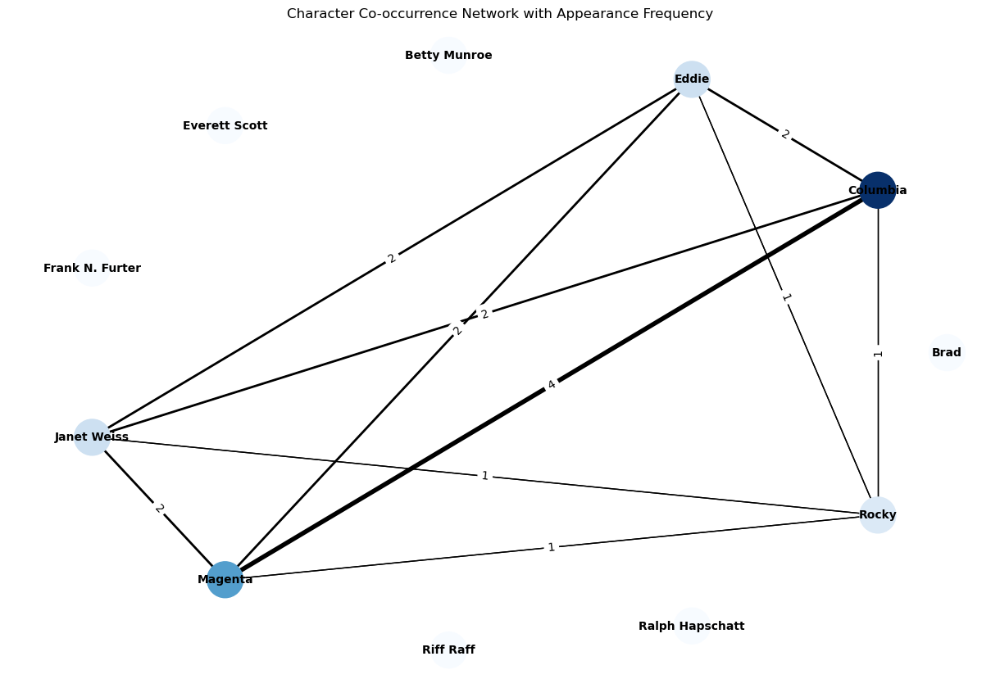


Degree Centrality:
Brad: 0.0000
Columbia: 0.4000
Eddie: 0.4000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.4000
Magenta: 0.4000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.4000
Network density: 0.18181818181818182


In [63]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/42737817_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [633]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 5
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Janet Weiss: 1.0000
Magenta: 1.0000
Columbia: 1.0000
Rocky: 1.0000
Eddie: 1.0000

Betweenness Centrality:
Janet Weiss: 0.0000
Magenta: 0.0000
Columbia: 0.0000
Rocky: 0.0000
Eddie: 0.0000


In [634]:
##43430671_txt.txt

Brad: 288
Columbia: 1369
Eddie: 308
Betty Munroe: 315
Everett Scott: 4
Frank N. Furter: 779
Janet Weiss: 492
Magenta: 1092
Riff Raff: 776
Ralph Hapschatt: 54
Rocky: 84


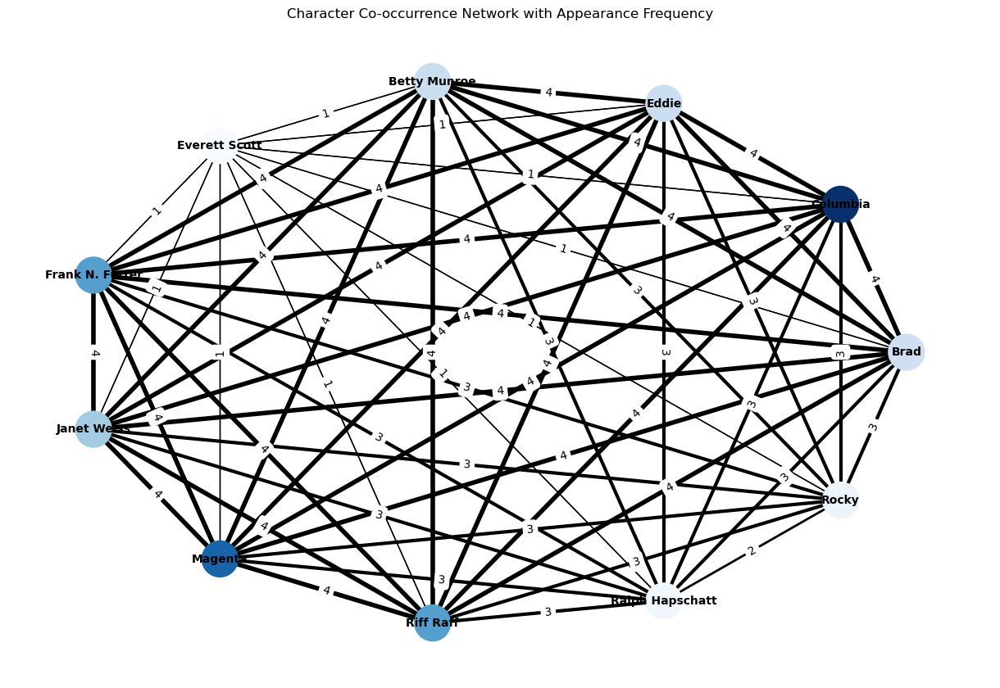


Degree Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Betty Munroe: 1.0000
Everett Scott: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Ralph Hapschatt: 1.0000
Rocky: 1.0000
Network density: 1.0


In [64]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/43430671_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [636]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 11
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Betty Munroe: 1.0000
Everett Scott: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Ralph Hapschatt: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.0000


In [637]:
##44492005_txt.txt

Brad: 0
Columbia: 12
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 13
Janet Weiss: 0
Magenta: 34
Riff Raff: 18
Ralph Hapschatt: 0
Rocky: 0


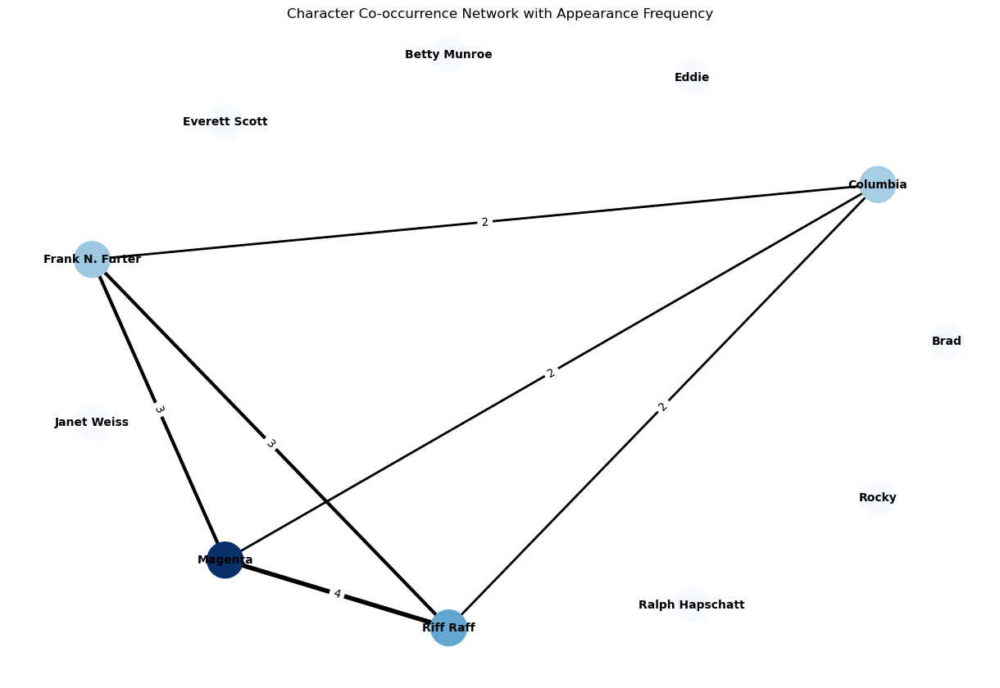


Degree Centrality:
Brad: 0.0000
Columbia: 0.3000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.3000
Janet Weiss: 0.0000
Magenta: 0.3000
Riff Raff: 0.3000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.10909090909090909


In [65]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/44492005_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [639]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 4
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Columbia: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Columbia: 0.0000


In [640]:
##44501146_txt.txt

Brad: 0
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 31
Janet Weiss: 28
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


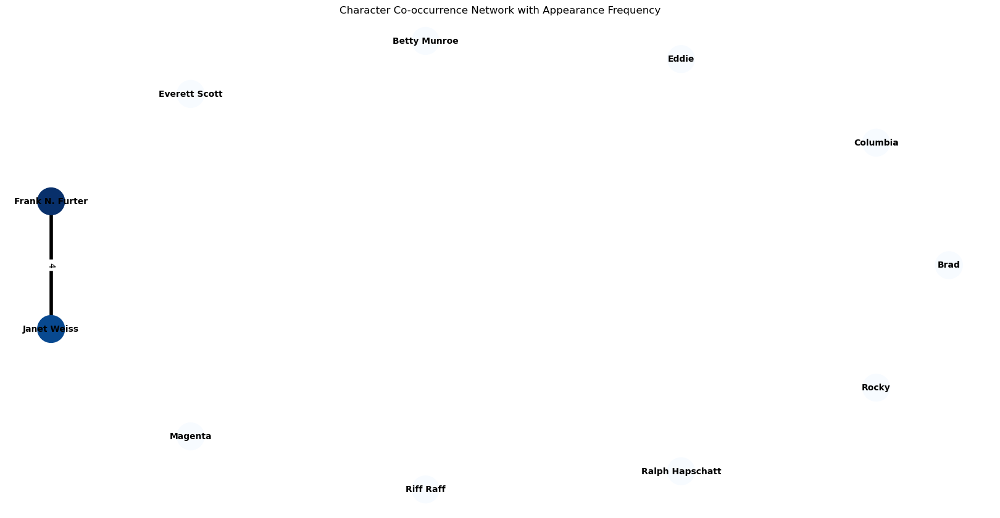

Network density: 0.01818181818181818


In [72]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/44501146_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(16, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()

density = nx.density(G)
print("Network density:", density)

In [642]:
##46470013_txt.txt

Brad: 2
Columbia: 27
Eddie: 26
Betty Munroe: 1
Everett Scott: 1
Frank N. Furter: 166
Janet Weiss: 2
Magenta: 27
Riff Raff: 45
Ralph Hapschatt: 0
Rocky: 17


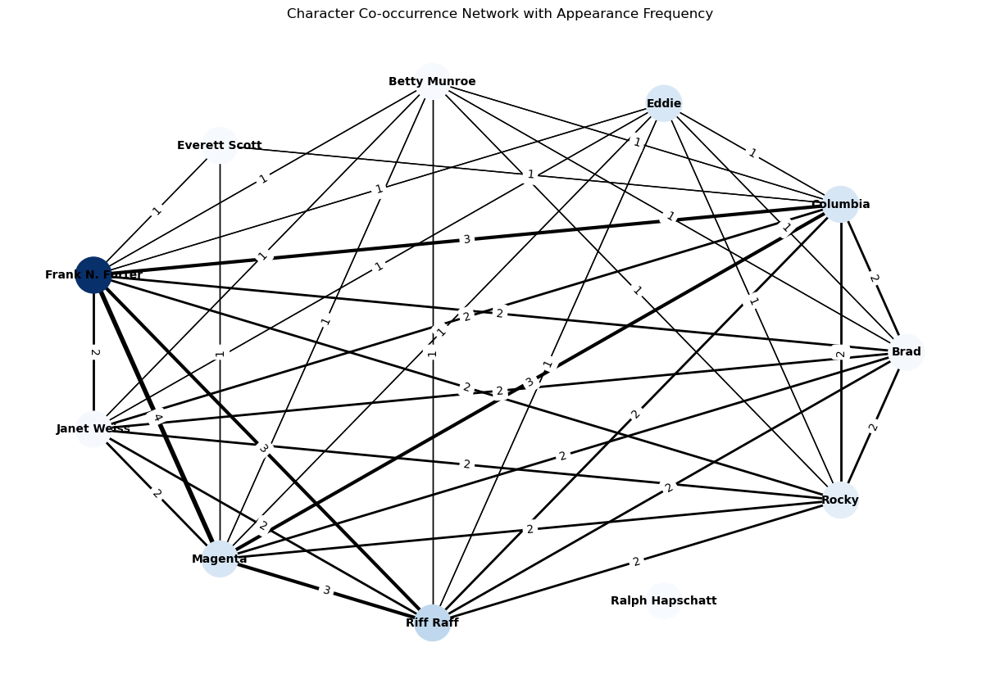


Degree Centrality:
Brad: 0.8000
Columbia: 0.9000
Eddie: 0.7000
Betty Munroe: 0.7000
Everett Scott: 0.3000
Frank N. Furter: 0.9000
Janet Weiss: 0.8000
Magenta: 0.9000
Riff Raff: 0.8000
Ralph Hapschatt: 0.0000
Rocky: 0.8000
Network density: 0.6909090909090909


In [66]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/46470013_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [644]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 10
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.8444

Closeness Centrality:
Brad: 0.9000
Columbia: 1.0000
Eddie: 0.8182
Betty Munroe: 0.8182
Everett Scott: 0.6000
Frank N. Furter: 1.0000
Janet Weiss: 0.9000
Magenta: 1.0000
Riff Raff: 0.9000
Rocky: 0.9000

Betweenness Centrality:
Brad: 0.0040
Columbia: 0.0595
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0595
Janet Weiss: 0.0040
Magenta: 0.0595
Riff Raff: 0.0040
Rocky: 0.0040


In [645]:
##46787956_txt.txt

Brad: 10
Columbia: 1
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 12
Janet Weiss: 14
Magenta: 1
Riff Raff: 0
Ralph Hapschatt: 1
Rocky: 0


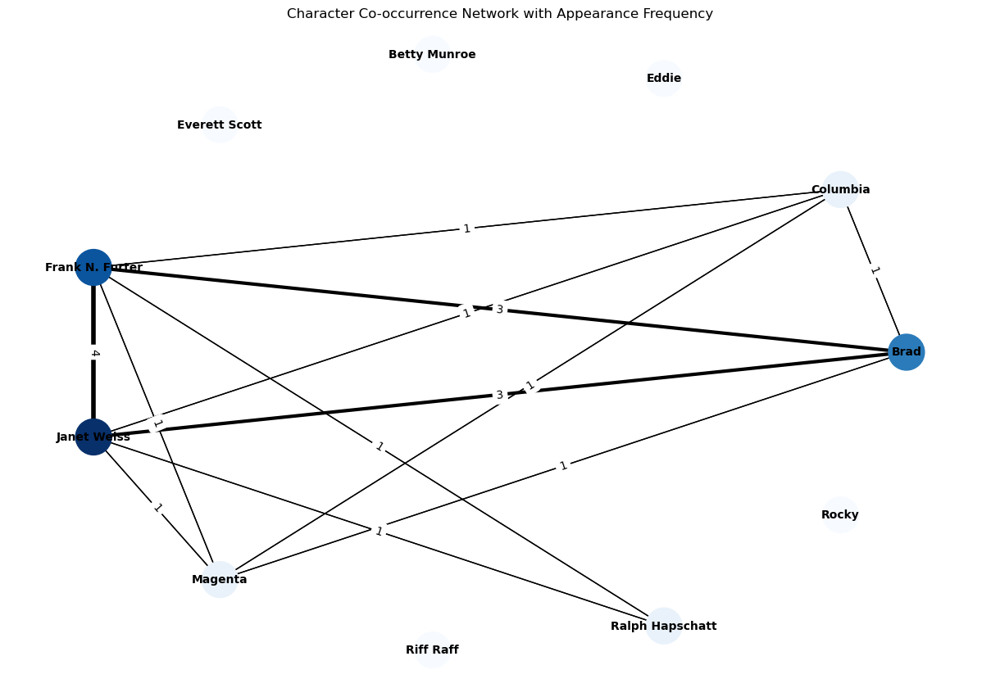


Degree Centrality:
Brad: 0.4000
Columbia: 0.4000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.5000
Janet Weiss: 0.5000
Magenta: 0.4000
Riff Raff: 0.0000
Ralph Hapschatt: 0.2000
Rocky: 0.0000
Network density: 0.21818181818181817


In [67]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/46787956_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [647]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 6
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.8000

Closeness Centrality:
Brad: 0.8333
Columbia: 0.8333
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 0.8333
Ralph Hapschatt: 0.6250

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0000
Frank N. Furter: 0.1500
Janet Weiss: 0.1500
Magenta: 0.0000
Ralph Hapschatt: 0.0000


In [648]:
##47993905_txt.txt

Brad: 0
Columbia: 3
Eddie: 2
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 21
Janet Weiss: 0
Magenta: 29
Riff Raff: 29
Ralph Hapschatt: 0
Rocky: 2


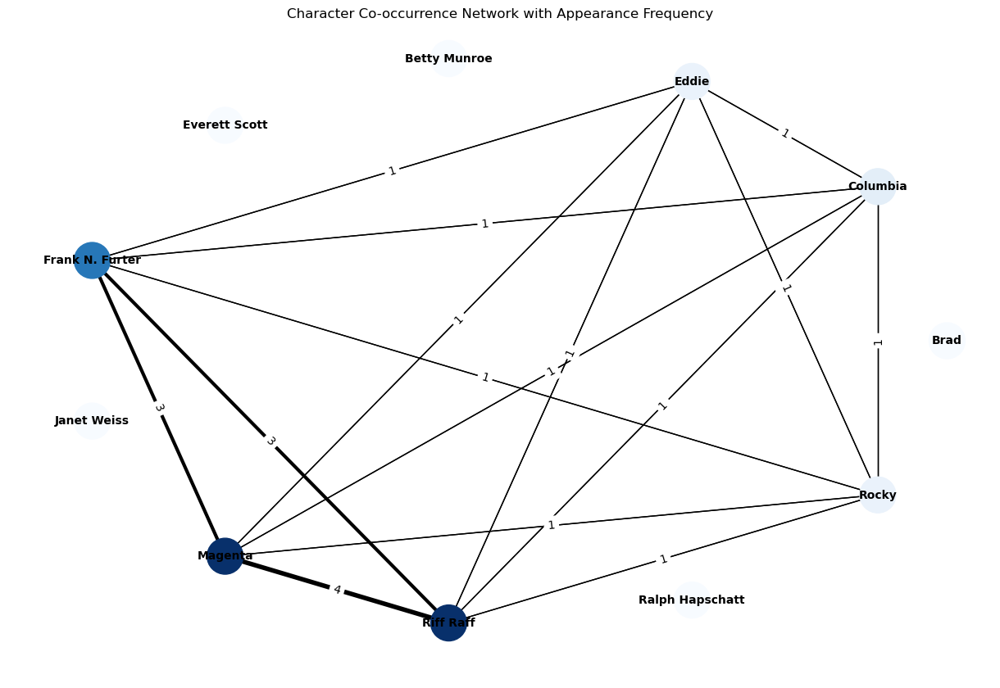


Degree Centrality:
Brad: 0.0000
Columbia: 0.5000
Eddie: 0.5000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.5000
Janet Weiss: 0.0000
Magenta: 0.5000
Riff Raff: 0.5000
Ralph Hapschatt: 0.0000
Rocky: 0.5000
Network density: 0.2727272727272727


In [68]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/47993905_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [650]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 6
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Columbia: 1.0000
Eddie: 1.0000
Frank N. Furter: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Columbia: 0.0000
Eddie: 0.0000
Frank N. Furter: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Rocky: 0.0000


In [651]:
##49048579_txt.txt

Brad: 0
Columbia: 24
Eddie: 125
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 63
Janet Weiss: 0
Magenta: 9
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


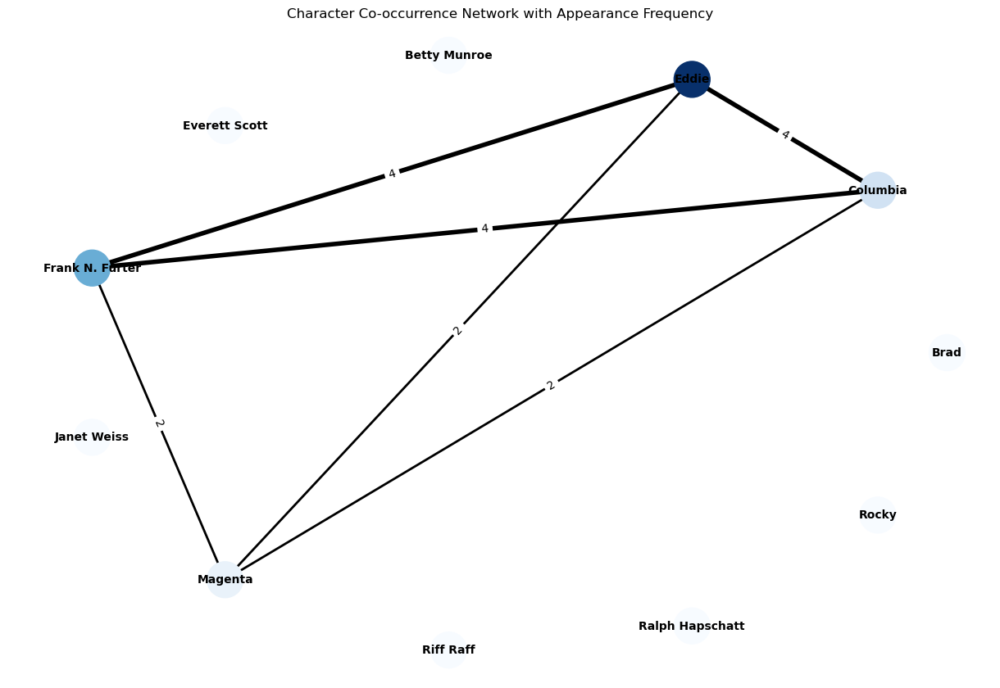


Degree Centrality:
Brad: 0.0000
Columbia: 0.3000
Eddie: 0.3000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.3000
Janet Weiss: 0.0000
Magenta: 0.3000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.10909090909090909


In [69]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/49048579_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [653]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 4
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Eddie: 1.0000
Magenta: 1.0000
Columbia: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Eddie: 0.0000
Magenta: 0.0000
Columbia: 0.0000


In [654]:
##49190599_txt.txt

Brad: 0
Columbia: 11
Eddie: 4
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 18
Janet Weiss: 0
Magenta: 25
Riff Raff: 6
Ralph Hapschatt: 0
Rocky: 0


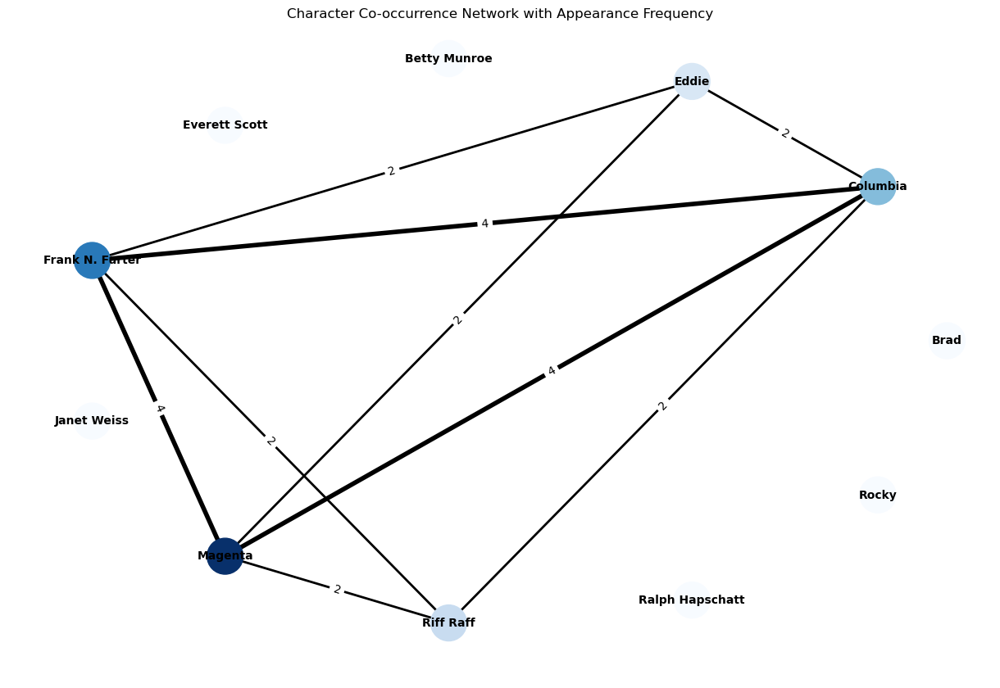


Degree Centrality:
Brad: 0.0000
Columbia: 0.4000
Eddie: 0.3000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.4000
Janet Weiss: 0.0000
Magenta: 0.4000
Riff Raff: 0.3000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.16363636363636364


In [70]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/49190599_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [656]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 5
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.9000

Closeness Centrality:
Frank N. Furter: 1.0000
Magenta: 1.0000
Columbia: 1.0000
Eddie: 0.8000
Riff Raff: 0.8000

Betweenness Centrality:
Frank N. Furter: 0.0556
Magenta: 0.0556
Columbia: 0.0556
Eddie: 0.0000
Riff Raff: 0.0000


In [657]:
##49230934_txt.txt

Brad: 56
Columbia: 16
Eddie: 2
Betty Munroe: 0
Everett Scott: 2
Frank N. Furter: 67
Janet Weiss: 92
Magenta: 22
Riff Raff: 5
Ralph Hapschatt: 0
Rocky: 127


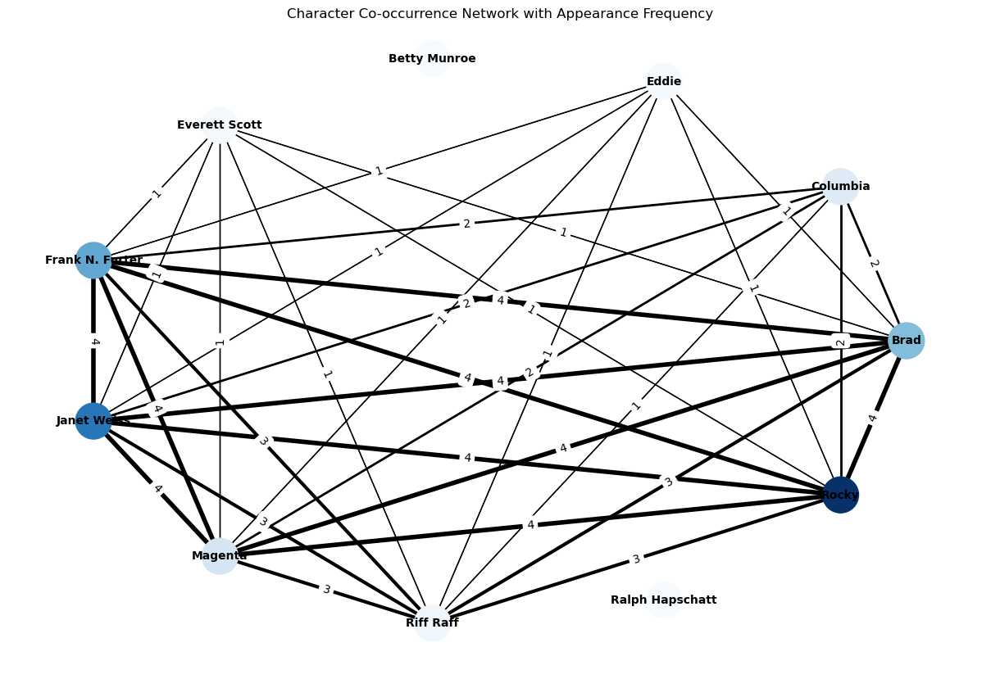


Degree Centrality:
Brad: 0.8000
Columbia: 0.6000
Eddie: 0.6000
Betty Munroe: 0.0000
Everett Scott: 0.6000
Frank N. Furter: 0.8000
Janet Weiss: 0.8000
Magenta: 0.8000
Riff Raff: 0.8000
Ralph Hapschatt: 0.0000
Rocky: 0.8000
Network density: 0.6


In [71]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/49230934_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [659]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 9
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.9167

Closeness Centrality:
Brad: 1.0000
Columbia: 0.8000
Eddie: 0.8000
Everett Scott: 0.8000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0179
Columbia: 0.0000
Eddie: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0179
Janet Weiss: 0.0179
Magenta: 0.0179
Riff Raff: 0.0179
Rocky: 0.0179


In [660]:
##49454569_txt.txt

Brad: 44
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 46
Janet Weiss: 0
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


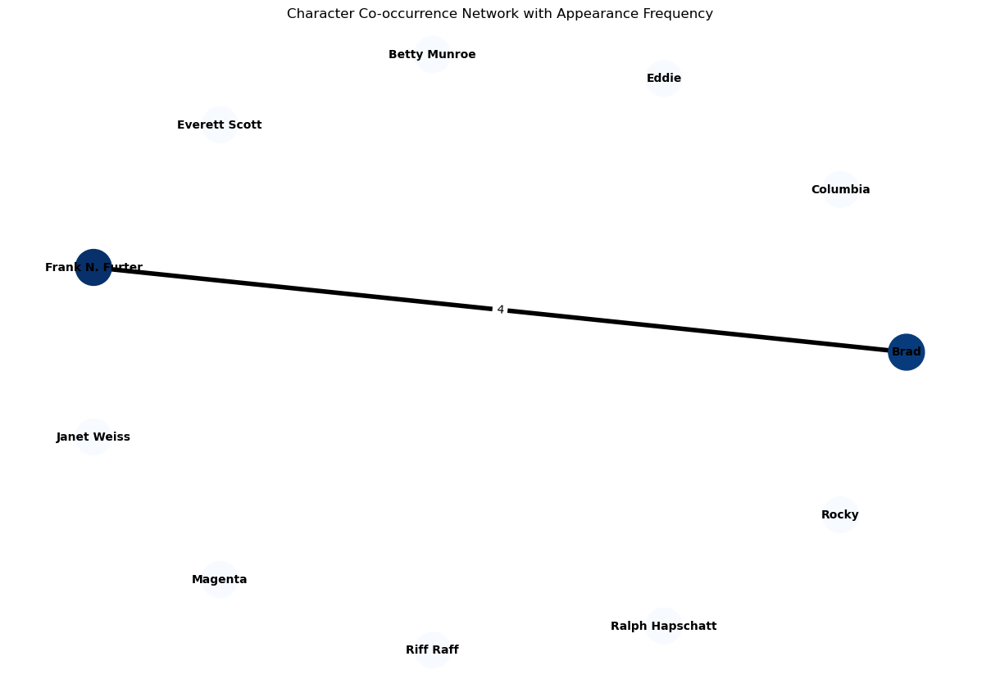


Degree Centrality:
Brad: 0.1000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.1000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.01818181818181818


In [73]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/49454569_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [662]:
##49753975_txt.txt

Brad: 15
Columbia: 112
Eddie: 3
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 15
Janet Weiss: 162
Magenta: 69
Riff Raff: 1
Ralph Hapschatt: 0
Rocky: 0


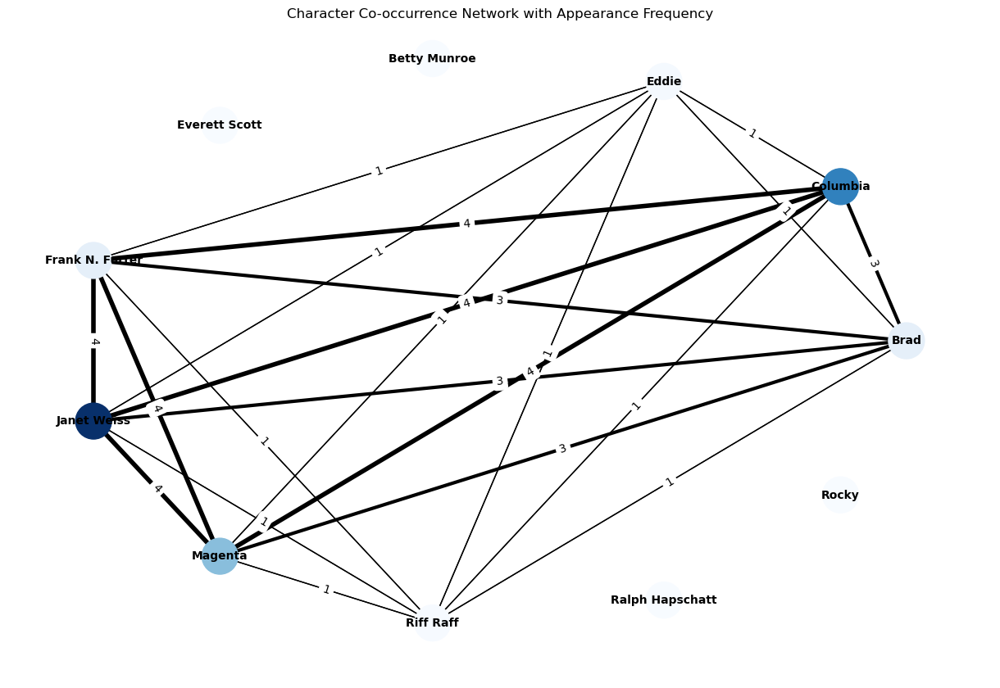


Degree Centrality:
Brad: 0.6000
Columbia: 0.6000
Eddie: 0.6000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.6000
Janet Weiss: 0.6000
Magenta: 0.6000
Riff Raff: 0.6000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.38181818181818183


In [74]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/49753975_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [664]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 7
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Brad: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000


In [665]:
##49808935_txt.txt

Brad: 0
Columbia: 21
Eddie: 18
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 14
Janet Weiss: 0
Magenta: 12
Riff Raff: 4
Ralph Hapschatt: 0
Rocky: 0


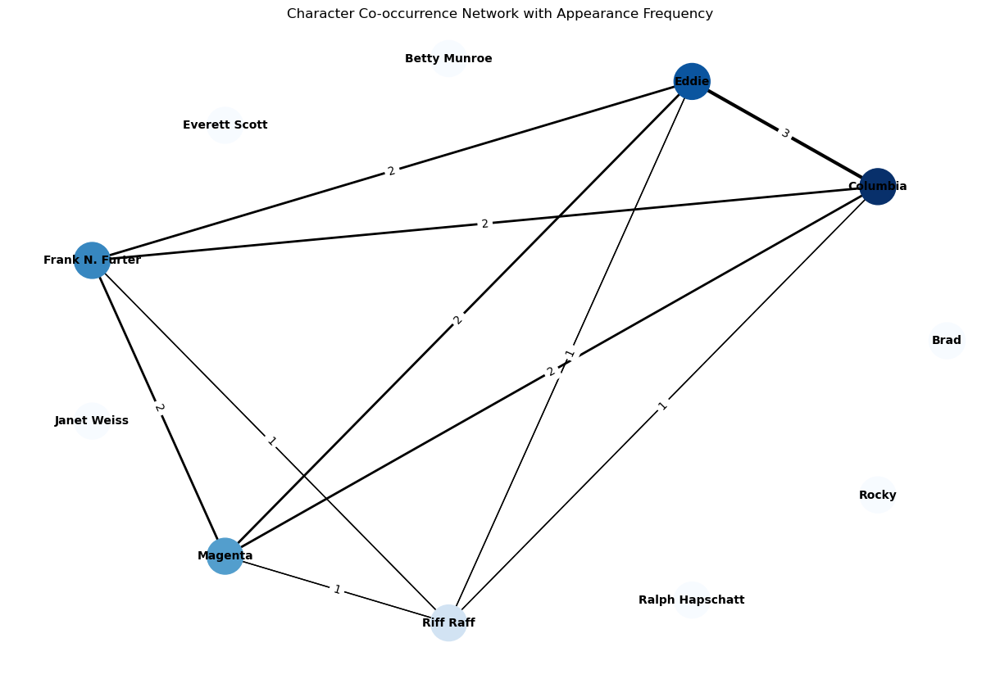


Degree Centrality:
Brad: 0.0000
Columbia: 0.4000
Eddie: 0.4000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.4000
Janet Weiss: 0.0000
Magenta: 0.4000
Riff Raff: 0.4000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.18181818181818182


In [75]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/49808935_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [667]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 5
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Magenta: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Riff Raff: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Magenta: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Riff Raff: 0.0000


In [668]:
##50729368_txt.txt

Brad: 0
Columbia: 5
Eddie: 13
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 0
Janet Weiss: 0
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


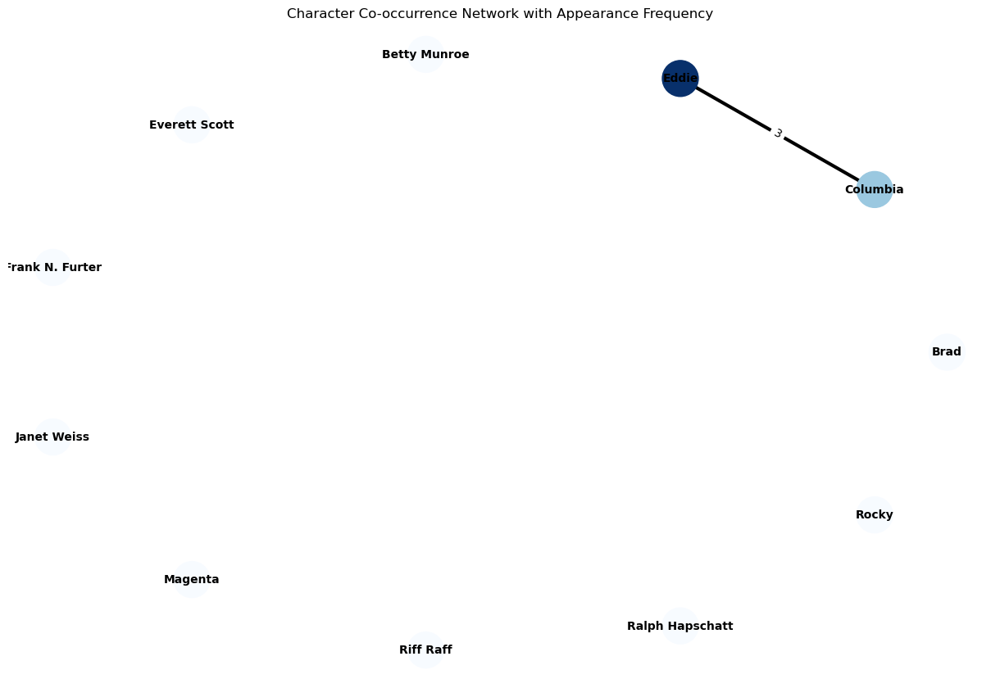


Degree Centrality:
Brad: 0.0000
Columbia: 0.1000
Eddie: 0.1000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.01818181818181818


In [76]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/50729368_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [670]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 3
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
eddie: 1.0000
frank: 1.0000
columbia: 1.0000

Betweenness Centrality:
eddie: 0.0000
frank: 0.0000
columbia: 0.0000


In [671]:
##50886793_txt.txt

Brad: 2
Columbia: 2
Eddie: 9
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 9
Janet Weiss: 3
Magenta: 3
Riff Raff: 3
Ralph Hapschatt: 0
Rocky: 6


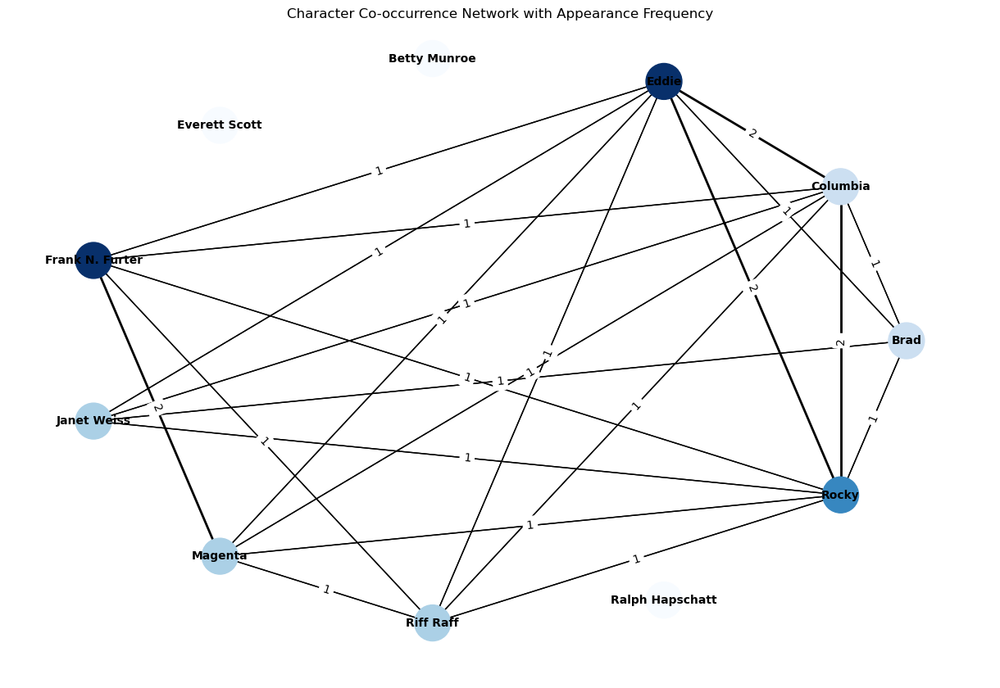


Degree Centrality:
Brad: 0.4000
Columbia: 0.7000
Eddie: 0.7000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.5000
Janet Weiss: 0.4000
Magenta: 0.5000
Riff Raff: 0.5000
Ralph Hapschatt: 0.0000
Rocky: 0.7000
Network density: 0.4


In [77]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/50886793_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [673]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 8
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.7857

Closeness Centrality:
Brad: 0.7000
Columbia: 1.0000
Eddie: 1.0000
Frank N. Furter: 0.7778
Janet Weiss: 0.7000
Magenta: 0.7778
Riff Raff: 0.7778
Rocky: 1.0000

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0952
Eddie: 0.0952
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000
Rocky: 0.0952


In [674]:
##51255037_txt.txt

Brad: 0
Columbia: 23
Eddie: 3
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 5
Janet Weiss: 0
Magenta: 23
Riff Raff: 12
Ralph Hapschatt: 0
Rocky: 0


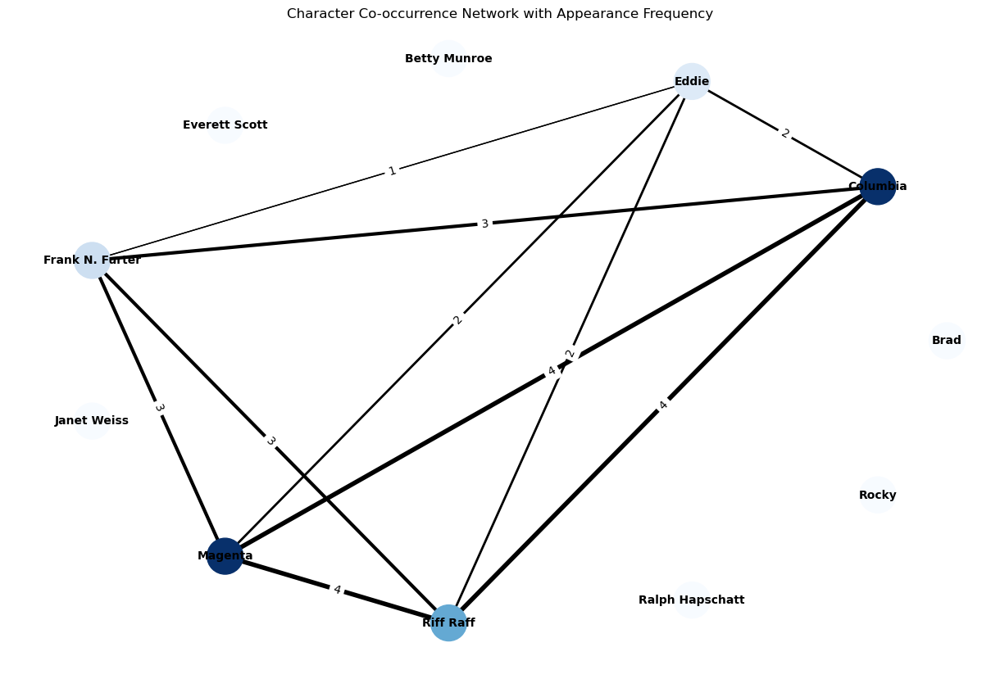


Degree Centrality:
Brad: 0.0000
Columbia: 0.4000
Eddie: 0.4000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.4000
Janet Weiss: 0.0000
Magenta: 0.4000
Riff Raff: 0.4000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.18181818181818182


In [78]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/51255037_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [676]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 5
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Magenta: 1.0000
Columbia: 1.0000
Eddie: 1.0000
Riff Raff: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Magenta: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Riff Raff: 0.0000


In [677]:
##51274501_txt.txt

Brad: 21
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 9
Janet Weiss: 33
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 1


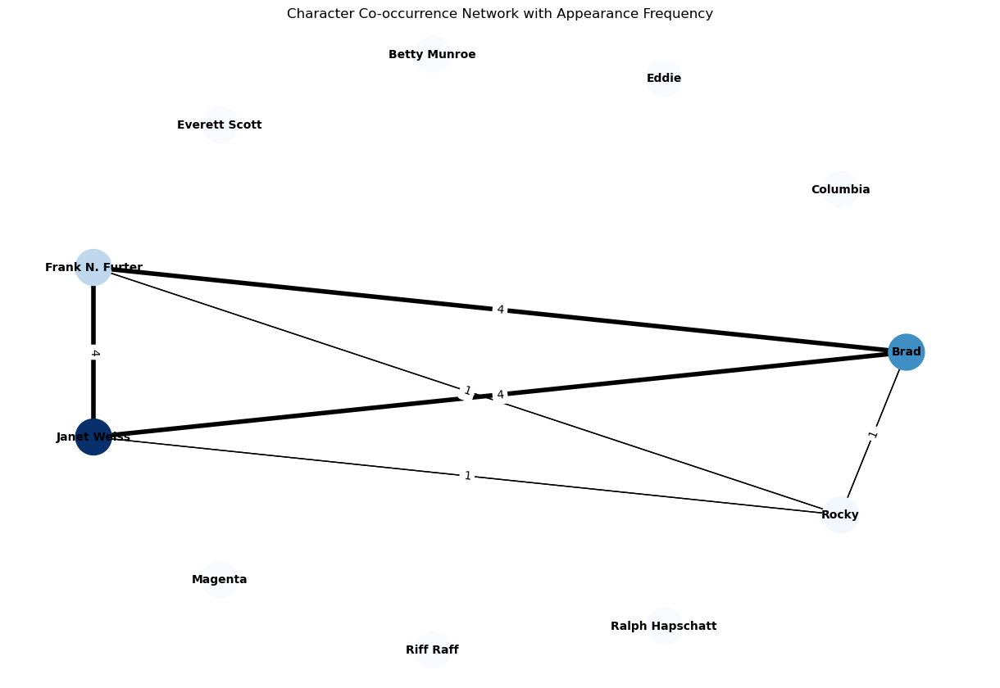


Degree Centrality:
Brad: 0.3000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.3000
Janet Weiss: 0.3000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.0000
Rocky: 0.3000
Network density: 0.10909090909090909


In [79]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/51274501_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [679]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 4
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Brad: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Brad: 0.0000
Rocky: 0.0000


In [680]:
##51817627_txt.txt

Brad: 0
Columbia: 2
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 0
Janet Weiss: 0
Magenta: 5
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


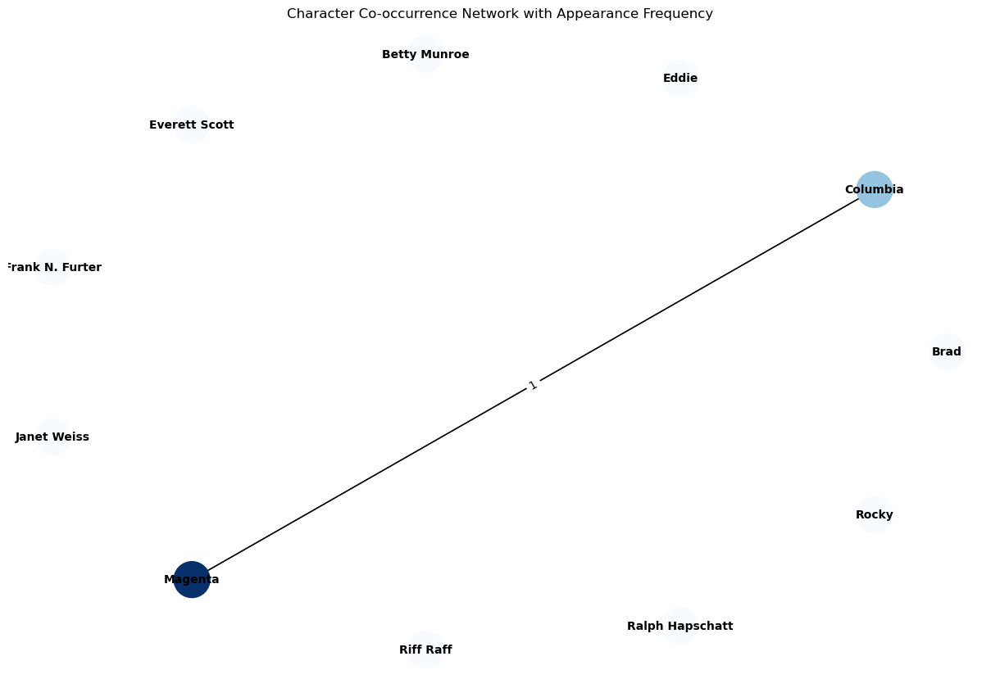

Network density: 0.01818181818181818


In [86]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/51817627_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()

density = nx.density(G)
print("Network density:", density)

In [682]:
##51831301_txt.txt

Brad: 0
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 1
Janet Weiss: 0
Magenta: 8
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


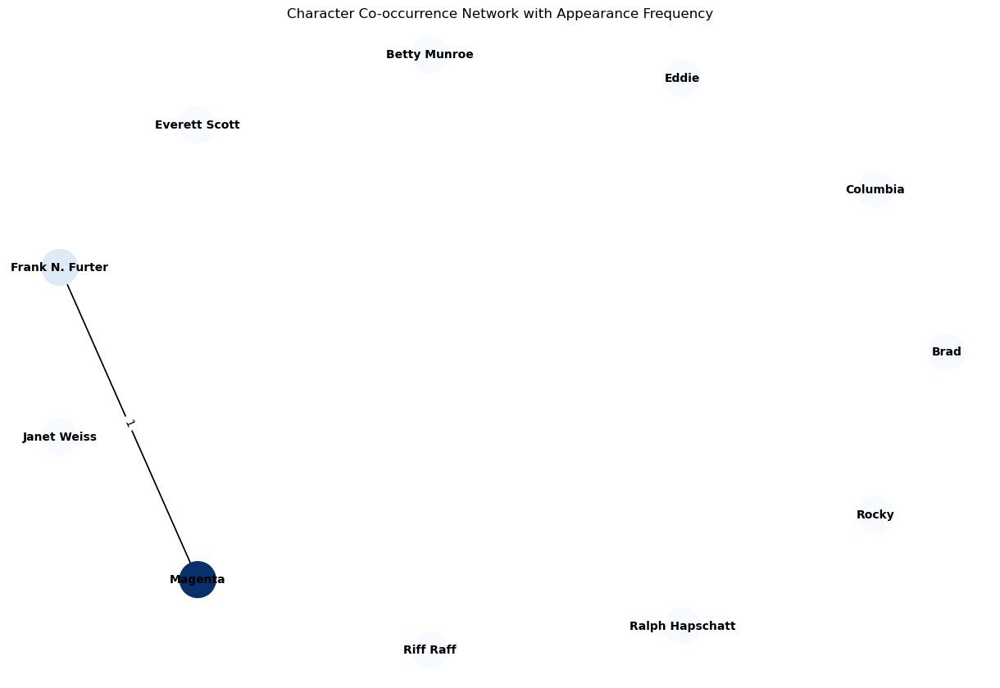

Network density: 0.01818181818181818


In [87]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/51831301_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()

density = nx.density(G)
print("Network density:", density)

In [684]:
##52511266_txt.txt

Brad: 0
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 12
Janet Weiss: 11
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


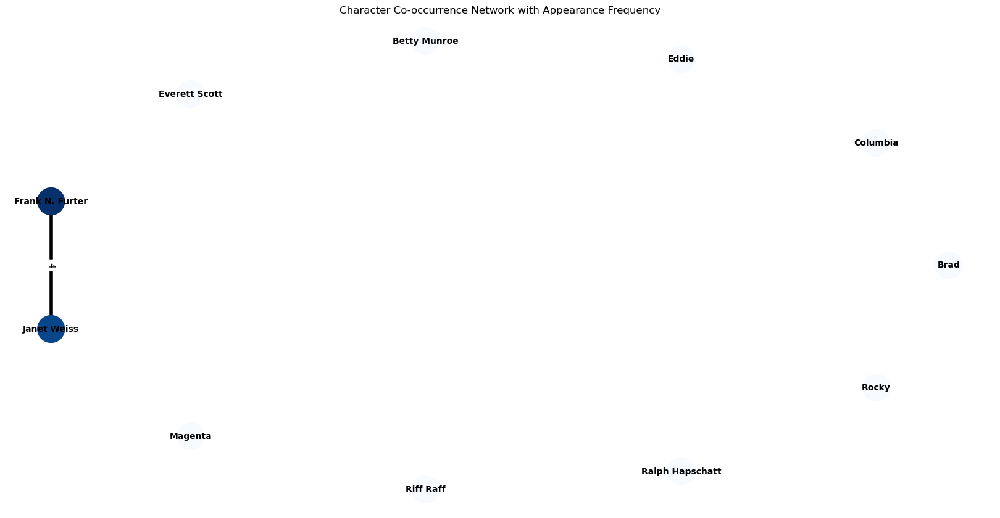

Network density: 0.01818181818181818


In [88]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/52511266_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(16, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()

density = nx.density(G)
print("Network density:", density)


In [686]:
##52540231_txt.txt

Brad: 17
Columbia: 10
Eddie: 1
Betty Munroe: 3
Everett Scott: 0
Frank N. Furter: 17
Janet Weiss: 24
Magenta: 14
Riff Raff: 1
Ralph Hapschatt: 0
Rocky: 4


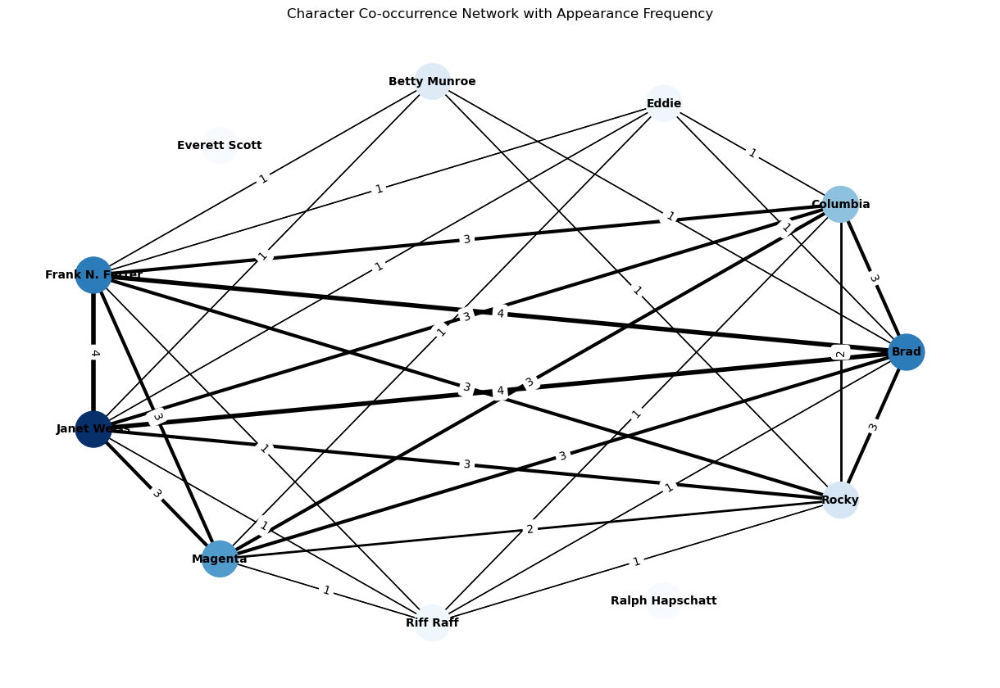


Degree Centrality:
Brad: 0.8000
Columbia: 0.7000
Eddie: 0.5000
Betty Munroe: 0.4000
Everett Scott: 0.0000
Frank N. Furter: 0.8000
Janet Weiss: 0.8000
Magenta: 0.7000
Riff Raff: 0.6000
Ralph Hapschatt: 0.0000
Rocky: 0.7000
Network density: 0.5454545454545454


In [80]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/52540231_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [688]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 9
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.8333

Closeness Centrality:
Brad: 1.0000
Columbia: 0.8889
Eddie: 0.7273
Betty Munroe: 0.6667
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 0.8889
Riff Raff: 0.8000
Rocky: 0.8889

Betweenness Centrality:
Brad: 0.0530
Columbia: 0.0143
Eddie: 0.0000
Betty Munroe: 0.0000
Frank N. Furter: 0.0530
Janet Weiss: 0.0530
Magenta: 0.0143
Riff Raff: 0.0000
Rocky: 0.0268


In [689]:
##52744153_txt.txt

Brad: 113
Columbia: 0
Eddie: 0
Betty Munroe: 18
Everett Scott: 4
Frank N. Furter: 7
Janet Weiss: 145
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 16
Rocky: 0


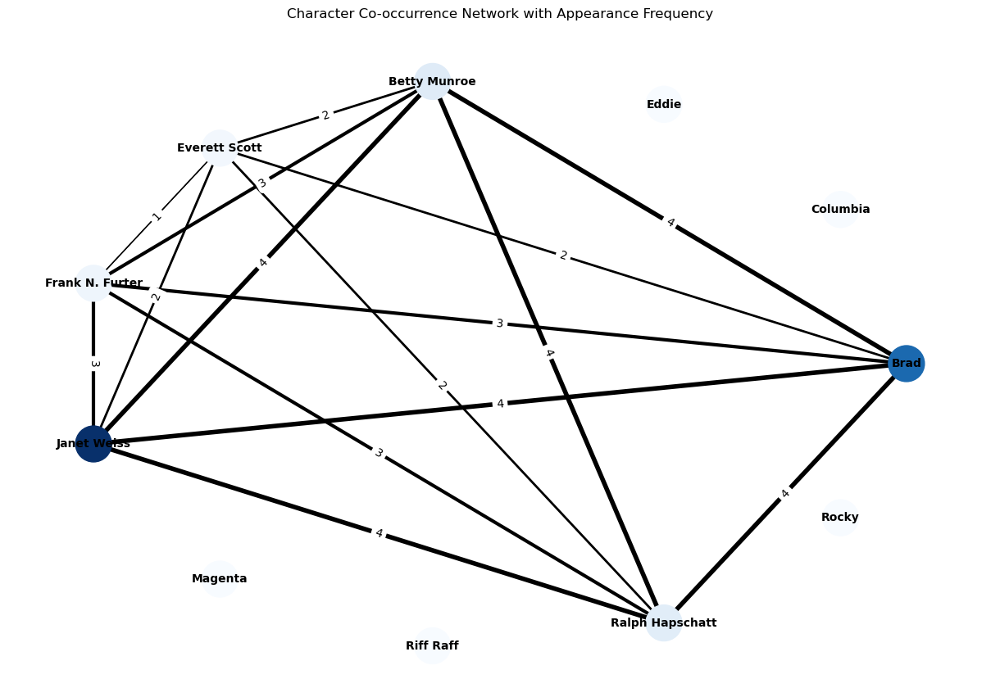


Degree Centrality:
Brad: 0.5000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.5000
Everett Scott: 0.5000
Frank N. Furter: 0.5000
Janet Weiss: 0.5000
Magenta: 0.0000
Riff Raff: 0.0000
Ralph Hapschatt: 0.5000
Rocky: 0.0000
Network density: 0.2727272727272727


In [81]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/52744153_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [691]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 6
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Brad: 1.0000
Betty Munroe: 1.0000
Everett Scott: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Ralph Hapschatt: 1.0000

Betweenness Centrality:
Brad: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Ralph Hapschatt: 0.0000


In [692]:
##52865872_txt.txt

Brad: 191
Columbia: 1
Eddie: 0
Betty Munroe: 1
Everett Scott: 21
Frank N. Furter: 151
Janet Weiss: 111
Magenta: 1
Riff Raff: 5
Ralph Hapschatt: 1
Rocky: 1


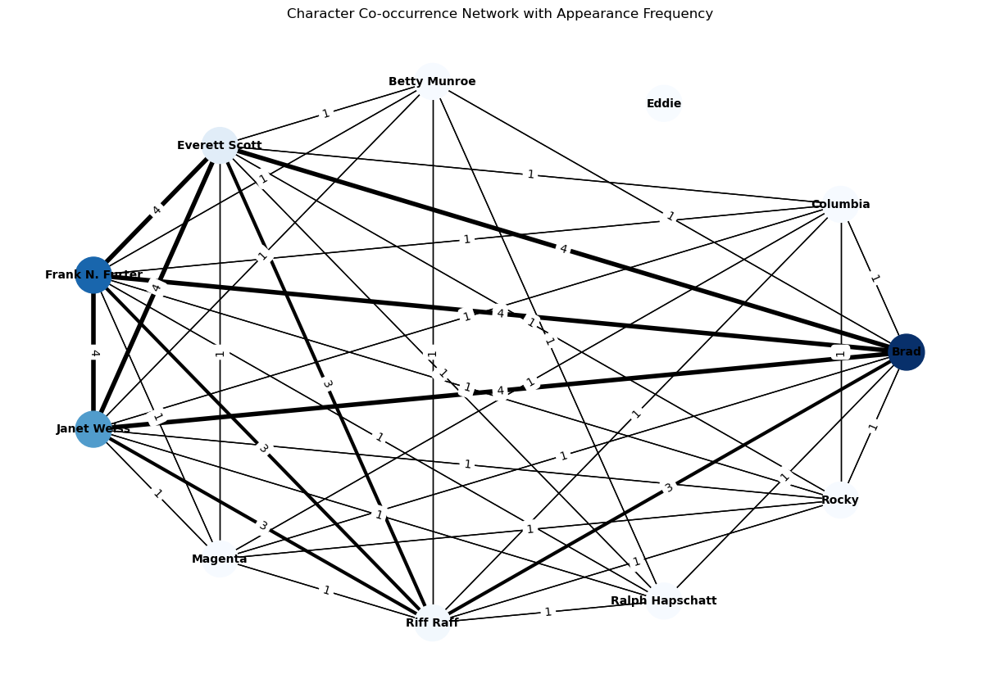


Degree Centrality:
Brad: 0.9000
Columbia: 0.7000
Eddie: 0.0000
Betty Munroe: 0.6000
Everett Scott: 0.9000
Frank N. Furter: 0.9000
Janet Weiss: 0.9000
Magenta: 0.7000
Riff Raff: 0.9000
Ralph Hapschatt: 0.6000
Rocky: 0.7000
Network density: 0.7090909090909091


In [82]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/52865872_txt.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [694]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 10
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.8667

Closeness Centrality:
Brad: 1.0000
Columbia: 0.8182
Betty Munroe: 0.7500
Everett Scott: 1.0000
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Magenta: 0.8182
Riff Raff: 1.0000
Ralph Hapschatt: 0.7500
Rocky: 0.8182

Betweenness Centrality:
Brad: 0.0333
Columbia: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0333
Frank N. Furter: 0.0333
Janet Weiss: 0.0333
Magenta: 0.0000
Riff Raff: 0.0333
Ralph Hapschatt: 0.0000
Rocky: 0.0000


In [695]:
##53459851_txt.txt

Brad: 0
Columbia: 9
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 210
Janet Weiss: 0
Magenta: 53
Riff Raff: 186
Ralph Hapschatt: 0
Rocky: 2


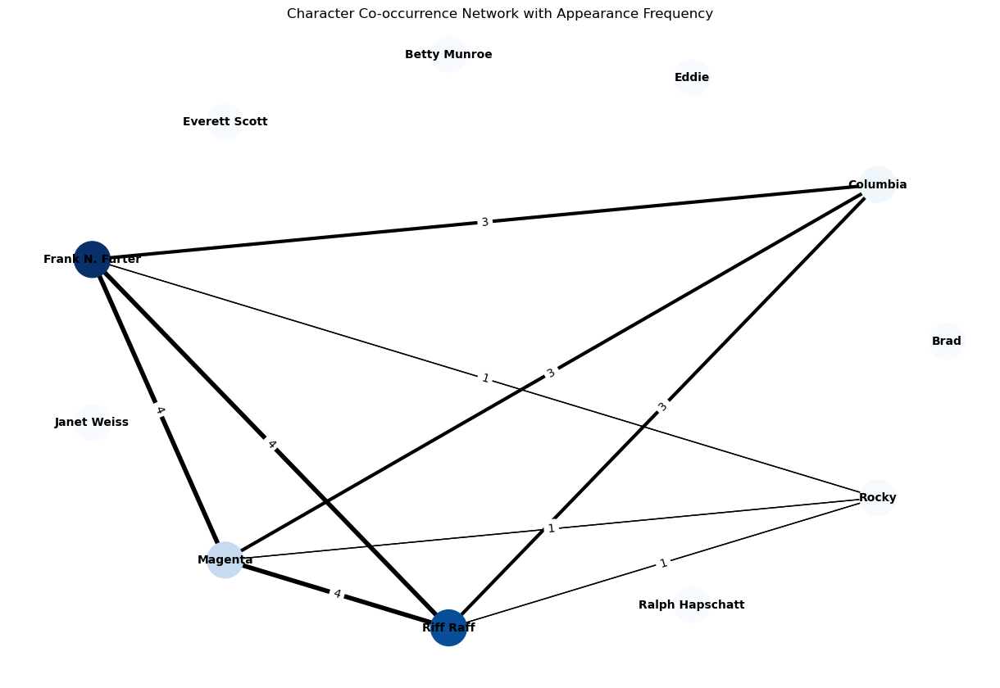


Degree Centrality:
Brad: 0.0000
Columbia: 0.3000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.4000
Janet Weiss: 0.0000
Magenta: 0.4000
Riff Raff: 0.4000
Ralph Hapschatt: 0.0000
Rocky: 0.3000
Network density: 0.16363636363636364


In [83]:

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts


with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)



names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/53459851_txt.txt"
text = read_text(filename)


for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [697]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 5
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.9000

Closeness Centrality:
Frank N. Furter: 1.0000
Magenta: 1.0000
Columbia: 0.8000
Rocky: 0.8000
Riff Raff: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0556
Magenta: 0.0556
Columbia: 0.0000
Rocky: 0.0000
Riff Raff: 0.0556


In [698]:
##54502897_txt.txt

Brad: 1
Columbia: 28
Eddie: 3
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 26
Janet Weiss: 1
Magenta: 44
Riff Raff: 13
Ralph Hapschatt: 0
Rocky: 0


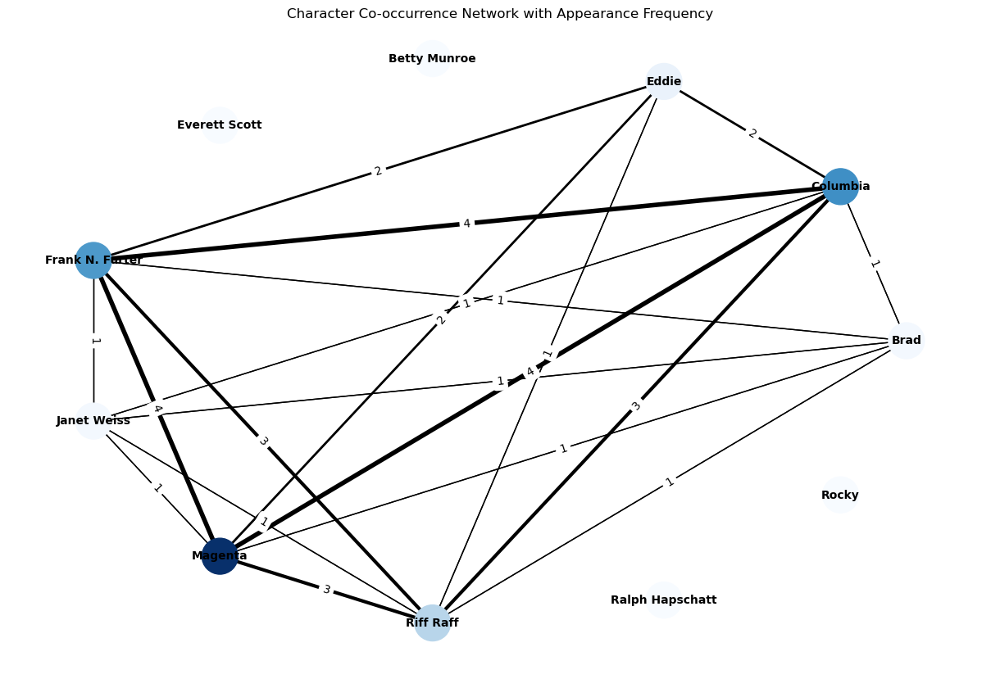


Degree Centrality:
Brad: 0.5000
Columbia: 0.6000
Eddie: 0.4000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.6000
Janet Weiss: 0.5000
Magenta: 0.6000
Riff Raff: 0.6000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.34545454545454546


In [84]:


import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts


with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)



names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/54502897_txt.txt"
text = read_text(filename)


for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [700]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 7
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.9048

Closeness Centrality:
Brad: 0.8571
Columbia: 1.0000
Eddie: 0.7500
Frank N. Furter: 1.0000
Janet Weiss: 0.8571
Magenta: 1.0000
Riff Raff: 1.0000

Betweenness Centrality:
Brad: 0.0000
Columbia: 0.0333
Eddie: 0.0000
Frank N. Furter: 0.0333
Janet Weiss: 0.0000
Magenta: 0.0333
Riff Raff: 0.0333


In [701]:
##5538284.txt

Brad: 0
Columbia: 13
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 31
Janet Weiss: 0
Magenta: 11
Riff Raff: 14
Ralph Hapschatt: 0
Rocky: 5


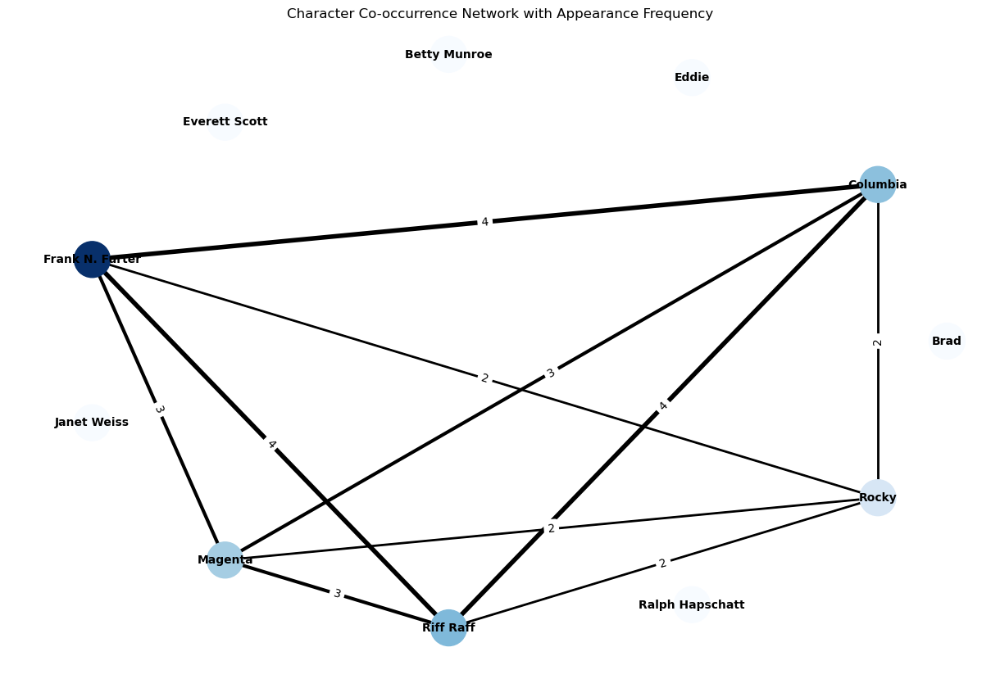


Degree Centrality:
Brad: 0.0000
Columbia: 0.4000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.4000
Janet Weiss: 0.0000
Magenta: 0.4000
Riff Raff: 0.4000
Ralph Hapschatt: 0.0000
Rocky: 0.4000
Network density: 0.18181818181818182


In [85]:


import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/5538284.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [703]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 5
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Magenta: 1.0000
Columbia: 1.0000
Rocky: 1.0000
Riff Raff: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Magenta: 0.0000
Columbia: 0.0000
Rocky: 0.0000
Riff Raff: 0.0000


In [704]:
##6030289.txt

Brad: 58
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 56
Janet Weiss: 5
Magenta: 0
Riff Raff: 3
Ralph Hapschatt: 0
Rocky: 0


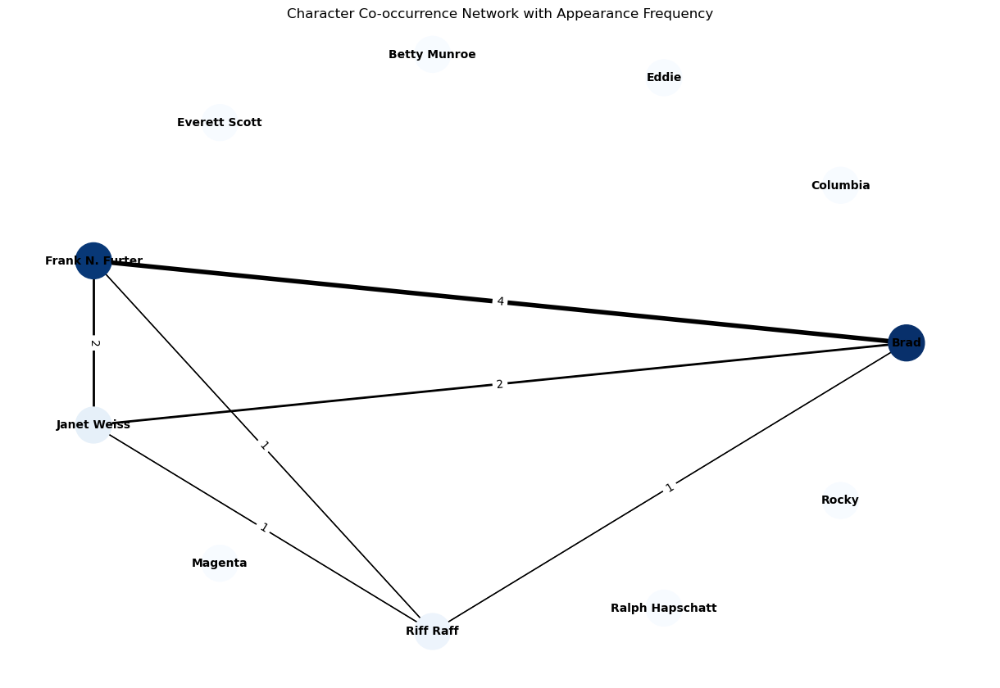


Degree Centrality:
Brad: 0.3000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.3000
Janet Weiss: 0.3000
Magenta: 0.0000
Riff Raff: 0.3000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.10909090909090909


In [86]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/6030289.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [706]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 4
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Riff Raff: 1.0000
Janet Weiss: 1.0000
Brad: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Riff Raff: 0.0000
Janet Weiss: 0.0000
Brad: 0.0000


In [707]:
##6323518.txt

Brad: 0
Columbia: 3
Eddie: 0
Betty Munroe: 0
Everett Scott: 2
Frank N. Furter: 3
Janet Weiss: 0
Magenta: 3
Riff Raff: 4
Ralph Hapschatt: 0
Rocky: 6


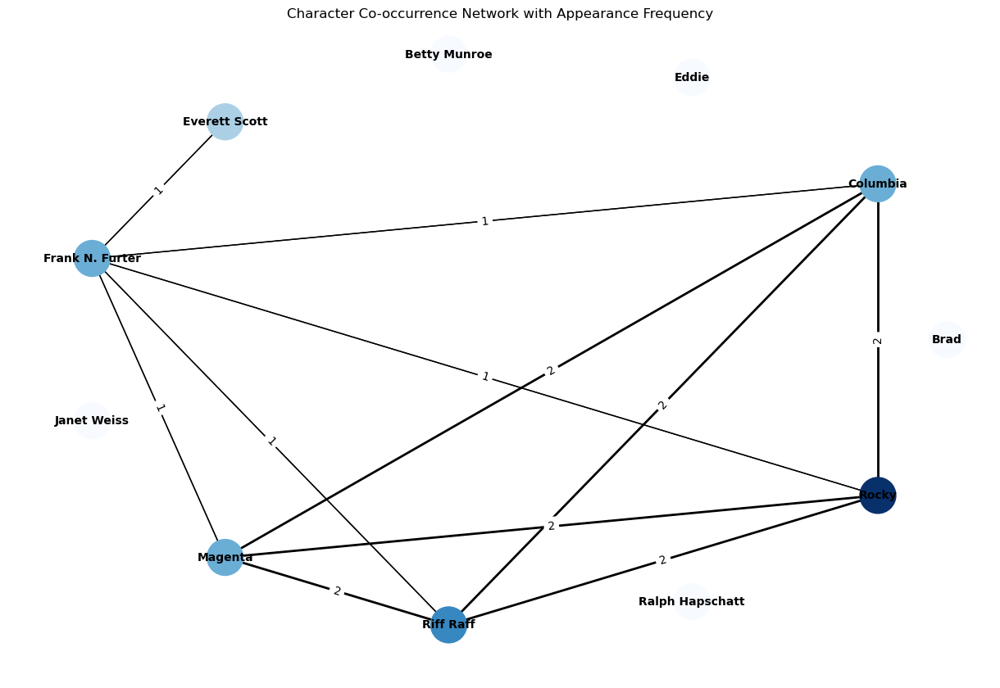


Degree Centrality:
Brad: 0.0000
Columbia: 0.4000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.1000
Frank N. Furter: 0.5000
Janet Weiss: 0.0000
Magenta: 0.4000
Riff Raff: 0.4000
Ralph Hapschatt: 0.0000
Rocky: 0.4000
Network density: 0.2


In [87]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/6323518.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [709]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 6
Is the network connected? Yes
Number of connected components: 1
Network Density: 0.7333

Closeness Centrality:
Columbia: 0.8333
Everett Scott: 0.5556
Frank N. Furter: 1.0000
Magenta: 0.8333
Riff Raff: 0.8333
Rocky: 0.8333

Betweenness Centrality:
Columbia: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.4000
Magenta: 0.0000
Riff Raff: 0.0000
Rocky: 0.0000


In [710]:
##7523557.txt

Brad: 0
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 11
Janet Weiss: 0
Magenta: 39
Riff Raff: 60
Ralph Hapschatt: 0
Rocky: 0


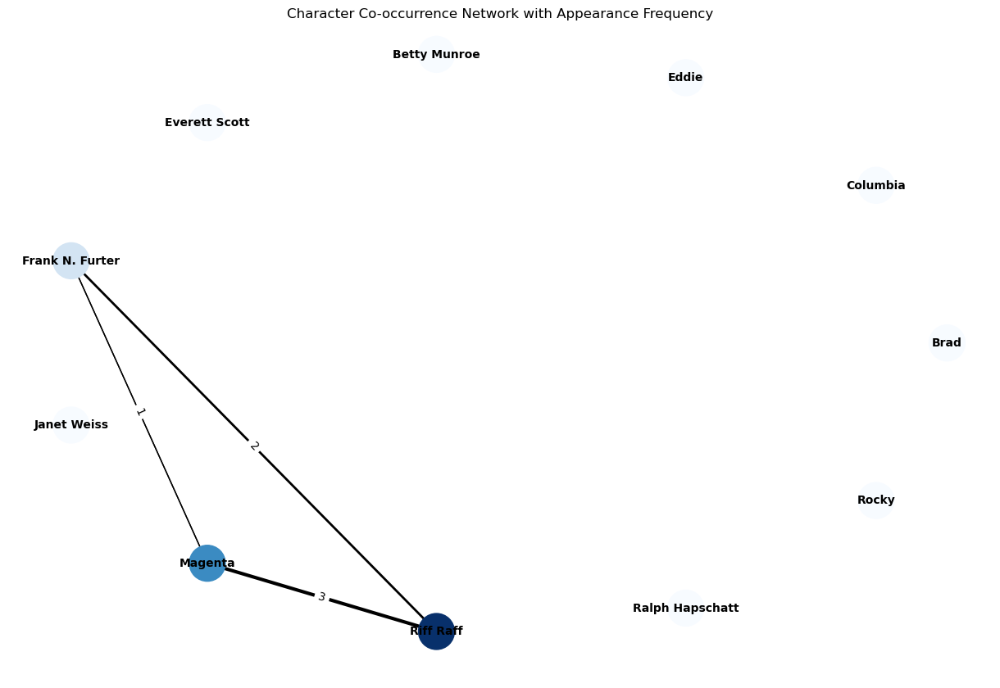


Degree Centrality:
Brad: 0.0000
Columbia: 0.0000
Eddie: 0.0000
Betty Munroe: 0.0000
Everett Scott: 0.0000
Frank N. Furter: 0.2000
Janet Weiss: 0.0000
Magenta: 0.2000
Riff Raff: 0.2000
Ralph Hapschatt: 0.0000
Rocky: 0.0000
Network density: 0.05454545454545454


In [88]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/7523557.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()


degree_centrality = nx.degree_centrality(G)
print("\nDegree Centrality:")
for name, centrality in degree_centrality.items():
    print(f"{name}: {centrality:.4f}")
density = nx.density(G)
print("Network density:", density)

In [712]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 3
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Magenta: 1.0000
Riff Raff: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Magenta: 0.0000
Riff Raff: 0.0000


In [713]:
##8186731.txt

Brad: 1
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 73
Janet Weiss: 1
Magenta: 0
Riff Raff: 0
Ralph Hapschatt: 0
Rocky: 0


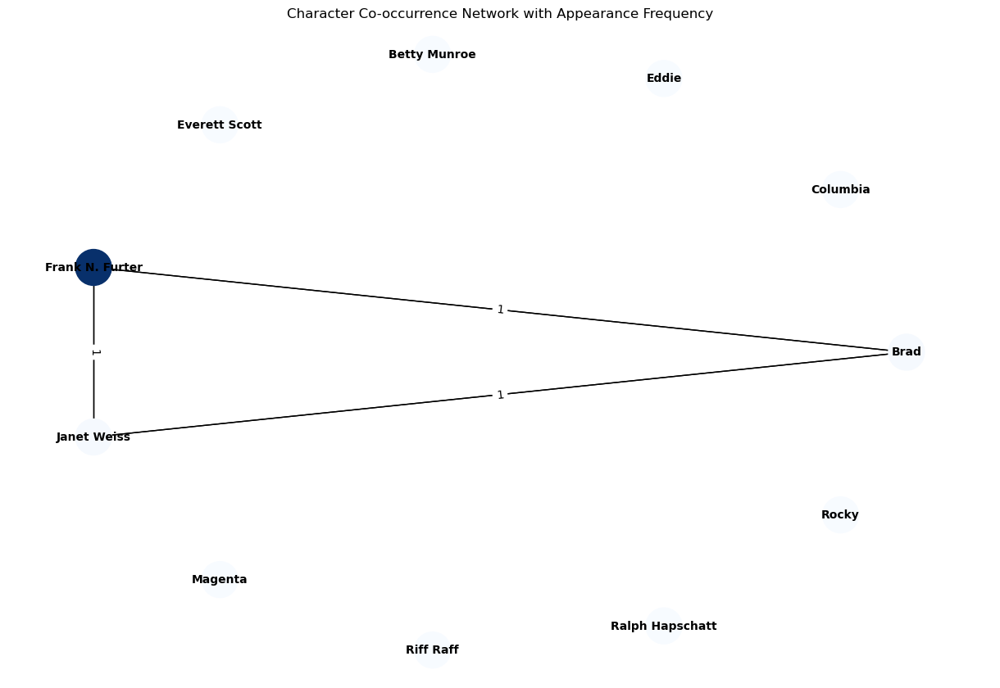

Network density: 0.05454545454545454


In [97]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/8186731.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()

density = nx.density(G)
print("Network density:", density)

In [715]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 3
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Janet Weiss: 1.0000
Brad: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Janet Weiss: 0.0000
Brad: 0.0000


In [716]:
##9351971.txt

Brad: 0
Columbia: 0
Eddie: 0
Betty Munroe: 0
Everett Scott: 0
Frank N. Furter: 1
Janet Weiss: 0
Magenta: 1
Riff Raff: 1
Ralph Hapschatt: 0
Rocky: 1


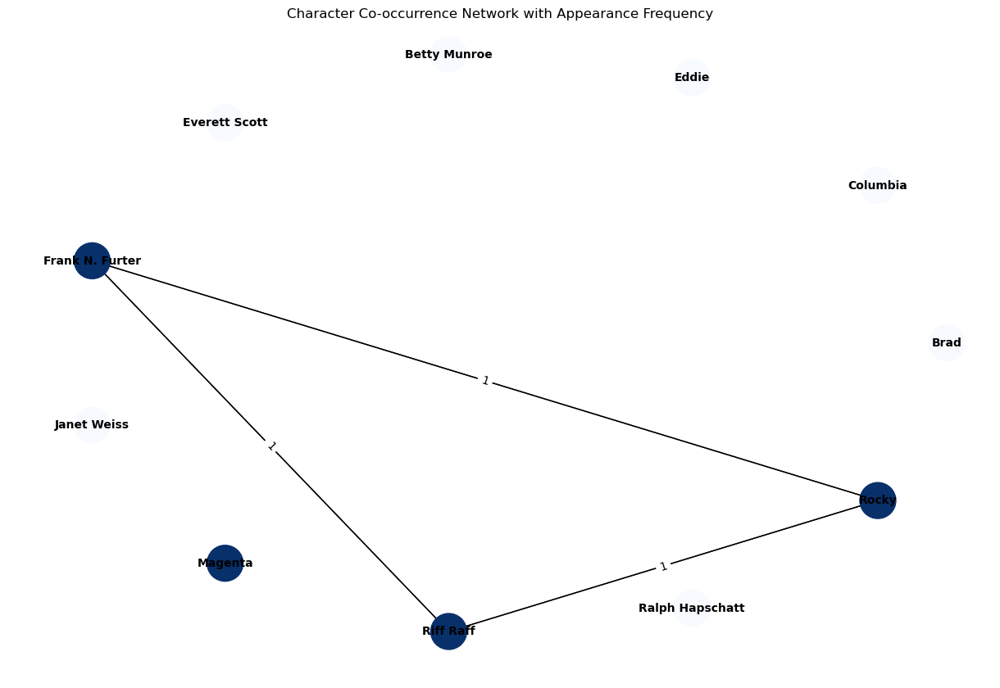

Network density: 0.05454545454545454


In [98]:
##添加了人物名称的变体

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
import os
import json

def read_text(filename):
    with open(filename, 'r', encoding='utf-8') as file:
        return file.read()

def count_character_occurrences(text, names):
    occurrences = {name: text.count(name) for name in names}
    return occurrences

def count_cooccurrences(text, names, window_size):
    cooccurrence_counts = pd.DataFrame(0, index=names, columns=names)
    text_length = len(text)
    
    windows = [text[i:i+window_size] for i in range(0, text_length, window_size)]
    
    for window in windows:
        present_names = [name for name in names if name in window]
        for i in range(len(present_names)):
            for j in range(i+1, len(present_names)):
                name1, name2 = present_names[i], present_names[j]
                cooccurrence_counts.at[name1, name2] += 1
                cooccurrence_counts.at[name2, name1] += 1  

    return cooccurrence_counts

# 读取人物名称变体字典
with open('character_variants_RHPS.json', 'r', encoding='utf-8') as f:
    variant_to_standard = json.load(f)


# 从字典中获取所有的标准化人物名称
names = list(variant_to_standard.keys())

filename = "/users/meinv/Documents/booknlp_for_Ao3/originalwork_txt/9351971.txt"
text = read_text(filename)

# 根据人物名称变体字典进行标准化
for variant, standard_name in variant_to_standard.items():
    for variant_name in standard_name:
        text = text.replace(variant_name, variant)

character_occurrences = count_character_occurrences(text, names)

for name, count in character_occurrences.items():
    print(f"{name}: {count}")

window_size = len(text) // 4 
cooccurrence_counts = count_cooccurrences(text, names, window_size)

G = nx.Graph()

max_count = max(character_occurrences.values())
for name, count in character_occurrences.items():
    normalized_count = count / max_count
    G.add_node(name, color=plt.cm.Blues(normalized_count))  

for name1 in names:
    for name2 in names:
        if cooccurrence_counts.at[name1, name2] > 0:
            G.add_edge(name1, name2, weight=cooccurrence_counts.at[name1, name2])

pos = nx.circular_layout(G)
plt.figure(figsize=(12, 8))

node_colors = [G.nodes[name]['color'] for name in names]
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight='bold')

for name1, name2, data in G.edges(data=True):
    nx.draw_networkx_edges(G, pos, edgelist=[(name1, name2)], width=data['weight'])

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Character Co-occurrence Network with Appearance Frequency')
plt.show()

density = nx.density(G)
print("Network density:", density)

In [718]:
connected_subgraph = G.subgraph([node for node, degree in dict(G.degree()).items() if degree > 0])
network_size = connected_subgraph.number_of_nodes()
is_connected = nx.is_connected(connected_subgraph)
connected_components = nx.number_connected_components(connected_subgraph)
network_density = nx.density(connected_subgraph)

print(f"Network Size: {network_size}")
print(f"Is the network connected? {'Yes' if is_connected else 'No'}")
print(f"Number of connected components: {connected_components}")
print(f"Network Density: {network_density:.4f}")


closeness_centrality = nx.closeness_centrality(connected_subgraph)
print("\nCloseness Centrality:")
for node, centrality in closeness_centrality.items():
    print(f"{node}: {centrality:.4f}")

betweenness_centrality = nx.betweenness_centrality(connected_subgraph)
print("\nBetweenness Centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"{node}: {centrality:.4f}")

Network Size: 3
Is the network connected? Yes
Number of connected components: 1
Network Density: 1.0000

Closeness Centrality:
Frank N. Furter: 1.0000
Riff Raff: 1.0000
Rocky: 1.0000

Betweenness Centrality:
Frank N. Furter: 0.0000
Riff Raff: 0.0000
Rocky: 0.0000
